In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.stats import SigmaClip
from photutils import Background2D, SExtractorBackground
from pipeline import *
from utils import *

## 1. Read raw datacube and remove background & fringe

In [2]:
Raw_Datacube = Read_Raw_Datacube("/home/qliu/data/A2390F/A2390NWC4.fits",name="A2390NW")
Raw_Datacube.header

SIMPLE  =                    T / Fits standard                                  
BITPIX  =                  -32 / Bits per pixel                                 
NAXIS   =                    3 / Number of axes                                 
NAXIS1  =                 2048 / Axis length                                    
NAXIS2  =                 2064 / Axis length                                    
NAXIS3  =                  150 / Axis length                                    
EXTEND  =                    T / File may contain extensions                    
ORIGIN  = 'NOAO-IRAF FITS Image Kernel July 2003' / FITS file originator        
IRAF-TLM= '2017-11-09T22:04:20' / Time of last modification                     
PROGRAM = 'ORB v3.1.2'         / Thomas Martin: thomas.martin.1@ulaval.ca       
DATE    = '2017-11-09T22:05:11' / Creation date                                 
MASK    = 'False   '                                                            
FILETYPE= 'Calibrated Spectr

In [3]:
Raw_Datacube.hdu[0].shape

(150, 2064, 2048)

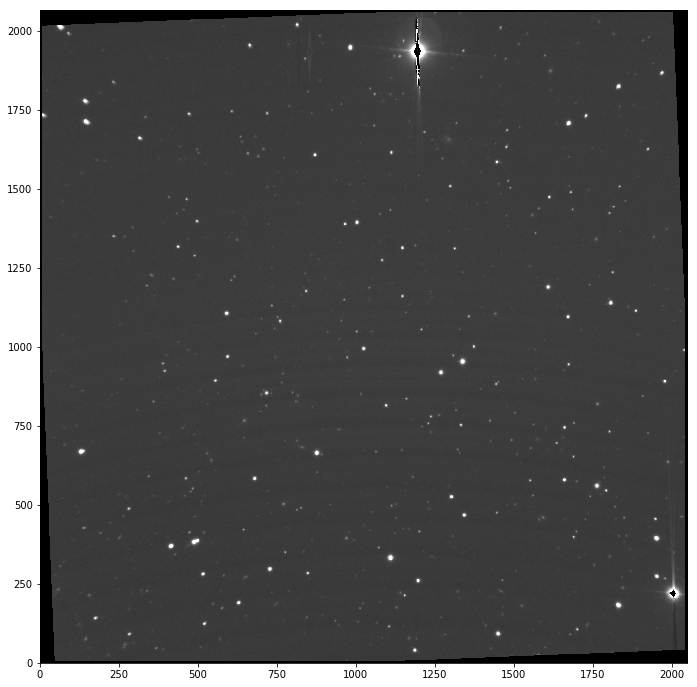

In [5]:
Raw_Datacube.display(Raw_Datacube.raw_stack_field, vmax=100)

In [4]:
Raw_Datacube.save_mask_edge(save_path='/home/qliu/data/A2390F/')

In [6]:
Raw_Datacube.remove_background(save_path='./A2390NW/fig/bkg/', plot=False)

Removing background...Frame: 10
Removing background...Frame: 20
Removing background...Frame: 30
Removing background...Frame: 40
Removing background...Frame: 50
Removing background...Frame: 60


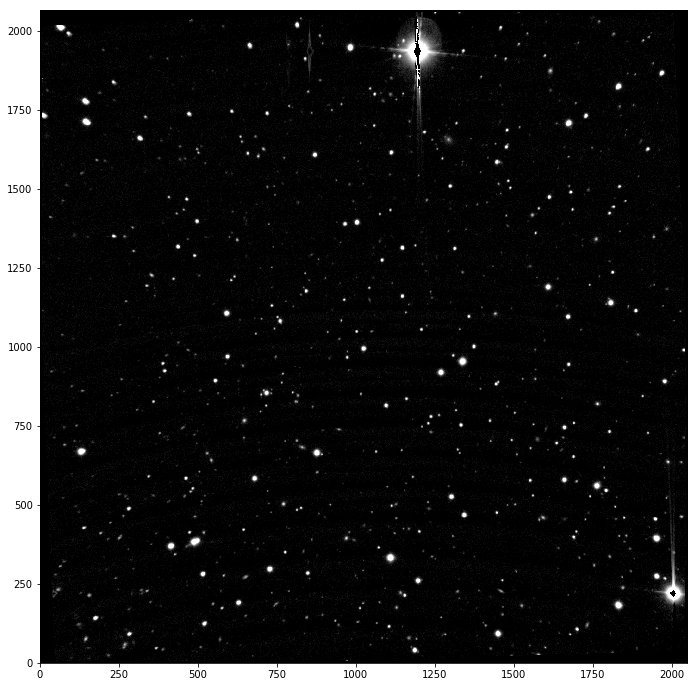

In [13]:
Raw_Datacube.display(Raw_Datacube.stack_field, vmax=20)

In [9]:
Raw_Datacube.wavl.shape

(69,)

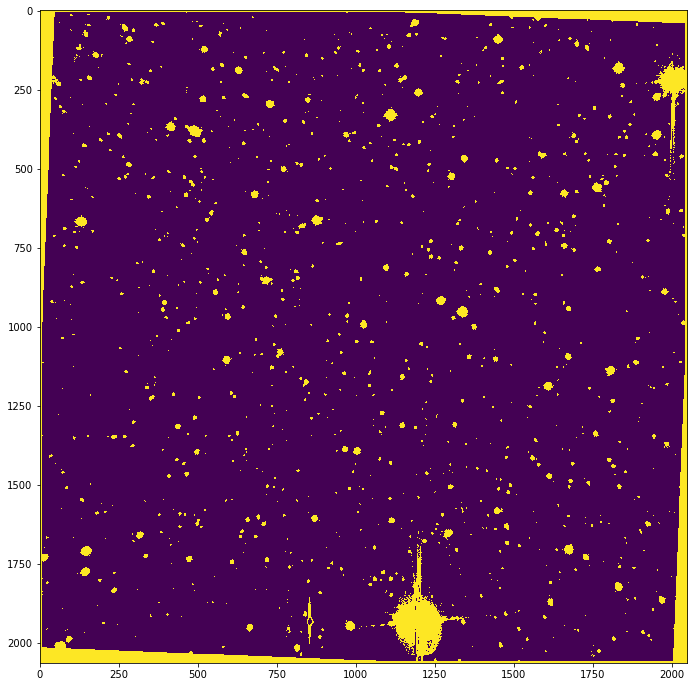

In [9]:
mask_source = Raw_Datacube.stack_field > 3*mad_std(Raw_Datacube.stack_field)
plt.figure(figsize=(12,12))
plt.imshow(np.logical_or(mask_source,Raw_Datacube.mask_edge))

In [20]:
Raw_Datacube.remove_fringe(skip_frames=range(8,100), save_path='./A2390NW/fig/fringe/', plot=False)

Removing fringe...Frame: 10
Removing fringe...Frame: 20
Removing fringe...Frame: 30
Removing fringe...Frame: 40
Removing fringe...Frame: 50
Removing fringe...Frame: 60


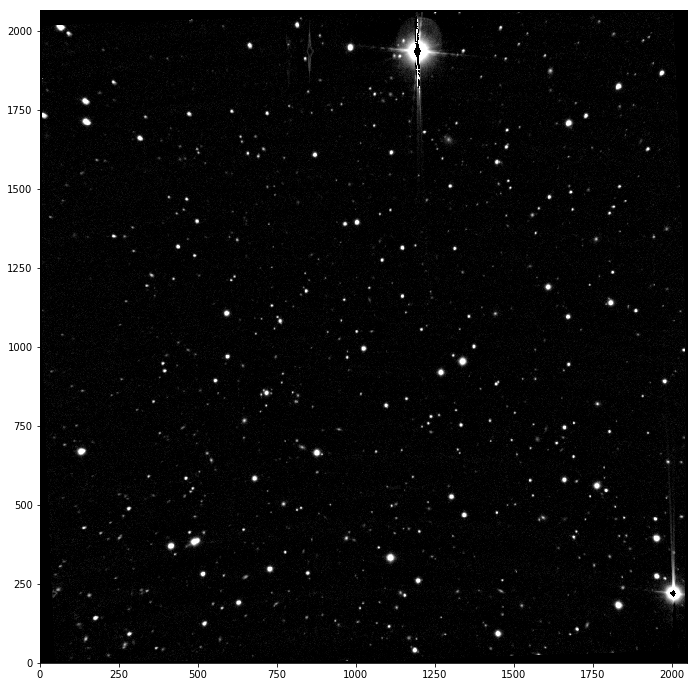

In [21]:
Raw_Datacube.display(Raw_Datacube.stack_field, vmax=20)

In [22]:
# Raw_Datacube.save_fits(save_path='/home/qliu/data/A2390F/',suffix="_nofringe")
Raw_Datacube.save_fits(save_path='/home/qliu/data/A2390F/',suffix="_v2")

Saving background & fringe subtracted datacube and stacked field...


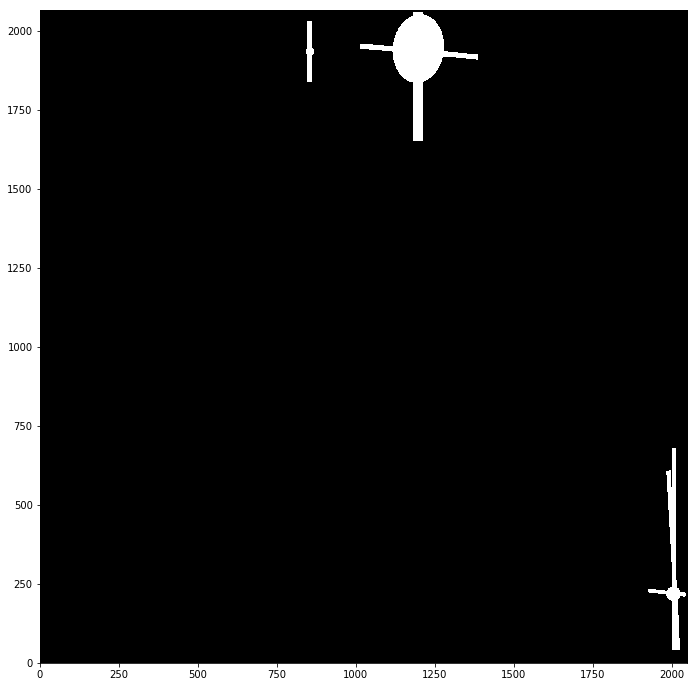

In [9]:
Raw_Datacube.save_weight_map(region_path="./A2390NW/SE/A2390NW.reg", weight=0.01, 
                             save_path = './A2390NW/SE/')
Raw_Datacube.display(Raw_Datacube.mymask,vmax=None)

## 2. Calculate seeing FWHM

In [2]:
Datacube = Read_Datacube("/home/qliu/data/A2390F/A2390NW_cube_v2.fits",name="A2390NW",
                         SE_catalog="./A2390NW/SE_v2/A2390NW_run1.cat")

(array([189.,  78.,  55.,  67., 216., 136.,  94.,  58.,  52., 385.]),
 array([0. , 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ]),
 <a list of 10 Patch objects>)

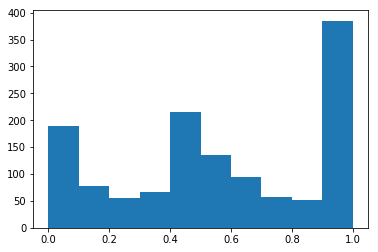

In [3]:
plt.hist(Datacube.Tab_SE["CLASS_STAR"])

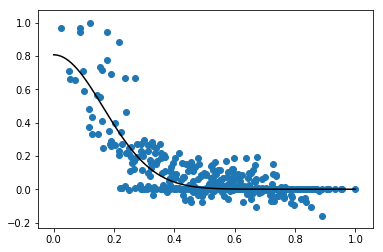

1.857046573895007


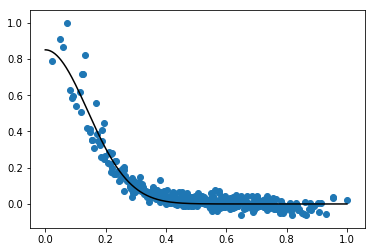

1.5848021046025065


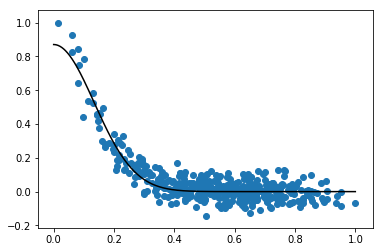

1.458166398993194


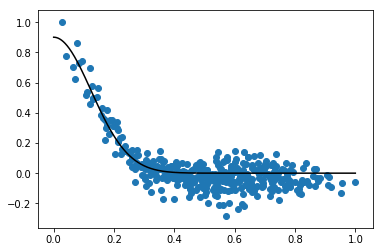

1.4181165799440536


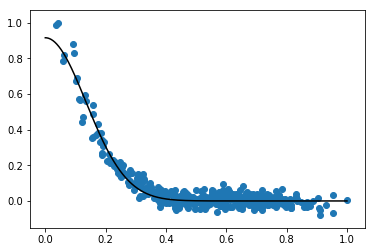

1.4989901872940943


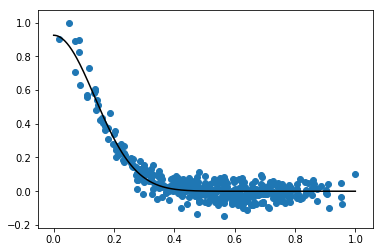

1.5092328365406176


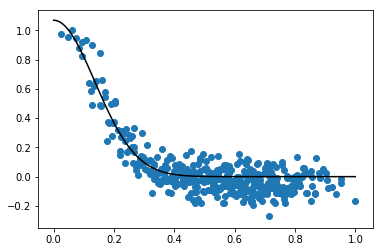

1.5039063858059485


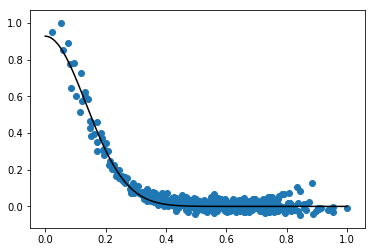

1.507569215296829


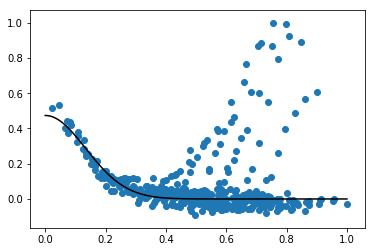

1.5511043936968854


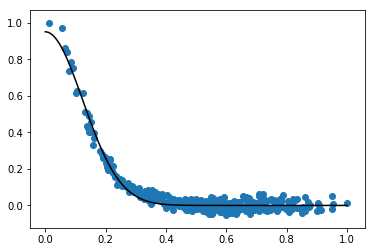

1.3903249570526792


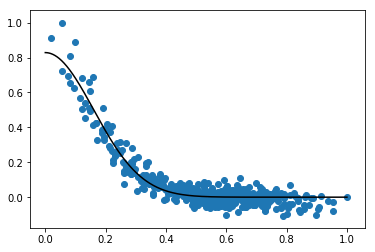

1.8016627402413674


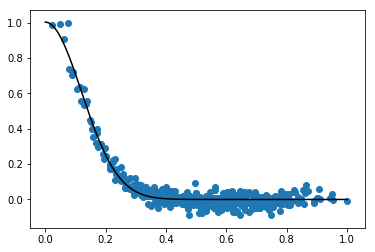

1.3436538193487653


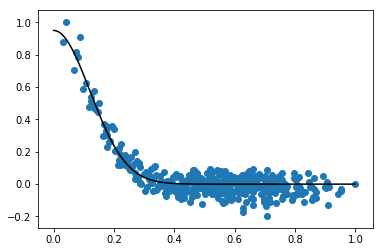

1.3229809324427608


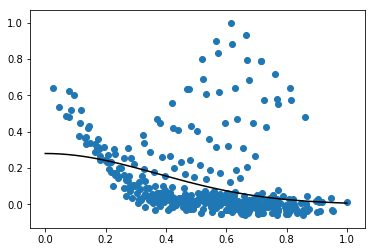

4.049481106230074


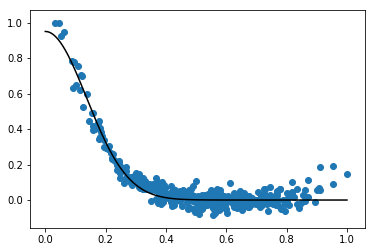

1.5660723912465881


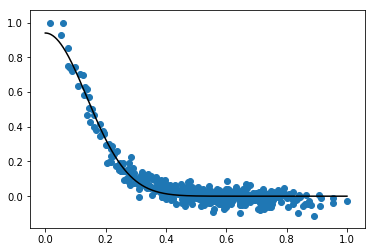

1.6002834930436676


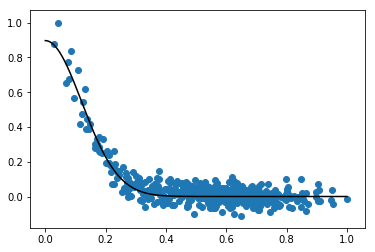

1.3375968404998113


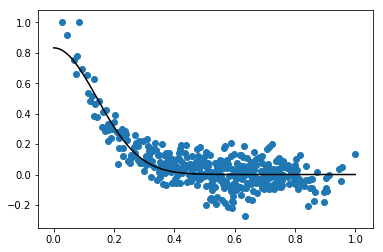

1.5876410248707429


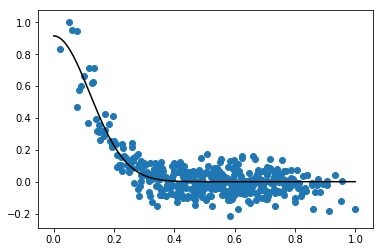

1.3541743848062513


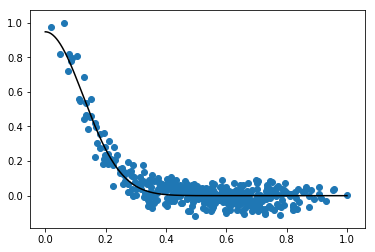

1.4312427763390643


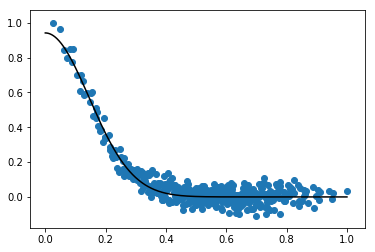

1.621139961796392


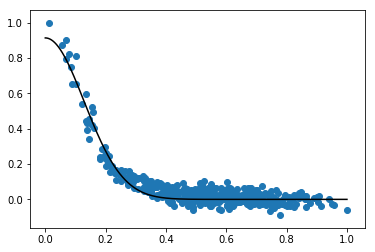

1.4617823445340432


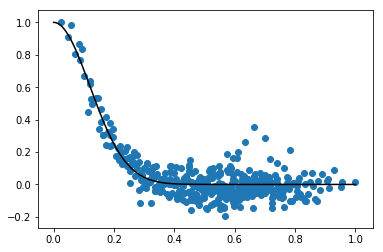

1.357314867486308


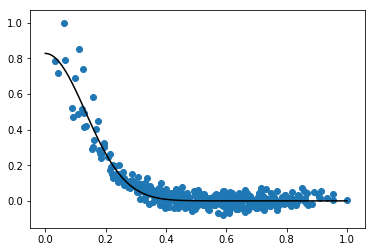

1.4696124086929891


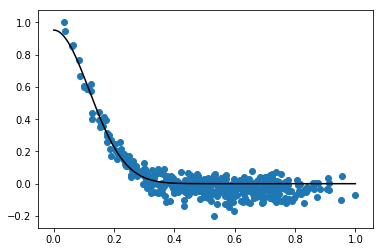

1.3485535544403522


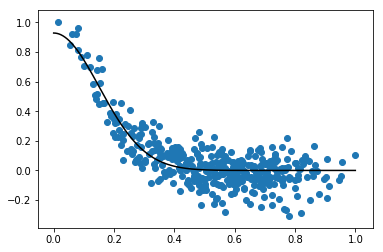

1.6970792278924314


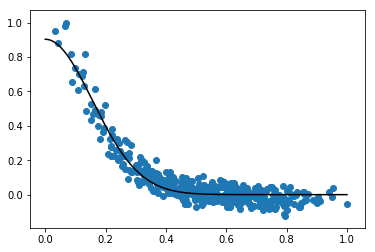

1.738236484849102


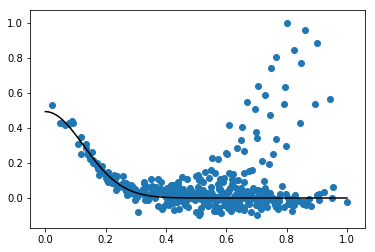

1.3903719072444154


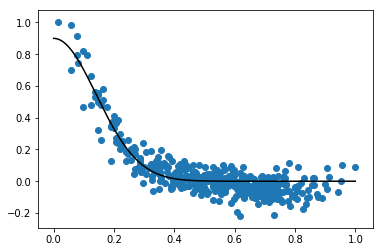

1.5896261481089355


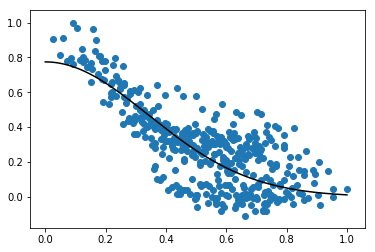

3.8256668701696395


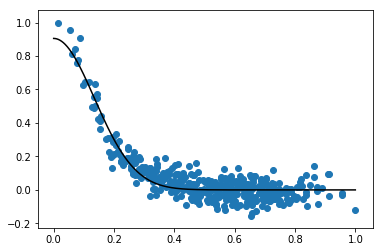

1.5713727939934272


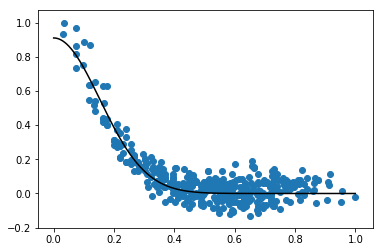

1.7588333330865293


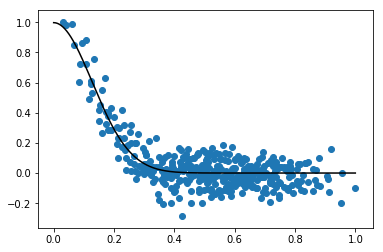

1.4500057289472297


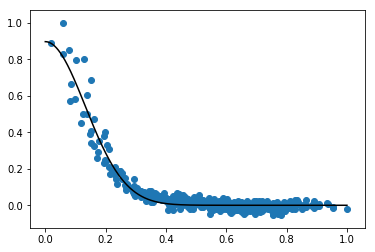

1.4469801990839657


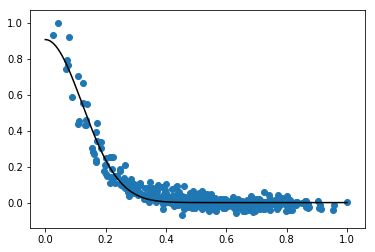

1.4156599824309961


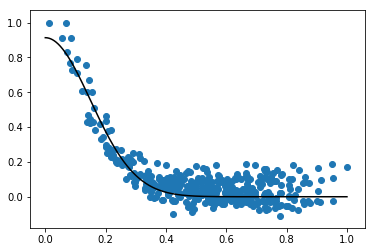

1.674429603683032


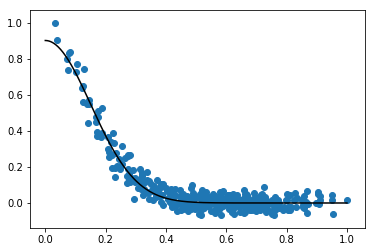

1.6552024262170897


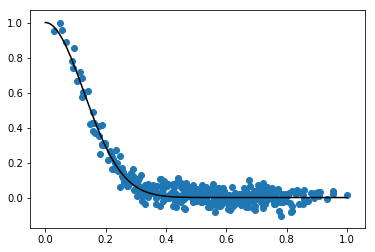

1.428671194707799


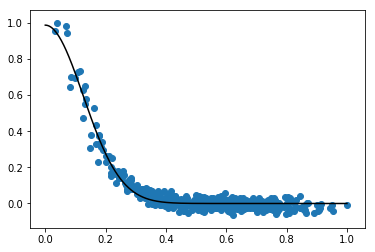

1.3799135430973193


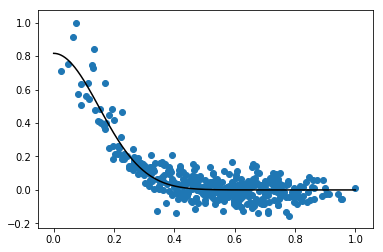

1.6790349177154693


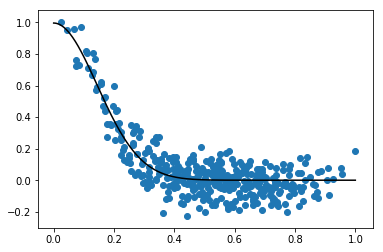

1.6410406060502207


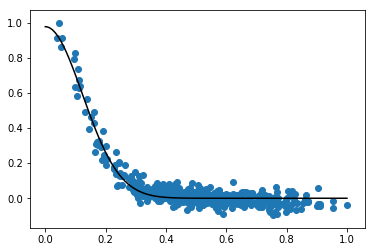

1.3986531057986384


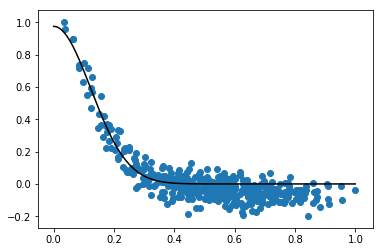

1.4038390885783074


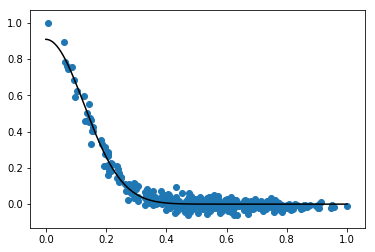

1.4304186444365907


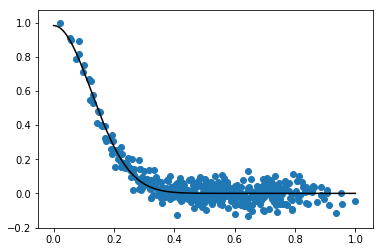

1.4068543305076353


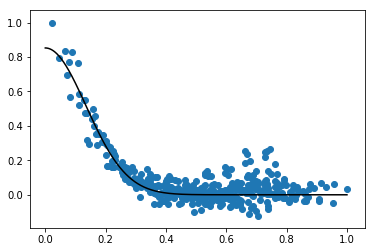

1.5388165944356869


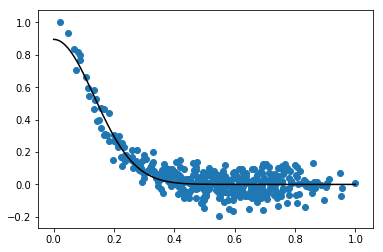

1.4990933277960004


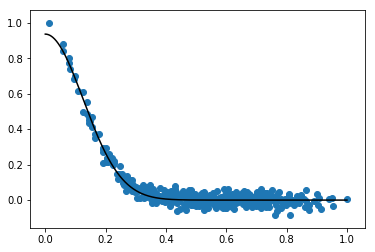

1.4174856228905506


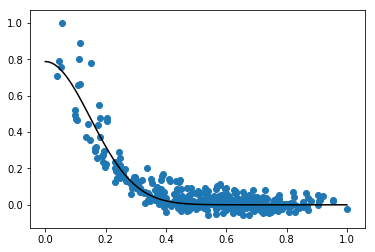

1.6758676822436993


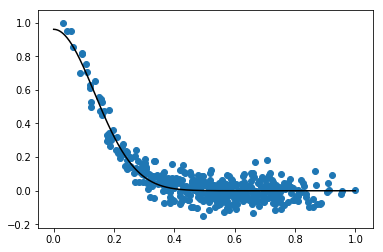

1.5345094812277302


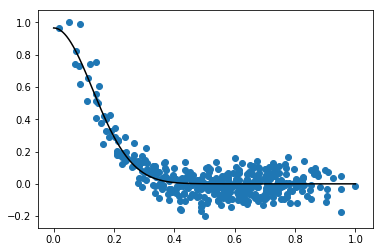

1.4048392458739587


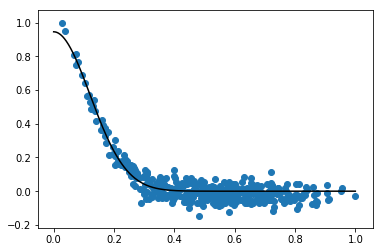

1.3868634302205658


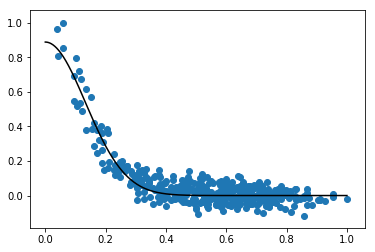

1.4828824863960892


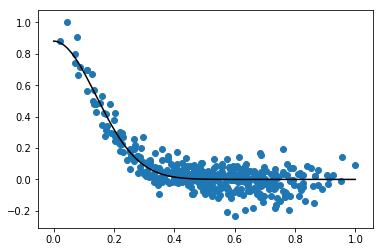

1.6045445494054478


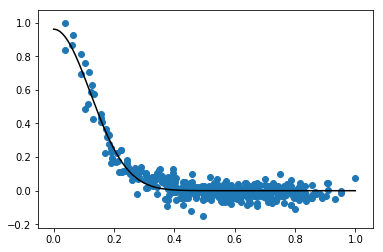

1.3501163079852998


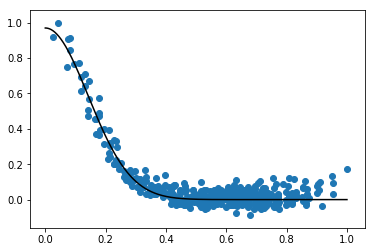

1.5488822634639705


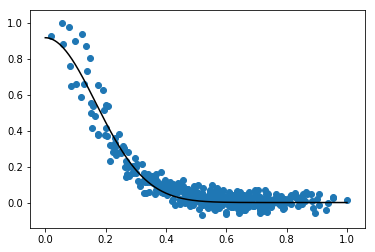

1.8261003725422076


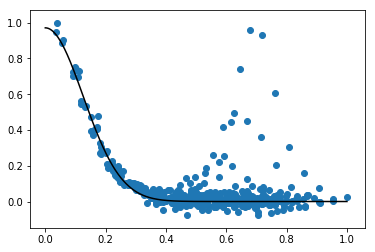

1.4304030608162823


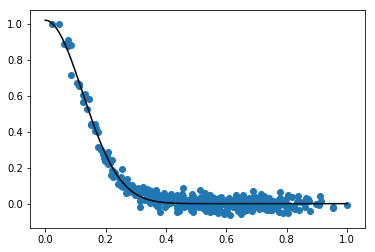

1.428274754609881


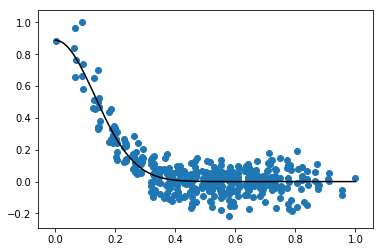

1.5494549323256765


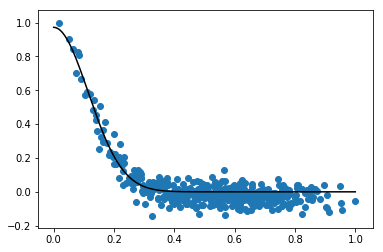

1.2764917339573152


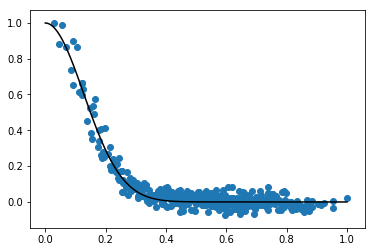

1.440096599089073


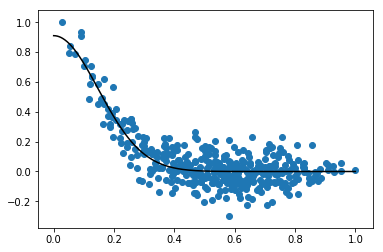

1.632395483241776


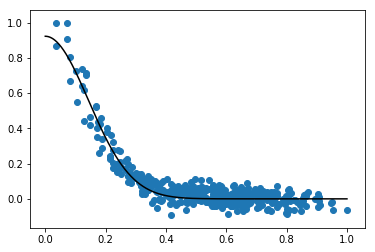

1.5777410313691955


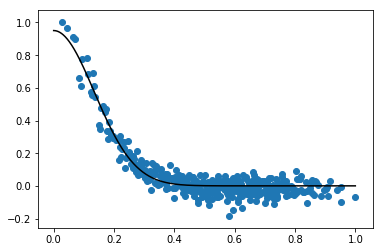

1.479479222860179


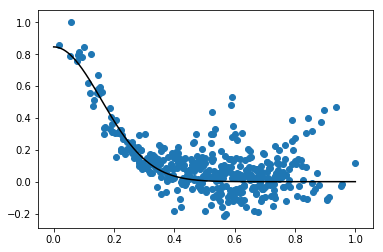

1.7905565835148374


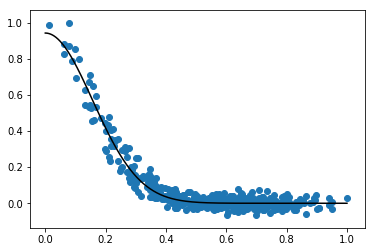

1.6980094468497604


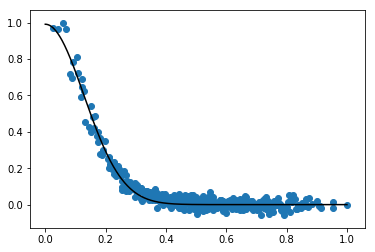

1.4726673080125976


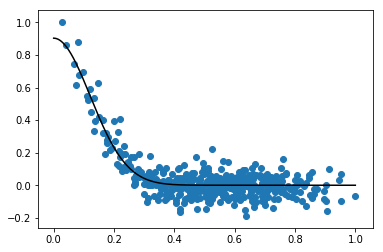

1.3443828997553084


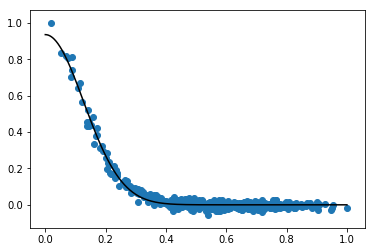

1.3814986400940492


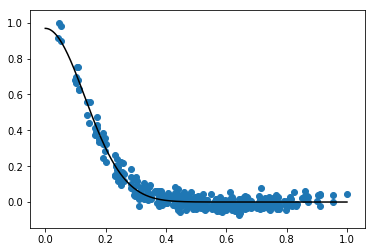

1.479873283144336


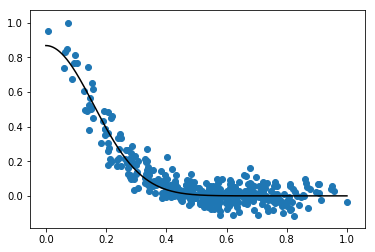

1.7915722730578245


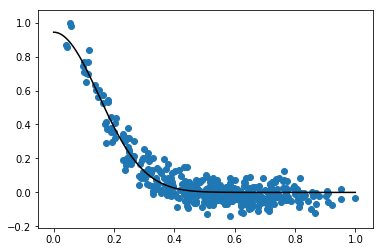

1.6740406025907095


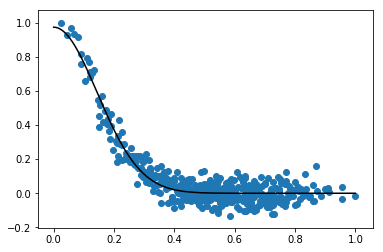

1.6590924021165079


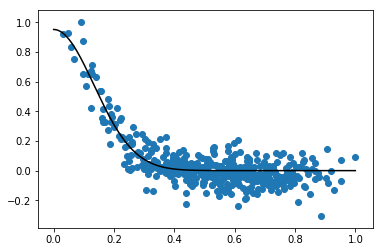

1.4761066522856345


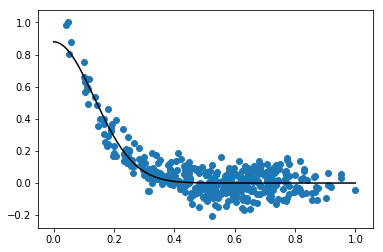

1.4949297570050863


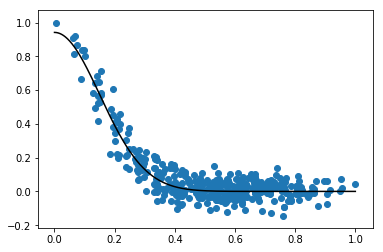

1.704837471446361


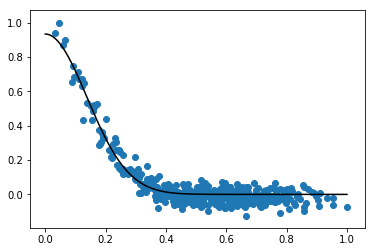

1.5416941097280819


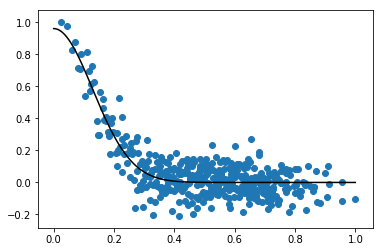

1.4896108867641116


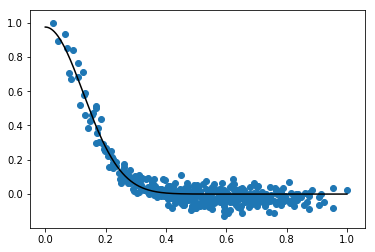

1.4301431361743064


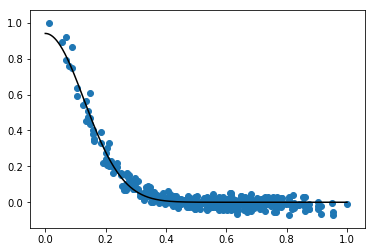

1.4367151667527445


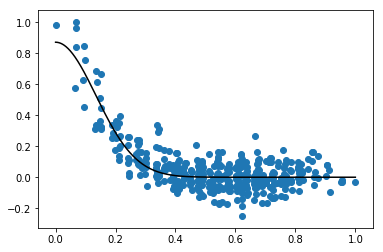

1.5130715198703575


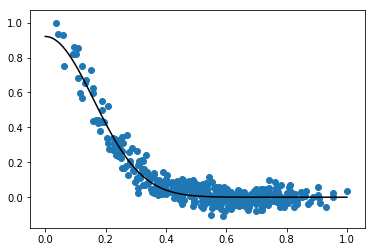

1.7912471641641972


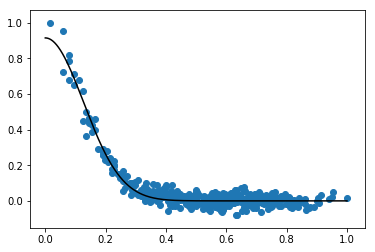

1.425139854713149


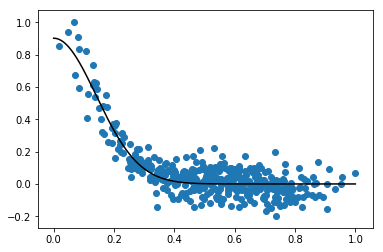

1.6087765754064638


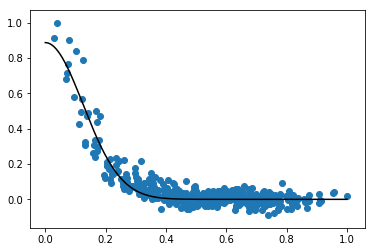

1.4423764290658447


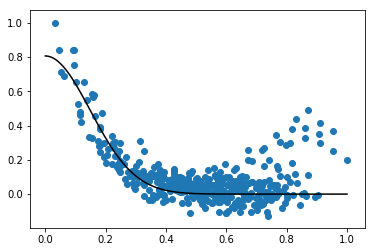

1.7001763436228106


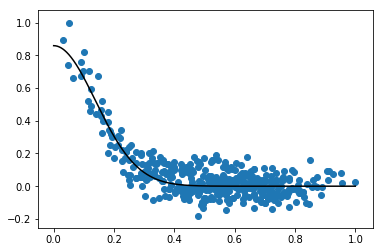

1.5680870273688658


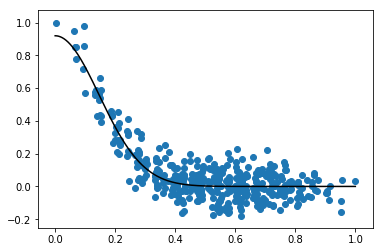

1.65329893218331


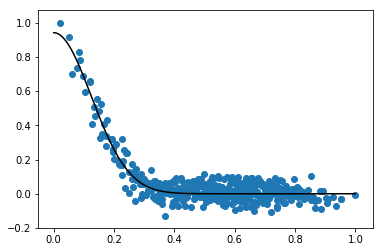

1.363969715776931


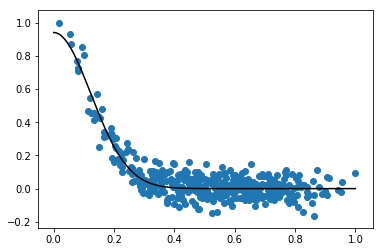

1.3872982830498883


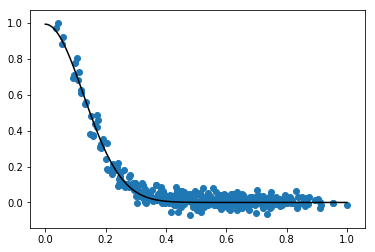

1.4332891011802469


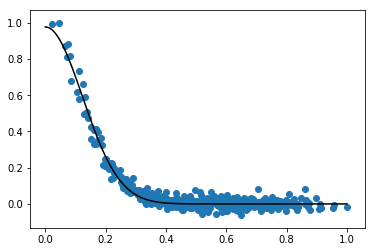

1.4281857049832691


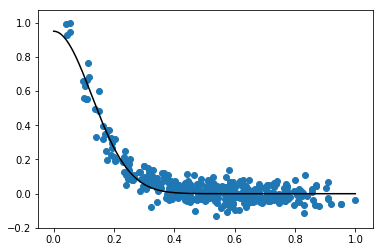

1.405105627033928


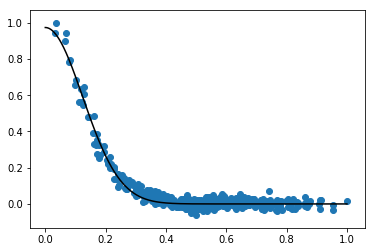

1.42453714844628


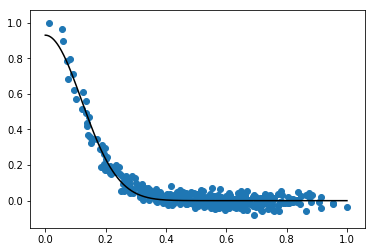

1.4033853829943617


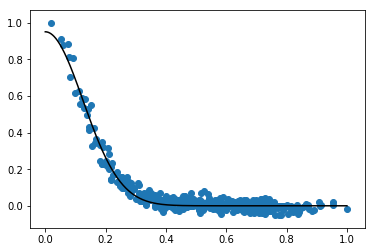

1.4468781188513484


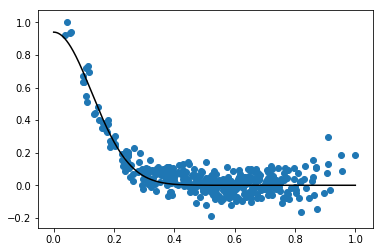

1.4246185344791324


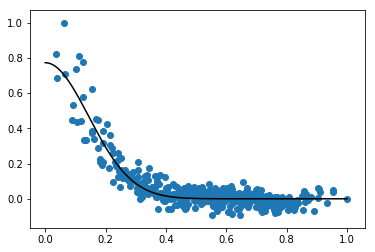

1.5995106017272478


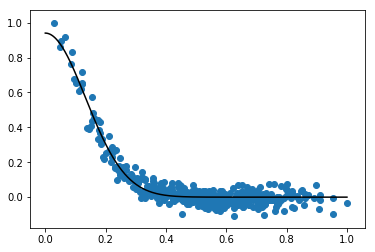

1.5287776664377624


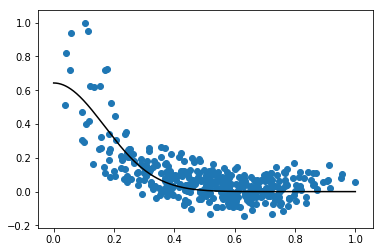

1.8992642290969066


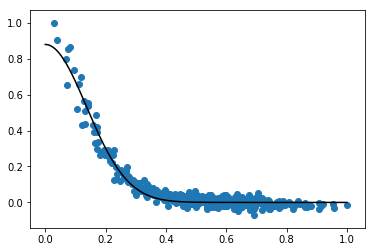

1.5639750544269673


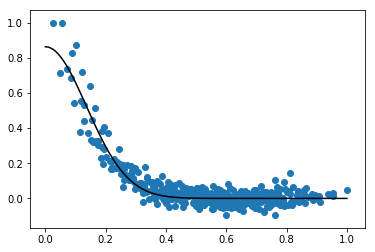

1.5334898332318345


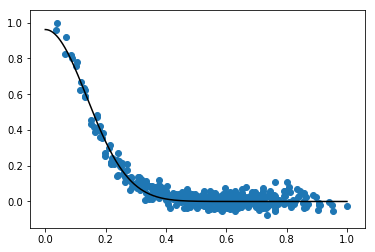

1.5239255698466398


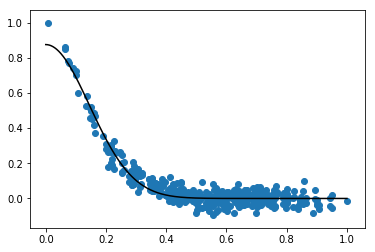

1.564413463207399


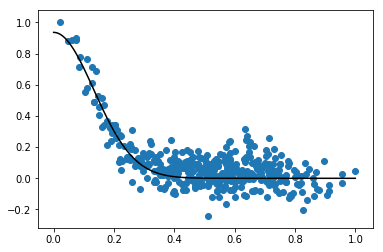

1.541518892887985


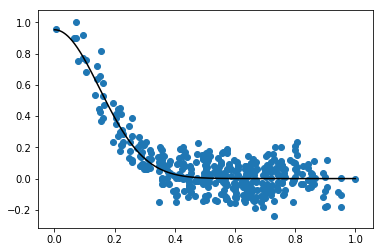

1.6134144769323906


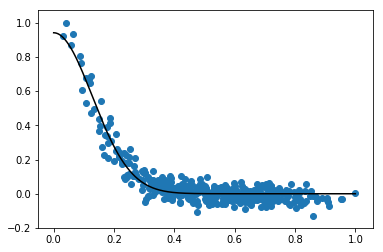

1.4622651559772908


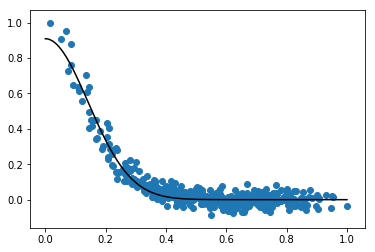

1.5414497005945604


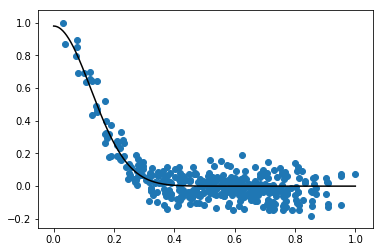

1.3534146434373873


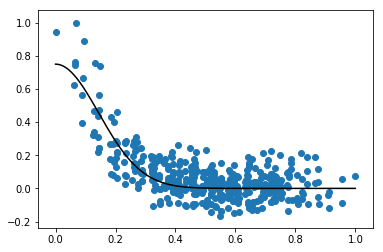

1.6940923359239808


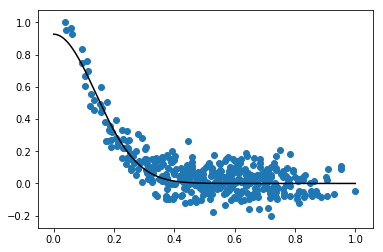

1.5491877516681603


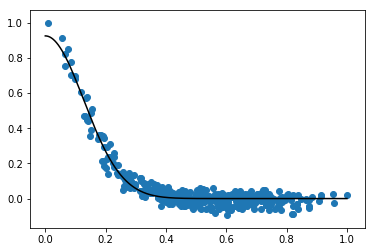

1.4892285980915476


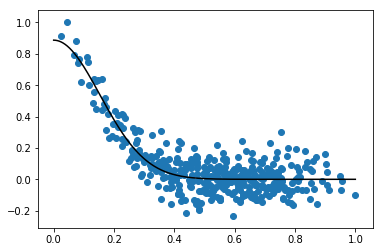

1.705197231687596


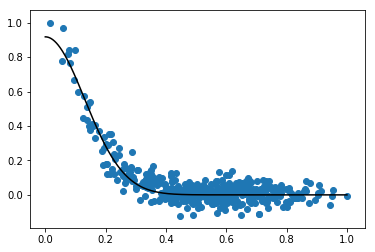

1.4668695731521681


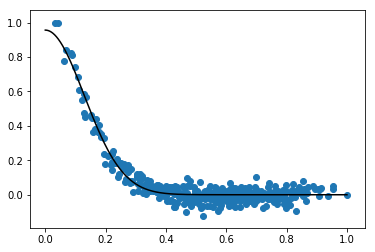

1.419097637817814


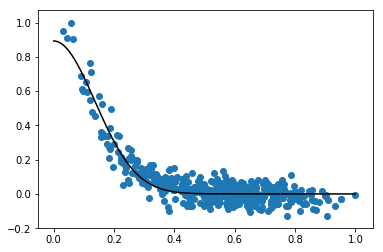

1.5293600634848898


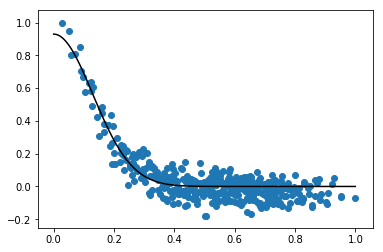

1.427352730265494


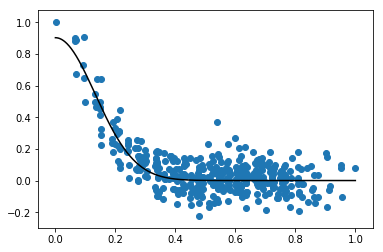

1.4913799958312473


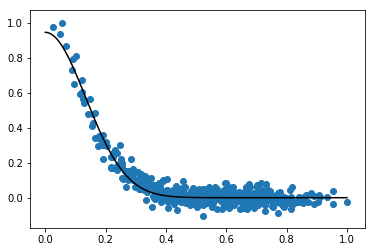

1.502619657690245


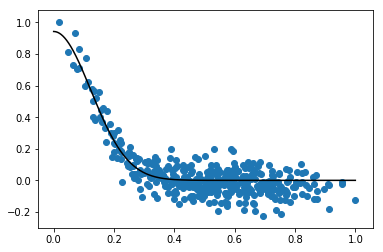

1.4287332050787518


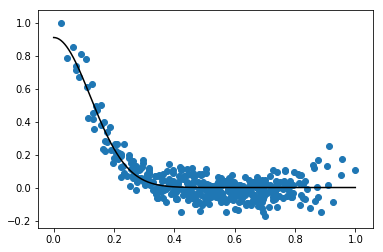

1.3871278112608225


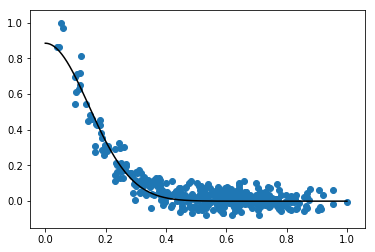

1.60360397562018


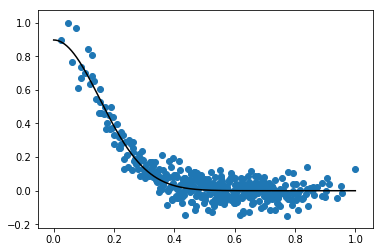

1.718418070747793


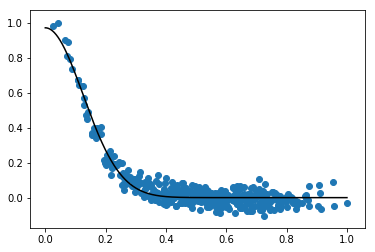

1.447828340452428


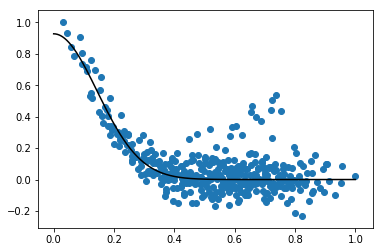

1.6124121590206484


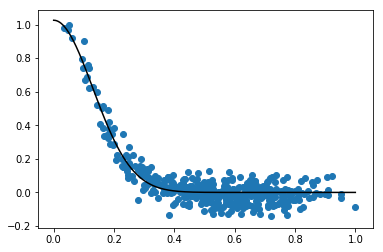

1.4572031335270472


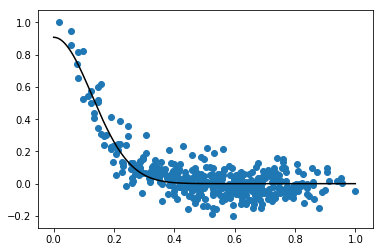

1.422326475714731


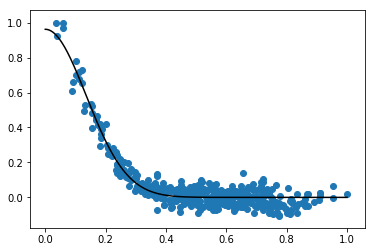

1.5421629922361633


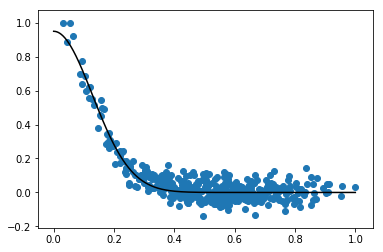

1.4662333052673657


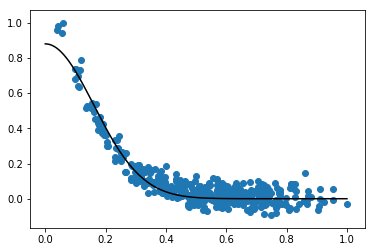

1.7902189421643402


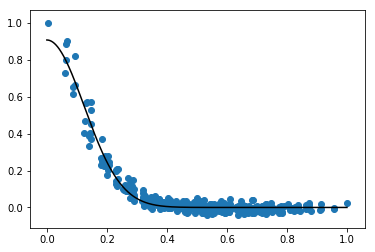

1.457819500544414


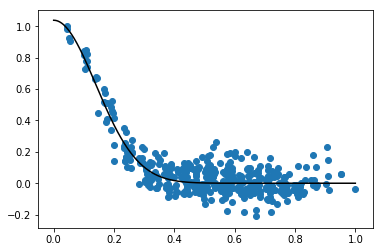

1.574210037381635


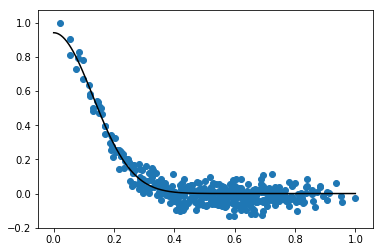

1.4645938538053362


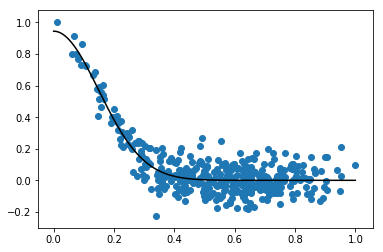

1.6113123556537965


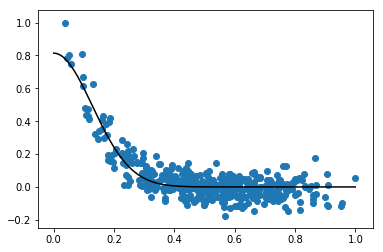

1.45889356322728


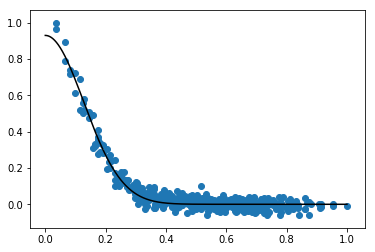

1.457166118869138


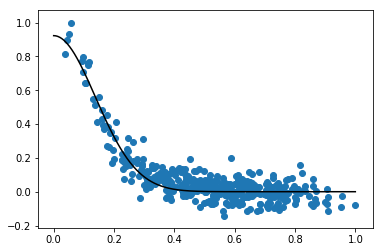

1.57466049762341


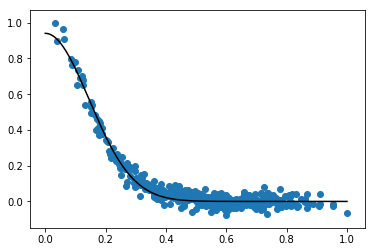

1.6605251078302352


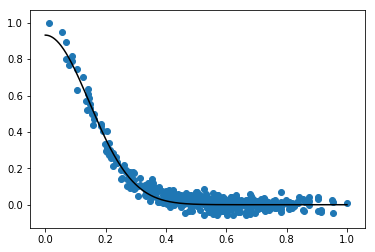

1.6260320433789237


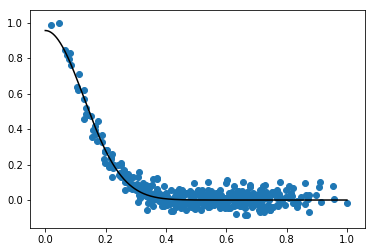

1.4782078949781443


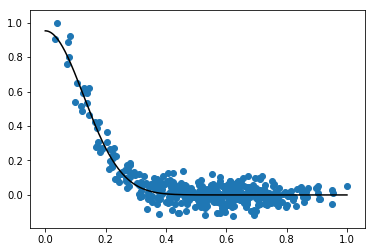

1.3972543233961727


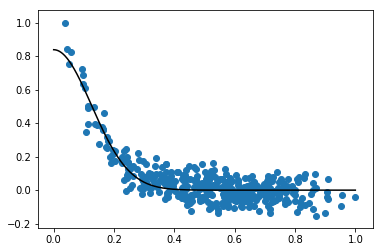

1.4212853190077401


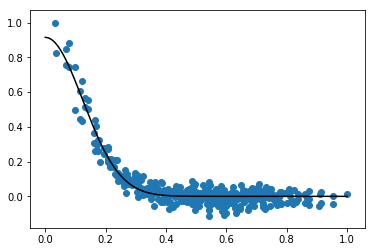

1.4233920394575679


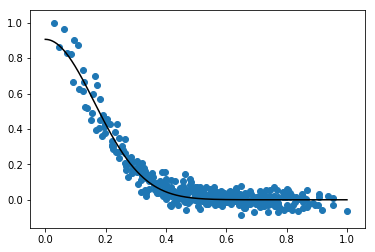

1.7964644923850976


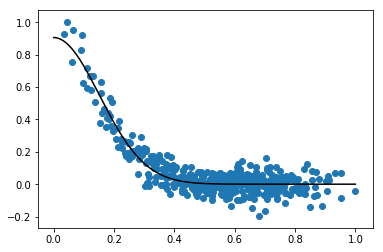

1.683022426413436


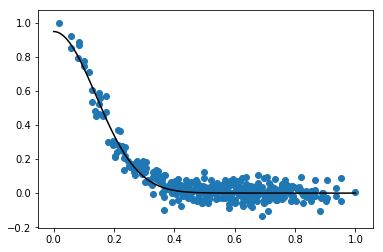

1.524458591464669


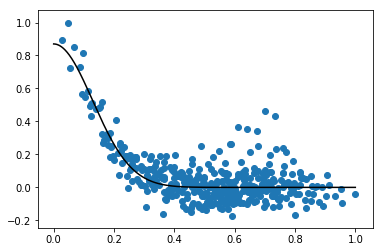

1.4461111131163387


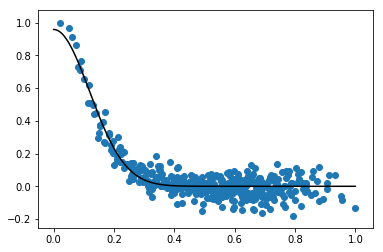

1.3449751298702604


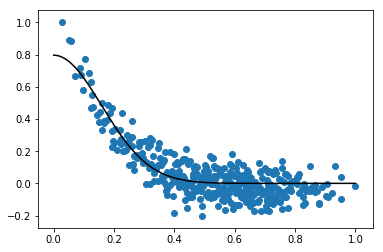

1.7524399740683403


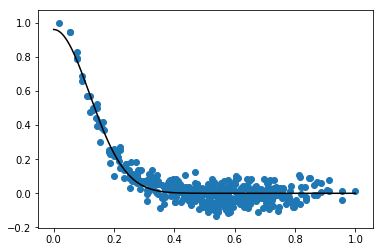

1.380942729530906


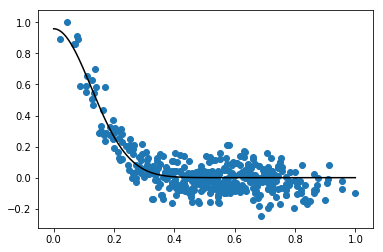

1.4451949450796768


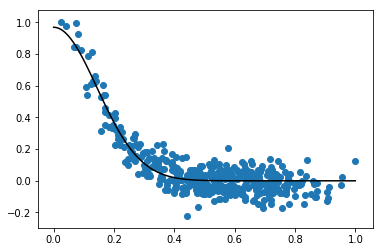

1.6604967897634715


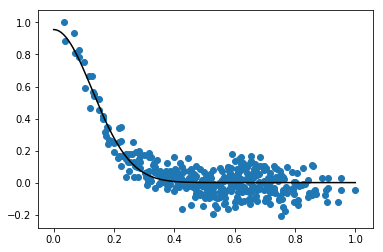

1.4086335690181615


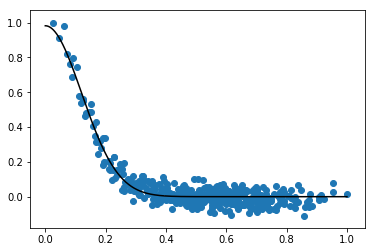

1.3675496571404324


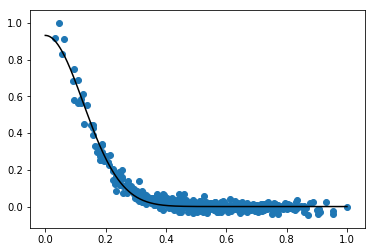

1.4073607359269786


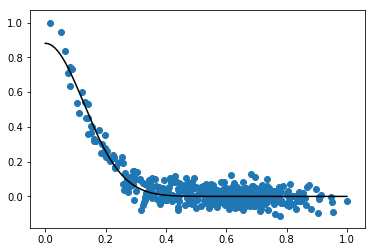

1.432311996715029


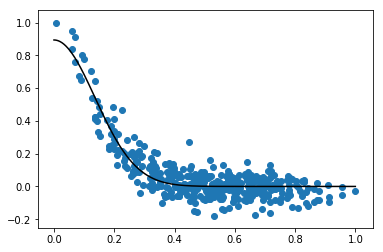

1.5946799531027434


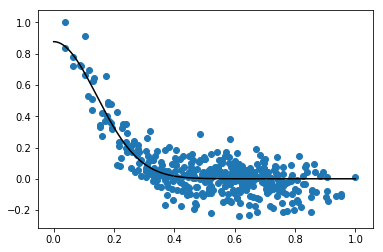

1.5842748058530804


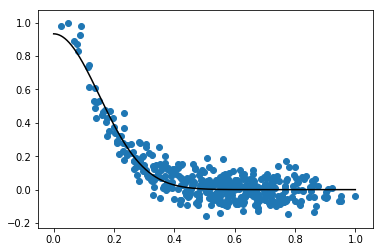

1.649326090883336


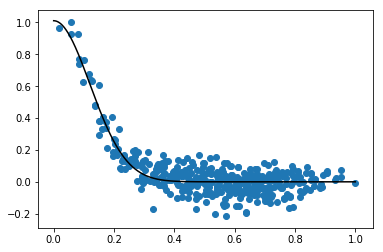

1.3113700221219966


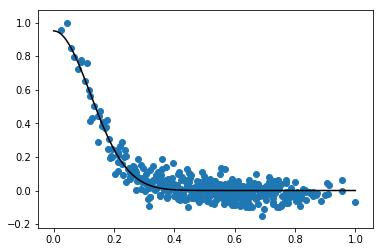

1.3982683115837262


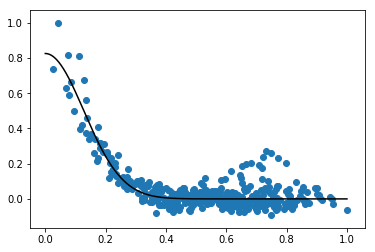

1.4002959569995332


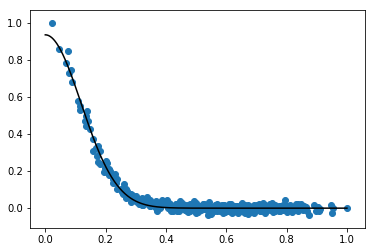

1.3187312011493004


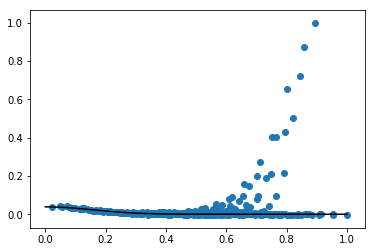

1.7784232482723956


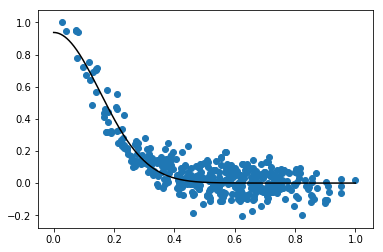

1.6944839847746151


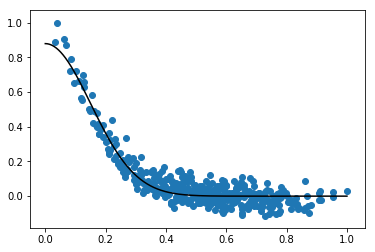

1.7252112230976353


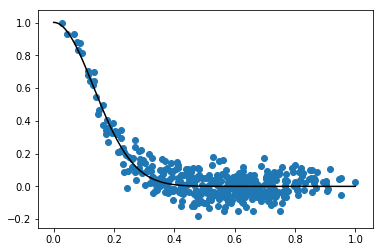

1.4509851288305085


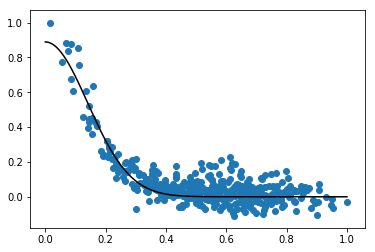

1.5264705768139384


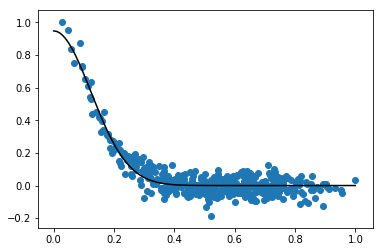

1.3819880151928663


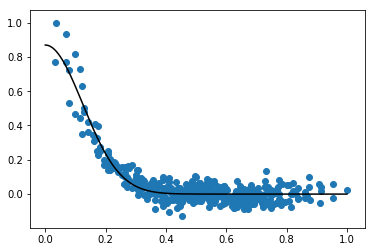

1.418736576992996


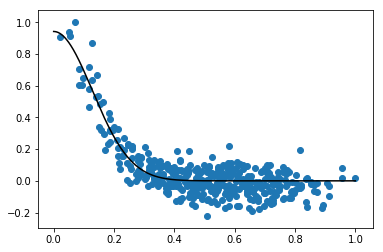

1.475254413565531


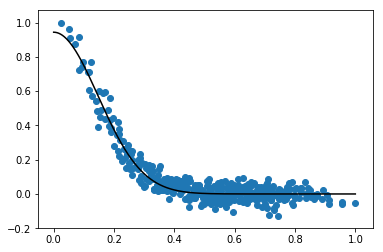

1.6964044791709538


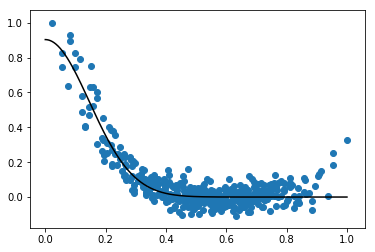

1.642096527910894


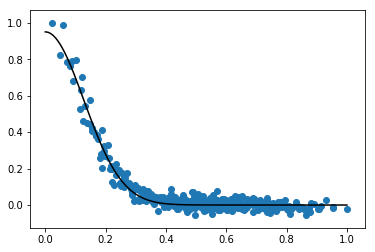

1.4439180869892003


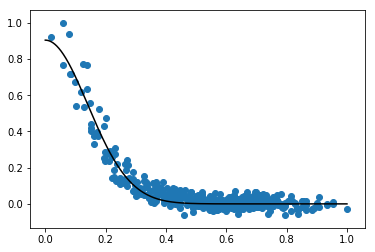

1.5365448926325738


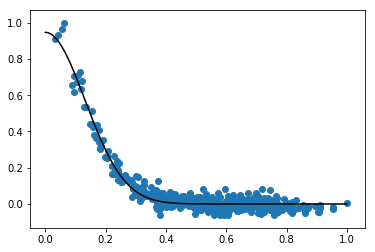

1.5013536286076488


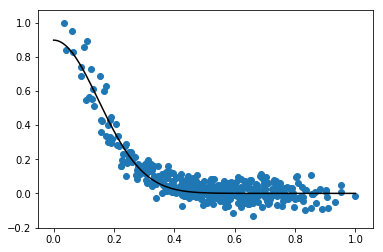

1.6608656517731168


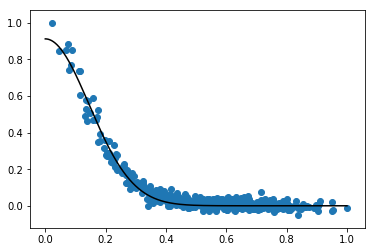

1.6149811782813122


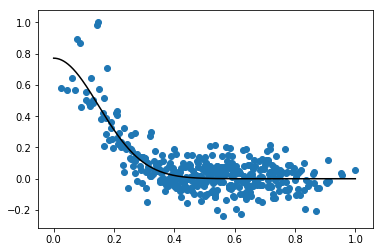

1.7145982504012751


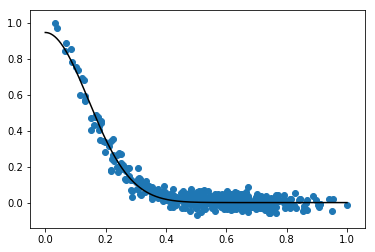

1.5714970261940764


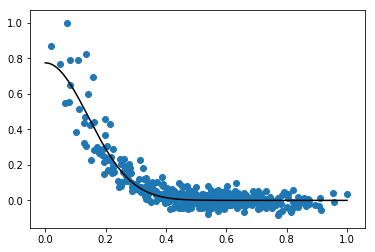

1.662598361065886


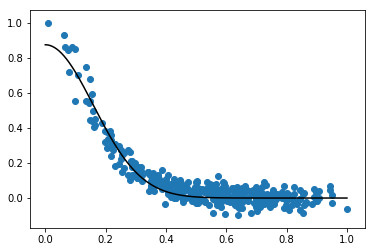

1.721608994059617


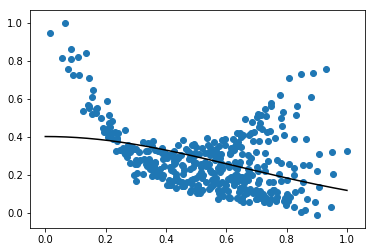

6.945134137117604
Median seeing FWHM in arcsec: 1.500


In [6]:
Datacube.calculate_seeing(mag_cut=[0.2,0.8], plot=True)

## 3. Spectra Extraction

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.stats import SigmaClip
from photutils import Background2D, SExtractorBackground
from pipeline import *
from utils import *
Datacube = Read_Datacube("/home/qliu/data/A2390F/A2390NW_cube_v2.fits",name="A2390NW",
                         SE_catalog="./A2390NW/SE_v2//A2390NW_run2.cat")
Datacube.read_mask('/home/qliu/data/A2390F/Raw_stack_A2390NW_mask.fits')
Datacube.read_seg('./A2390NW/SE_v2//segment_run2.fits')

Optimal Aperture: 1.4 Rp, SNR = 12.8863


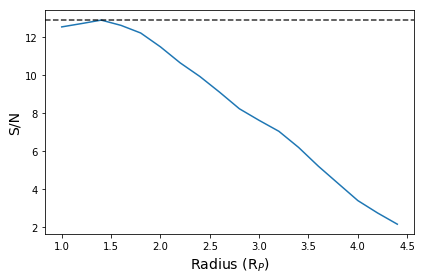

Optimal Aperture: 1.8 Rp, SNR = 5.6026


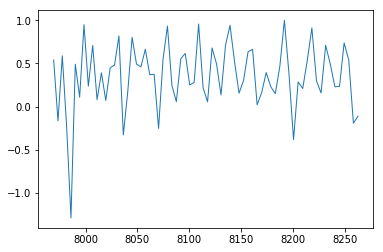

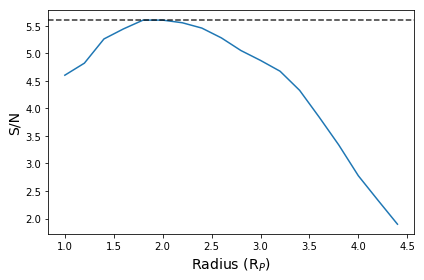

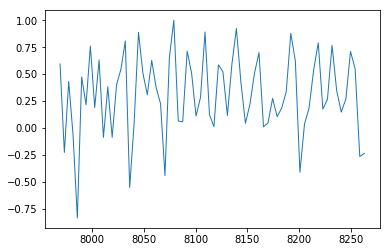

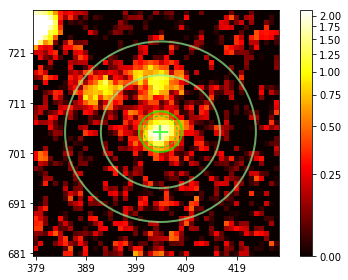

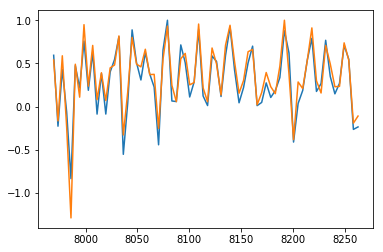

In [3]:
# Example
spec_sky, k_sky, snr_sky, apers_sky = Datacube.spec_extraction(num=600, ext_type='sky', k1=5., k2=8, 
                                                               print_out=True, plot=True, display=False)
spec_opt, k_opt, snr_opt, apers_opt = Datacube.spec_extraction(num=600, ext_type='opt', k1=5., k2=8,
                                                               print_out=True, plot=True, display=True)
apers_sky[0].plot(color='limegreen',ls='--')
plt.show()
plt.plot(Datacube.wavl, spec_opt/spec_opt.max())
plt.plot(Datacube.wavl, spec_sky/spec_sky.max())

In [4]:
# Pipe
Datacube.spec_extraction_all(ks = np.arange(1.,4.,0.1), k1=5., k2=8., save_path='./A2390NW/fig/img_thumb_v2/', display=True)

#1 spectra extracted
#2 spectra extracted
#3 spectra extracted
#4 spectra extracted
#5 spectra extracted
#6 spectra extracted
#7 spectra extracted
#8 spectra extracted
#9 spectra extracted
#10 spectra extracted
#11 spectra extracted
#12 spectra extracted
#13 spectra extracted
#14 spectra extracted
#15 spectra extracted
#16 spectra extracted
#17 spectra extracted
#18 spectra extracted
#19 spectra extracted
#20 spectra extracted
#21 spectra extracted
#22 spectra extracted
#23 spectra extracted
#24 spectra extracted
#25 spectra extracted
#26 spectra extracted
#27 spectra extracted
#28 spectra extracted
#29 spectra extracted
#30 spectra extracted
#31 spectra extracted
#32 spectra extracted
#33 spectra extracted
#34 spectra extracted
#35 spectra extracted
#36 spectra extracted
#37 spectra extracted
#38 spectra extracted
#39 spectra extracted
#40 spectra extracted
#41 spectra extracted
#42 spectra extracted
#43 spectra extracted
#44 spectra extracted
#45 spectra extracted
#46 spectra extract

#362 spectra extracted
#363 spectra extracted
#364 spectra extracted
#365 spectra extracted
#366 spectra extracted
#367 spectra extracted
#368 spectra extracted
#369 spectra extracted
#370 spectra extracted
#371 spectra extracted
#372 spectra extracted
#373 spectra extracted
#374 spectra extracted
#375 spectra extracted
#376 spectra extracted
#377 spectra extracted
#378 spectra extracted
#379 spectra extracted
#380 spectra extracted
#381 spectra extracted
#382 spectra extracted
#383 spectra extracted
#384 spectra extracted
#385 spectra extracted
#386 spectra extracted
#387 spectra extracted
#388 spectra extracted
#389 spectra extracted
#390 spectra extracted
#391 spectra extracted
#392 spectra extracted
#393 spectra extracted
#394 spectra extracted
#395 spectra extracted
#396 spectra extracted
#397 spectra extracted
#398 spectra extracted
#399 spectra extracted
#400 spectra extracted
#401 spectra extracted
#402 spectra extracted
#403 spectra extracted
#404 spectra extracted
#405 spectr

#719 spectra extracted
#720 spectra extracted
#721 spectra extracted
#722 spectra extracted
#723 spectra extracted
#724 spectra extracted
#725 spectra extracted
#726 spectra extracted
#727 spectra extracted
#728 spectra extracted
#729 spectra extracted
#730 spectra extracted
#731 spectra extracted
#732 spectra extracted
#733 spectra extracted
#734 spectra extracted
#735 spectra extracted
#736 spectra extracted
#737 spectra extracted
#738 spectra extracted
#739 spectra extracted
#740 spectra extracted
#741 spectra extracted
#742 spectra extracted
#743 spectra extracted
#744 spectra extracted
#745 spectra extracted
#746 spectra extracted
#747 spectra extracted
#748 spectra extracted
#749 spectra extracted
#750 spectra extracted
#751 spectra extracted
#752 spectra extracted
#753 spectra extracted
#754 spectra extracted
#755 spectra extracted
#756 spectra extracted
#757 spectra extracted
#758 spectra extracted
#759 spectra extracted
#760 spectra extracted
#761 spectra extracted
#762 spectr

#1073 spectra extracted
#1074 spectra extracted
#1075 spectra extracted
#1076 spectra extracted
#1077 spectra extracted
#1078 spectra extracted
#1079 spectra extracted
#1080 spectra extracted
#1081 spectra extracted
#1082 spectra extracted
#1083 spectra extracted
#1084 spectra extracted
#1085 spectra extracted
#1086 spectra extracted
#1087 spectra extracted
#1088 spectra extracted
#1089 spectra extracted
#1090 spectra extracted
#1091 spectra extracted
#1092 spectra extracted
#1093 spectra extracted
#1094 spectra extracted
#1095 spectra extracted
#1096 spectra extracted
#1097 spectra extracted
#1098 spectra extracted
#1099 spectra extracted
#1100 spectra extracted
#1101 spectra extracted
#1102 spectra extracted
#1103 spectra extracted
#1104 spectra extracted
#1105 spectra extracted
#1106 spectra extracted
#1107 spectra extracted
#1108 spectra extracted
#1109 spectra extracted
#1110 spectra extracted
#1111 spectra extracted
#1112 spectra extracted
#1113 spectra extracted
#1114 spectra ex

#1415 spectra extracted
#1416 spectra extracted
#1417 spectra extracted
#1418 spectra extracted
#1419 spectra extracted
#1420 spectra extracted
#1421 spectra extracted
#1422 spectra extracted
#1423 spectra extracted
#1424 spectra extracted
#1425 spectra extracted
#1426 spectra extracted
#1427 spectra extracted
#1428 spectra extracted
#1429 spectra extracted
#1430 spectra extracted
#1431 spectra extracted
#1432 spectra extracted
#1433 spectra extracted
#1434 spectra extracted
#1435 spectra extracted
#1436 spectra extracted
#1437 spectra extracted
#1438 spectra extracted
#1439 spectra extracted
#1440 spectra extracted
#1441 spectra extracted
#1442 spectra extracted
#1443 spectra extracted
#1444 spectra extracted
#1445 spectra extracted
#1446 spectra extracted
#1447 spectra extracted
#1448 spectra extracted
#1449 spectra extracted
#1450 spectra extracted
#1451 spectra extracted
#1452 spectra extracted
#1453 spectra extracted
#1454 spectra extracted
#1455 spectra extracted
#1456 spectra ex

In [5]:
# Pipe
Datacube.fit_continuum_all(model='GP', plot=True, save_path='./A2390NW/fig/fit_cont_v2/')

#1 spectra continuum fitted
#2 spectra continuum fitted
#3 spectra continuum fitted
#4 spectra continuum fitted
#5 spectra continuum fitted
#6 spectra continuum fitted
#7 spectra continuum fitted
#8 spectra continuum fitted
#9 spectra continuum fitted
#10 spectra continuum fitted
#11 spectra continuum fitted
#12 spectra continuum fitted
#13 spectra continuum fitted
#14 spectra continuum fitted
#15 spectra continuum fitted
#16 spectra continuum fitted
#17 spectra continuum fitted
#18 spectra continuum fitted
#19 spectra continuum fitted
#20 spectra continuum fitted
#21 spectra continuum fitted
#22 spectra continuum fitted
#23 spectra continuum fitted
#24 spectra continuum fitted
#25 spectra continuum fitted
#26 spectra continuum fitted
#27 spectra continuum fitted
#28 spectra continuum fitted
#29 spectra continuum fitted
#30 spectra continuum fitted
#31 spectra continuum fitted
#32 spectra continuum fitted
#33 spectra continuum fitted
#34 spectra continuum fitted
#35 spectra continuum f

#279 spectra continuum fitted
#280 spectra continuum fitted
#281 spectra continuum fitted
#282 spectra continuum fitted
#283 spectra continuum fitted
#284 spectra continuum fitted
#285 spectra continuum fitted
#286 spectra continuum fitted
#287 spectra continuum fitted
#288 spectra continuum fitted
#289 spectra continuum fitted
#290 spectra continuum fitted
#291 spectra continuum fitted
#292 spectra continuum fitted
#293 spectra continuum fitted
#294 spectra continuum fitted
#295 spectra continuum fitted
#296 spectra continuum fitted
#297 spectra continuum fitted
#298 spectra continuum fitted
#299 spectra continuum fitted
#300 spectra continuum fitted
#301 spectra continuum fitted
#302 spectra continuum fitted
#303 spectra continuum fitted
#304 spectra continuum fitted
#305 spectra continuum fitted
#306 spectra continuum fitted
#307 spectra continuum fitted
#308 spectra continuum fitted
#309 spectra continuum fitted
#310 spectra continuum fitted
#311 spectra continuum fitted
#312 spect

#554 spectra continuum fitted
#555 spectra continuum fitted
#556 spectra continuum fitted
#557 spectra continuum fitted
#558 spectra continuum fitted
#559 spectra continuum fitted
#560 spectra continuum fitted
#561 spectra continuum fitted
#562 spectra continuum fitted
#563 spectra continuum fitted
#564 spectra continuum fitted
#565 spectra continuum fitted
#566 spectra continuum fitted
#567 spectra continuum fitted
#568 spectra continuum fitted
#569 spectra continuum fitted
#570 spectra continuum fitted
#571 spectra continuum fitted
#572 spectra continuum fitted
#573 spectra continuum fitted
#574 spectra continuum fitted
#575 spectra continuum fitted
#576 spectra continuum fitted
#577 spectra continuum fitted
#578 spectra continuum fitted
#579 spectra continuum fitted
#580 spectra continuum fitted
#581 spectra continuum fitted
#582 spectra continuum fitted
#583 spectra continuum fitted
#584 spectra continuum fitted
#585 spectra continuum fitted
#586 spectra continuum fitted
#587 spect

#828 spectra continuum fitted
#829 spectra continuum fitted
#830 spectra continuum fitted
#831 spectra continuum fitted
#832 spectra continuum fitted
#833 spectra continuum fitted
#834 spectra continuum fitted
#835 spectra continuum fitted
#836 spectra continuum fitted
#837 spectra continuum fitted
#838 spectra continuum fitted
#839 spectra continuum fitted
#840 spectra continuum fitted
#841 spectra continuum fitted
#842 spectra continuum fitted
#843 spectra continuum fitted
#844 spectra continuum fitted
#845 spectra continuum fitted
#846 spectra continuum fitted
#847 spectra continuum fitted
#848 spectra continuum fitted
#849 spectra continuum fitted
#850 spectra continuum fitted
#851 spectra continuum fitted
#852 spectra continuum fitted
#853 spectra continuum fitted
#854 spectra continuum fitted
#855 spectra continuum fitted
#856 spectra continuum fitted
#857 spectra continuum fitted
#858 spectra continuum fitted
#859 spectra continuum fitted
#860 spectra continuum fitted
#861 spect

#1098 spectra continuum fitted
#1099 spectra continuum fitted
#1100 spectra continuum fitted
#1101 spectra continuum fitted
#1102 spectra continuum fitted
#1103 spectra continuum fitted
#1104 spectra continuum fitted
#1105 spectra continuum fitted
#1106 spectra continuum fitted
#1107 spectra continuum fitted
#1108 spectra continuum fitted
#1109 spectra continuum fitted
#1110 spectra continuum fitted
#1111 spectra continuum fitted
#1112 spectra continuum fitted
#1113 spectra continuum fitted
#1114 spectra continuum fitted
#1115 spectra continuum fitted
#1116 spectra continuum fitted
#1117 spectra continuum fitted
#1118 spectra continuum fitted
#1119 spectra continuum fitted
#1120 spectra continuum fitted
#1121 spectra continuum fitted
#1122 spectra continuum fitted
#1123 spectra continuum fitted
#1124 spectra continuum fitted
#1125 spectra continuum fitted
#1126 spectra continuum fitted
#1127 spectra continuum fitted
#1128 spectra continuum fitted
#1129 spectra continuum fitted
#1130 sp

#1364 spectra continuum fitted
#1365 spectra continuum fitted
#1366 spectra continuum fitted
#1367 spectra continuum fitted
#1368 spectra continuum fitted
#1369 spectra continuum fitted
#1370 spectra continuum fitted
#1371 spectra continuum fitted
#1372 spectra continuum fitted
#1373 spectra continuum fitted
#1374 spectra continuum fitted
#1375 spectra continuum fitted
#1376 spectra continuum fitted
#1377 spectra continuum fitted
#1378 spectra continuum fitted
#1379 spectra continuum fitted
#1380 spectra continuum fitted
#1381 spectra continuum fitted
#1382 spectra continuum fitted
#1383 spectra continuum fitted
#1384 spectra continuum fitted
#1385 spectra continuum fitted
#1386 spectra continuum fitted
#1387 spectra continuum fitted
#1388 spectra continuum fitted
#1389 spectra continuum fitted
#1390 spectra continuum fitted
#1391 spectra continuum fitted
#1392 spectra continuum fitted
#1393 spectra continuum fitted
#1394 spectra continuum fitted
#1395 spectra continuum fitted
#1396 sp

In [6]:
Datacube.save_spec_plot(save_path='./A2390NW/fig/spec_v2/')
Datacube.save_spec_fits(save_path='./A2390NW/', suffix="_v2")

## Cross-correlation

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.stats import SigmaClip
from photutils import Background2D, SExtractorBackground
from pipeline import *
from utils import *

Datacube = Read_Datacube("/home/qliu/data/A2390F/A2390NW_cube_v2.fits", name="A2390NW", z0=0.228, 
                         SE_catalog="./A2390NW/SE_v2/A2390NW_run2.cat")
Datacube.read_mask('/home/qliu/data/A2390F/Raw_stack_A2390NW_mask.fits')
Datacube.read_seg('./A2390NW/SE_v2//segment_run2.fits')
Datacube.read_spec('./A2390NW/A2390NW-spec_v2.fits')

In [2]:
Datacube.generate_template(n_ratio=50, n_stddev=10, n_intp=2,  ratio_range = (1., 8),
                           temp_type="Ha-NII", ratio_prior="uniform", temp_model='gauss')
Datacube.generate_template(n_ratio=8, n_stddev=10, n_intp=2,  ratio_range = (2., 4.),
                           temp_type="Hb-OIII", ratio_prior="uniform", temp_model='gauss')
Datacube.generate_template(n_ratio=8, n_stddev=10, n_intp=2, 
                           temp_type="OII", ratio_prior="uniform", temp_model='gauss')

Template: Ha-NII_gauss  Total Number: 500
Template: Hb-OIII_gauss  Total Number: 80
Template: OII_gauss  Total Number: 10


Best z: 1.178195890625069 Best sigma: 2.1860619443572094
Peak wavl 8116.909045366228
SE Object #1451  z: 1.178  Peak R: 1.000  Detction S/N: 7.411 Peak S/N: 7.411


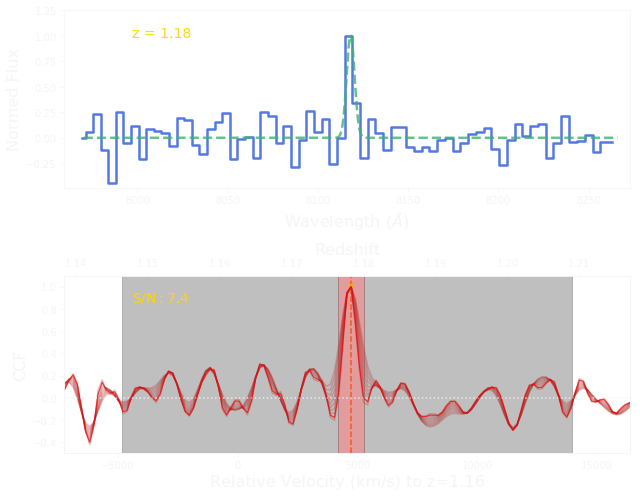

In [3]:
with plt.rc_context({'xtick.color':'whitesmoke', 'ytick.color':'whitesmoke', 
                     'axes.labelcolor':'whitesmoke','axes.edgecolor':"whitesmoke"}):
    ccs, rv, z_ccs, Rs, SNRs, SNR_ps, flag_edge = Datacube.cross_correlation(1451,temp_type="OII",edge=30)
    plt.tight_layout()
    plt.savefig("/home/qliu/Pictures/FinalPre/CC#1451W.png",dpi=100, transparent=True)

Best z: 0.22881072656732823 Best sigma: 2.1860619443572094
Peak wavl 8065.9775702019615
SE Object #888  z: 0.229  Peak R: 4.123  Detction S/N: 15.214 Peak S/N: 11.281


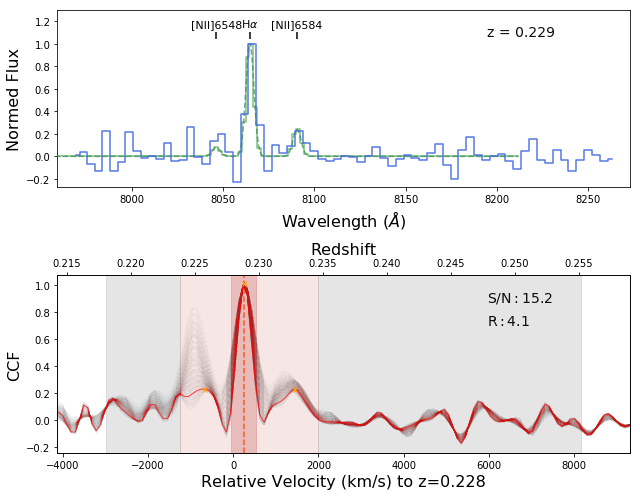

In [3]:
ccs, rv, z_ccs, Rs, SNRs, SNR_ps, Contrast = Datacube.cross_correlation(888, temp_type="Ha-NII", temp_model="gauss")

Best z: 0.24021934355311123 Best sigma: 2.889925154160589
Peak wavl 8138.225293652581
SE Object #1131  z: 0.240  Peak R: 7.993  Detction S/N: 5.239 Peak S/N: 5.979


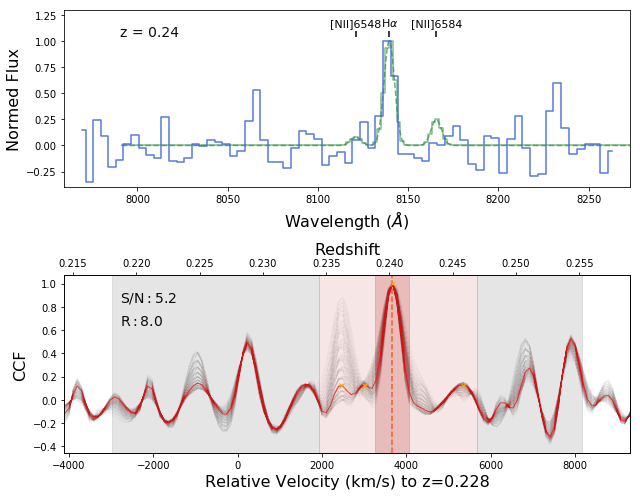

In [6]:
ccs, rv, z_ccs, Rs, SNRs, SNR_ps, Contrast = Datacube.cross_correlation(1131, temp_type="Ha-NII", temp_model="gauss")

Best z: 0.6256464482732514 Best sigma: 5.0015147835707285
Peak wavl 8138.225293652581
SE Object #1131  z: 0.626  Peak R: 1.001  Detction S/N: 6.523 Peak S/N: 6.523


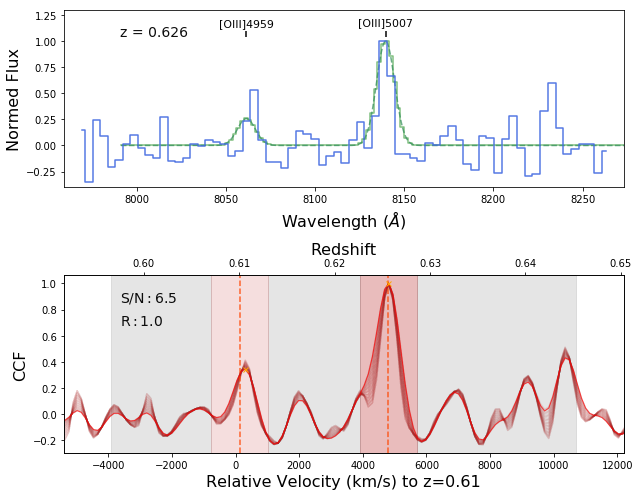

In [7]:
ccs, rv, z_ccs, Rs, SNRs, SNR_ps, Contrast = Datacube.cross_correlation(1131, temp_type="Hb-OIII", temp_model="gauss")

Best z: 0.22775997838081916 Best sigma: 4.6495831786690385
Peak wavl 8057.520115757371
SE Object #313  z: 0.228  Peak R: 2.457  Detction S/N: 4.921 Peak S/N: 4.930


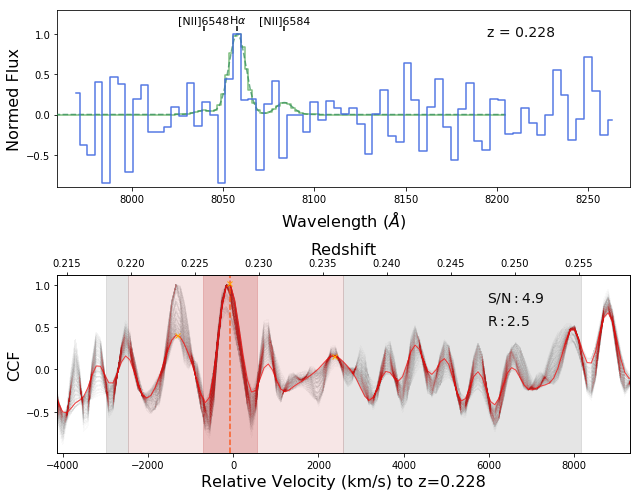

In [20]:
ccs, rv, z_ccs, Rs, SNRs, SNR_ps, Contrast = Datacube.cross_correlation(313, temp_type="Ha-NII", temp_model="gauss")

In [3]:
Datacube.cross_correlation_all(temp_type="Ha-NII", temp_model="gauss")  #new library

SE Object #1  z: 0.224  Peak R: 1.410  Detction S/N: 3.325 Peak S/N: 3.171
SE Object #2  z: 0.224  Peak R: 1.262  Detction S/N: 2.999 Peak S/N: 2.657
SE Object #3  z: 0.221  Peak R: 1.444  Detction S/N: 6.229 Peak S/N: 3.414
SE Object #4  z: 0.220  Peak R: 2.149  Detction S/N: 3.410 Peak S/N: 3.433
SE Object #5  z: 0.222  Peak R: 1.328  Detction S/N: 6.628 Peak S/N: 4.114
SE Object #6  z: 0.222  Peak R: 1.493  Detction S/N: 5.285 Peak S/N: 4.274
SE Object #7  z: 0.222  Peak R: 1.750  Detction S/N: 4.500 Peak S/N: 3.938
SE Object #8  z: 0.222  Peak R: 1.061  Detction S/N: 4.553 Peak S/N: 3.400
SE Object #9  z: 0.221  Peak R: 1.215  Detction S/N: 5.108 Peak S/N: 3.074
SE Object #10  z: 0.227  Peak R: 1.433  Detction S/N: 2.565 Peak S/N: 2.404
SE Object #11  z: 0.221  Peak R: 1.648  Detction S/N: 3.171 Peak S/N: 2.712
SE Object #12  z: 0.235  Peak R: 1.592  Detction S/N: 2.120 Peak S/N: 2.307
SE Object #13  z: 0.222  Peak R: 2.996  Detction S/N: 5.875 Peak S/N: 4.973
SE Object #14  z: 0.2

SE Object #109  z: 0.223  Peak R: 2.441  Detction S/N: 4.111 Peak S/N: 3.484
SE Object #110  z: 0.223  Peak R: 2.130  Detction S/N: 2.887 Peak S/N: 2.888
SE Object #111  z: 0.225  Peak R: 2.239  Detction S/N: 3.387 Peak S/N: 2.938
SE Object #112  z: 0.238  Peak R: 1.559  Detction S/N: 3.120 Peak S/N: 2.948
SE Object #113  z: 0.228  Peak R: 1.394  Detction S/N: 3.541 Peak S/N: 2.758
SE Object #114  z: 0.222  Peak R: 1.598  Detction S/N: 4.961 Peak S/N: 4.148
SE Object #115  z: 0.235  Peak R: 2.777  Detction S/N: 2.949 Peak S/N: 2.742
SE Object #116  z: 0.223  Peak R: 9.378  Detction S/N: 1.845 Peak S/N: 1.853
SE Object #117  z: 0.224  Peak R: 1.512  Detction S/N: 4.689 Peak S/N: 4.281
SE Object #118  z: 0.219  Peak R: 1.845  Detction S/N: 3.775 Peak S/N: 3.525
SE Object #119  z: 0.240  Peak R: 5.961  Detction S/N: 2.636 Peak S/N: 2.486
SE Object #120  z: 0.222  Peak R: 4.069  Detction S/N: 3.495 Peak S/N: 3.053
SE Object #121  z: 0.223  Peak R: 1.716  Detction S/N: 2.896 Peak S/N: 2.542

SE Object #216  z: 0.233  Peak R: 1.734  Detction S/N: 2.708 Peak S/N: 2.613
SE Object #217  z: 0.219  Peak R: 3.666  Detction S/N: 2.556 Peak S/N: 2.259
SE Object #218  z: 0.231  Peak R: 3.049  Detction S/N: 2.121 Peak S/N: 2.332
SE Object #219  z: 0.241  Peak R: 3.643  Detction S/N: 2.747 Peak S/N: 2.929
SE Object #220  z: 0.238  Peak R: 1.707  Detction S/N: 2.910 Peak S/N: 2.842
SE Object #221  z: 0.223  Peak R: 1.790  Detction S/N: 3.736 Peak S/N: 3.002
SE Object #222  z: 0.222  Peak R: 2.648  Detction S/N: 3.185 Peak S/N: 3.035
SE Object #223  z: 0.235  Peak R: 2.534  Detction S/N: 3.203 Peak S/N: 3.541
SE Object #224  z: 0.246  Peak R: 7.421  Detction S/N: 2.691 Peak S/N: 2.614
SE Object #225  z: 0.225  Peak R: 1.369  Detction S/N: 1.666 Peak S/N: 1.706
SE Object #226  z: 0.220  Peak R: 2.298  Detction S/N: 4.433 Peak S/N: 3.906
SE Object #227  z: 0.241  Peak R: 1.495  Detction S/N: 2.038 Peak S/N: 2.137
SE Object #228  z: 0.224  Peak R: 1.492  Detction S/N: 2.878 Peak S/N: 2.748

SE Object #323  z: 0.219  Peak R: 2.736  Detction S/N: 2.807 Peak S/N: 2.648
SE Object #324  z: 0.252  Peak R: 1.998  Detction S/N: 1.964 Peak S/N: 2.065
SE Object #325  z: 0.220  Peak R: 1.605  Detction S/N: 2.503 Peak S/N: 2.401
SE Object #326  z: 0.230  Peak R: 1.325  Detction S/N: 3.042 Peak S/N: 2.464
SE Object #327  z: 0.227  Peak R: 1.950  Detction S/N: 3.710 Peak S/N: 3.790
SE Object #328  z: 0.231  Peak R: 1.944  Detction S/N: 2.233 Peak S/N: 2.233
SE Object #329  z: 0.250  Peak R: 8.480  Detction S/N: 2.879 Peak S/N: 3.172
SE Object #330  z: 0.225  Peak R: 1.941  Detction S/N: 2.860 Peak S/N: 2.926
SE Object #331  z: 0.233  Peak R: 1.296  Detction S/N: 3.641 Peak S/N: 3.073
SE Object #332  z: 0.219  Peak R: 1.770  Detction S/N: 4.500 Peak S/N: 4.089
SE Object #333  z: 0.243  Peak R: 1.664  Detction S/N: 1.911 Peak S/N: 2.004
SE Object #334  z: 0.233  Peak R: 1.295  Detction S/N: 2.464 Peak S/N: 2.447
SE Object #335  z: 0.243  Peak R: 3.540  Detction S/N: 2.126 Peak S/N: 2.343

SE Object #430  z: 0.233  Peak R: 1.213  Detction S/N: 2.515 Peak S/N: 2.564
SE Object #431  z: 0.250  Peak R: 3.223  Detction S/N: 1.996 Peak S/N: 2.226
SE Object #432  z: 0.229  Peak R: 1.904  Detction S/N: 3.329 Peak S/N: 3.351
SE Object #433  z: 0.219  Peak R: 1.390  Detction S/N: 3.130 Peak S/N: 2.901
SE Object #434  z: 0.219  Peak R: 1.692  Detction S/N: 5.019 Peak S/N: 4.131
SE Object #435  z: 0.227  Peak R: 1.136  Detction S/N: 3.171 Peak S/N: 2.634
SE Object #436  z: 0.230  Peak R: 1.862  Detction S/N: 2.520 Peak S/N: 2.647
SE Object #437  z: 0.233  Peak R: 4.127  Detction S/N: 1.702 Peak S/N: 1.754
SE Object #438  z: 0.252  Peak R: 8.107  Detction S/N: 2.561 Peak S/N: 2.536
SE Object #439  z: 0.225  Peak R: 1.486  Detction S/N: 3.559 Peak S/N: 3.466
SE Object #440  z: 0.249  Peak R: 1.503  Detction S/N: 2.833 Peak S/N: 2.409
SE Object #441  z: 0.223  Peak R: 2.017  Detction S/N: 2.011 Peak S/N: 2.158
SE Object #442  z: 0.237  Peak R: 3.511  Detction S/N: 7.467 Peak S/N: 6.554

SE Object #537  z: 0.247  Peak R: 7.410  Detction S/N: 2.446 Peak S/N: 2.509
SE Object #538  z: 0.219  Peak R: 4.402  Detction S/N: 4.086 Peak S/N: 4.335
SE Object #539  z: 0.254  Peak R: 5.638  Detction S/N: 2.523 Peak S/N: 2.600
SE Object #540  z: 0.234  Peak R: 1.174  Detction S/N: 2.035 Peak S/N: 2.086
SE Object #541  z: 0.220  Peak R: 8.611  Detction S/N: 2.733 Peak S/N: 2.867
SE Object #542  z: 0.235  Peak R: 2.818  Detction S/N: 2.104 Peak S/N: 2.062
SE Object #543  z: 0.227  Peak R: 4.147  Detction S/N: 2.003 Peak S/N: 2.384
SE Object #544  z: 0.250  Peak R: 1.427  Detction S/N: 2.653 Peak S/N: 2.756
SE Object #545  z: 0.233  Peak R: 5.847  Detction S/N: 2.516 Peak S/N: 2.554
SE Object #546  z: 0.224  Peak R: 2.200  Detction S/N: 3.504 Peak S/N: 3.505
SE Object #547  z: 0.221  Peak R: 1.499  Detction S/N: 3.263 Peak S/N: 3.131
SE Object #548  z: 0.221  Peak R: 2.288  Detction S/N: 2.891 Peak S/N: 2.859
SE Object #549  z: 0.224  Peak R: 1.302  Detction S/N: 3.689 Peak S/N: 3.237

SE Object #644  z: 0.219  Peak R: 1.426  Detction S/N: 3.705 Peak S/N: 3.348
SE Object #645  z: 0.228  Peak R: 2.875  Detction S/N: 2.698 Peak S/N: 2.533
SE Object #646  z: 0.220  Peak R: 2.476  Detction S/N: 2.636 Peak S/N: 2.621
SE Object #647  z: 0.226  Peak R: 1.193  Detction S/N: 1.847 Peak S/N: 1.803
SE Object #648  z: 0.222  Peak R: 2.129  Detction S/N: 2.337 Peak S/N: 2.409
SE Object #649  z: 0.254  Peak R: 5.171  Detction S/N: 2.097 Peak S/N: 2.141
SE Object #650  z: 0.237  Peak R: 5.284  Detction S/N: 1.863 Peak S/N: 1.785
SE Object #651  z: 0.243  Peak R: 1.733  Detction S/N: 1.966 Peak S/N: 1.762
SE Object #652  z: 0.221  Peak R: 2.096  Detction S/N: 8.091 Peak S/N: 6.143
SE Object #653  z: 0.229  Peak R: 8.220  Detction S/N: 1.976 Peak S/N: 2.022
SE Object #654  z: 0.223  Peak R: 1.823  Detction S/N: 2.743 Peak S/N: 2.656
SE Object #655  z: 0.223  Peak R: 6.554  Detction S/N: 2.432 Peak S/N: 2.620
SE Object #656  z: 0.240  Peak R: 1.511  Detction S/N: 2.572 Peak S/N: 2.405

SE Object #751  z: 0.220  Peak R: 1.556  Detction S/N: 2.677 Peak S/N: 2.586
SE Object #752  z: 0.221  Peak R: 1.828  Detction S/N: 2.235 Peak S/N: 2.266
SE Object #753  z: 0.238  Peak R: 3.826  Detction S/N: 2.923 Peak S/N: 3.160
SE Object #754  z: 0.219  Peak R: 2.243  Detction S/N: 3.053 Peak S/N: 3.388
SE Object #755  z: 0.235  Peak R: 1.415  Detction S/N: 4.354 Peak S/N: 3.409
SE Object #756  z: 0.231  Peak R: 1.309  Detction S/N: 4.098 Peak S/N: 3.058
SE Object #757  z: 0.219  Peak R: 4.580  Detction S/N: 2.792 Peak S/N: 2.855
SE Object #758  z: 0.226  Peak R: 2.360  Detction S/N: 3.188 Peak S/N: 3.050
SE Object #759  z: 0.234  Peak R: 1.351  Detction S/N: 2.337 Peak S/N: 2.359
SE Object #760  z: 0.239  Peak R: 1.289  Detction S/N: 2.379 Peak S/N: 2.179
SE Object #761  z: 0.242  Peak R: 2.219  Detction S/N: 2.950 Peak S/N: 2.253
SE Object #762  z: 0.221  Peak R: 2.189  Detction S/N: 3.163 Peak S/N: 3.392
SE Object #763  z: 0.222  Peak R: 1.228  Detction S/N: 2.845 Peak S/N: 2.953

SE Object #858  z: 0.224  Peak R: 1.270  Detction S/N: 3.722 Peak S/N: 2.779
SE Object #859  z: 0.221  Peak R: 5.667  Detction S/N: 2.065 Peak S/N: 2.127
SE Object #860  z: 0.230  Peak R: 1.700  Detction S/N: 2.887 Peak S/N: 2.642
SE Object #861  z: 0.229  Peak R: 1.990  Detction S/N: 3.833 Peak S/N: 3.396
SE Object #862  z: 0.252  Peak R: 6.860  Detction S/N: 2.275 Peak S/N: 2.291
SE Object #863  z: 0.231  Peak R: 1.330  Detction S/N: 3.487 Peak S/N: 2.945
SE Object #864  z: 0.227  Peak R: 1.011  Detction S/N: 2.631 Peak S/N: 1.731
SE Object #865  z: 0.236  Peak R: 1.580  Detction S/N: 3.033 Peak S/N: 3.297
SE Object #866  z: 0.228  Peak R: 2.769  Detction S/N: 5.254 Peak S/N: 4.263
SE Object #867  z: 0.227  Peak R: 1.107  Detction S/N: 6.144 Peak S/N: 3.430
SE Object #868  z: 0.219  Peak R: 1.322  Detction S/N: 5.046 Peak S/N: 4.199
SE Object #869  z: 0.226  Peak R: 3.904  Detction S/N: 3.649 Peak S/N: 3.470
SE Object #870  z: 0.235  Peak R: 2.539  Detction S/N: 2.987 Peak S/N: 3.191

SE Object #965  z: 0.221  Peak R: 1.508  Detction S/N: 2.234 Peak S/N: 2.261
SE Object #966  z: 0.237  Peak R: 3.545  Detction S/N: 2.399 Peak S/N: 2.545
SE Object #967  z: 0.251  Peak R: 5.751  Detction S/N: 2.542 Peak S/N: 2.590
SE Object #968  z: 0.235  Peak R: 1.420  Detction S/N: 1.957 Peak S/N: 2.096
SE Object #969  z: 0.226  Peak R: 4.470  Detction S/N: 3.651 Peak S/N: 3.860
SE Object #970  z: 0.244  Peak R: 1.898  Detction S/N: 2.576 Peak S/N: 2.580
SE Object #971  z: 0.233  Peak R: 1.426  Detction S/N: 1.632 Peak S/N: 1.721
SE Object #972  z: 0.254  Peak R: 3.293  Detction S/N: 2.542 Peak S/N: 2.625
SE Object #973  z: 0.251  Peak R: 2.848  Detction S/N: 3.325 Peak S/N: 3.161
SE Object #974  z: 0.226  Peak R: 2.155  Detction S/N: 2.883 Peak S/N: 3.106
SE Object #975  z: 0.244  Peak R: 2.105  Detction S/N: 3.225 Peak S/N: 3.126
SE Object #976  z: 0.221  Peak R: 1.385  Detction S/N: 5.471 Peak S/N: 4.023
SE Object #977  z: 0.219  Peak R: 1.128  Detction S/N: 3.898 Peak S/N: 2.962

SE Object #1071  z: 0.221  Peak R: 1.719  Detction S/N: 3.584 Peak S/N: 3.246
SE Object #1072  z: 0.227  Peak R: 1.906  Detction S/N: 4.525 Peak S/N: 4.568
SE Object #1073  z: 0.223  Peak R: 1.790  Detction S/N: 2.798 Peak S/N: 2.802
SE Object #1074  z: 0.229  Peak R: 2.276  Detction S/N: 3.825 Peak S/N: 3.868
SE Object #1075  z: 0.227  Peak R: 1.178  Detction S/N: 3.775 Peak S/N: 3.267
SE Object #1076  z: 0.248  Peak R: 1.289  Detction S/N: 4.189 Peak S/N: 3.180
SE Object #1077  z: 0.239  Peak R: 1.864  Detction S/N: 1.424 Peak S/N: 1.618
SE Object #1078  z: 0.254  Peak R: 3.151  Detction S/N: 2.760 Peak S/N: 2.608
SE Object #1079  z: 0.254  Peak R: 8.963  Detction S/N: 2.875 Peak S/N: 2.950
SE Object #1080  z: 0.253  Peak R: 1.923  Detction S/N: 2.621 Peak S/N: 2.508
SE Object #1081  z: 0.220  Peak R: 2.246  Detction S/N: 2.764 Peak S/N: 2.678
SE Object #1082  z: 0.253  Peak R: 4.492  Detction S/N: 1.927 Peak S/N: 2.082
SE Object #1083  z: 0.251  Peak R: 1.694  Detction S/N: 3.945 Pe

SE Object #1177  z: 0.252  Peak R: 2.168  Detction S/N: 2.361 Peak S/N: 2.416
SE Object #1178  z: 0.234  Peak R: 1.377  Detction S/N: 2.714 Peak S/N: 2.651
SE Object #1179  z: 0.231  Peak R: 1.560  Detction S/N: 3.072 Peak S/N: 2.926
SE Object #1180  z: 0.241  Peak R: 1.381  Detction S/N: 2.728 Peak S/N: 2.817
SE Object #1181  z: 0.224  Peak R: 1.528  Detction S/N: 3.255 Peak S/N: 3.098
SE Object #1182  z: 0.236  Peak R: 3.125  Detction S/N: 3.281 Peak S/N: 3.420
SE Object #1183  z: 0.222  Peak R: 6.358  Detction S/N: 2.601 Peak S/N: 2.554
SE Object #1184  z: 0.234  Peak R: 1.107  Detction S/N: 3.786 Peak S/N: 3.188
SE Object #1185  z: 0.235  Peak R: 1.453  Detction S/N: 4.936 Peak S/N: 3.850
SE Object #1186  z: 0.253  Peak R: 1.685  Detction S/N: 4.483 Peak S/N: 4.413
SE Object #1187  z: 0.226  Peak R: 1.086  Detction S/N: 4.529 Peak S/N: 2.940
SE Object #1188  z: 0.236  Peak R: 1.375  Detction S/N: 3.422 Peak S/N: 3.058
SE Object #1189  z: 0.234  Peak R: 1.198  Detction S/N: 2.966 Pe

SE Object #1282  z: 0.224  Peak R: 1.485  Detction S/N: 4.803 Peak S/N: 4.313
SE Object #1283  z: 0.222  Peak R: 5.014  Detction S/N: 2.317 Peak S/N: 2.283
SE Object #1284  z: 0.240  Peak R: 1.362  Detction S/N: 3.072 Peak S/N: 3.011
SE Object #1285  z: 0.252  Peak R: 2.558  Detction S/N: 3.685 Peak S/N: 3.758
SE Object #1286  z: 0.221  Peak R: 2.084  Detction S/N: 2.484 Peak S/N: 2.157
SE Object #1287  z: 0.220  Peak R: 3.463  Detction S/N: 2.882 Peak S/N: 2.882
SE Object #1288  z: 0.222  Peak R: 6.386  Detction S/N: 1.751 Peak S/N: 1.796
SE Object #1289  z: 0.220  Peak R: 1.883  Detction S/N: 2.785 Peak S/N: 2.579
SE Object #1290  z: 0.233  Peak R: 1.331  Detction S/N: 2.546 Peak S/N: 2.250
SE Object #1291  z: 0.220  Peak R: 1.209  Detction S/N: 4.106 Peak S/N: 3.144
SE Object #1292  z: 0.230  Peak R: 1.560  Detction S/N: 3.300 Peak S/N: 3.045
SE Object #1293  z: 0.243  Peak R: 6.446  Detction S/N: 3.176 Peak S/N: 3.339
SE Object #1294  z: 0.229  Peak R: 2.031  Detction S/N: 3.629 Pe

SE Object #1388  z: 0.230  Peak R: 2.206  Detction S/N: 2.355 Peak S/N: 2.244
SE Object #1389  z: 0.221  Peak R: 8.602  Detction S/N: 2.302 Peak S/N: 2.332
SE Object #1390  z: 0.221  Peak R: 1.734  Detction S/N: 2.289 Peak S/N: 2.305
SE Object #1391  z: 0.227  Peak R: 1.324  Detction S/N: 5.994 Peak S/N: 3.389
SE Object #1392  z: 0.221  Peak R: 3.406  Detction S/N: 3.776 Peak S/N: 3.631
SE Object #1393  z: 0.230  Peak R: 1.293  Detction S/N: 2.152 Peak S/N: 2.108
SE Object #1394  z: 0.220  Peak R: 1.181  Detction S/N: 4.945 Peak S/N: 4.059
SE Object #1395  z: 0.254  Peak R: 5.486  Detction S/N: 3.032 Peak S/N: 3.190
SE Object #1396  z: 0.221  Peak R: 1.158  Detction S/N: 4.197 Peak S/N: 3.277
SE Object #1397  z: 0.230  Peak R: 1.489  Detction S/N: 3.042 Peak S/N: 2.825
SE Object #1398  z: 0.252  Peak R: 1.746  Detction S/N: 3.057 Peak S/N: 2.972
SE Object #1399  z: 0.222  Peak R: 2.137  Detction S/N: 2.723 Peak S/N: 2.493
SE Object #1400  z: 0.223  Peak R: 2.271  Detction S/N: 2.587 Pe

SE Object #1494  z: 0.252  Peak R: 4.213  Detction S/N: 3.274 Peak S/N: 3.379
SE Object #1495  z: 0.221  Peak R: 5.563  Detction S/N: 2.740 Peak S/N: 2.764
SE Object #1496  z: 0.224  Peak R: 1.827  Detction S/N: 2.902 Peak S/N: 3.029
SE Object #1497  z: 0.234  Peak R: 2.401  Detction S/N: 3.006 Peak S/N: 3.124
SE Object #1498  z: 0.254  Peak R: 2.706  Detction S/N: 3.917 Peak S/N: 3.360
SE Object #1499  z: 0.228  Peak R: 2.939  Detction S/N: 3.594 Peak S/N: 3.086
SE Object #1500  z: 0.251  Peak R: 1.623  Detction S/N: 2.224 Peak S/N: 2.073
SE Object #1501  z: 0.231  Peak R: 3.797  Detction S/N: 2.629 Peak S/N: 2.712
SE Object #1502  z: 0.228  Peak R: 1.842  Detction S/N: 5.509 Peak S/N: 4.258
SE Object #1503  z: 0.236  Peak R: 2.000  Detction S/N: 2.538 Peak S/N: 2.738
SE Object #1504  z: 0.221  Peak R: 8.082  Detction S/N: 2.599 Peak S/N: 2.734
SE Object #1505  z: 0.227  Peak R: 2.442  Detction S/N: 4.049 Peak S/N: 3.666
SE Object #1506  z: 0.226  Peak R: 5.240  Detction S/N: 11.157 P

SE Object #1600  z: 0.248  Peak R: 2.087  Detction S/N: 2.528 Peak S/N: 2.468


In [4]:
Datacube.save_cc_fits(save_path='./A2390NW/', suffix="v4")

Saving cross-correlation results for A2390NW using Ha-NII_gauss templates


In [5]:
Datacube.cross_correlation_all(temp_type="Hb-OIII", temp_model="gauss")  #new library

SE Object #1  z: 0.626  Peak R: 1.244  Detction S/N: 2.271 Peak S/N: 2.271
SE Object #2  z: 0.614  Peak R: 1.925  Detction S/N: 2.565 Peak S/N: 2.565
SE Object #3  z: 0.601  Peak R: 1.373  Detction S/N: 3.289 Peak S/N: 3.289
SE Object #4  z: 0.599  Peak R: 2.427  Detction S/N: 3.506 Peak S/N: 3.506
SE Object #5  z: 0.602  Peak R: 1.209  Detction S/N: 3.490 Peak S/N: 3.490
SE Object #6  z: 0.602  Peak R: 1.339  Detction S/N: 3.100 Peak S/N: 3.100
SE Object #7  z: 0.602  Peak R: 1.218  Detction S/N: 3.694 Peak S/N: 3.694
SE Object #8  z: 0.602  Peak R: 1.577  Detction S/N: 3.021 Peak S/N: 3.021
SE Object #9  z: 0.601  Peak R: 1.475  Detction S/N: 2.757 Peak S/N: 2.757
SE Object #10  z: 0.608  Peak R: 3.254  Detction S/N: 2.156 Peak S/N: 2.156
SE Object #11  z: 0.617  Peak R: 1.101  Detction S/N: 2.417 Peak S/N: 2.417
SE Object #12  z: 0.601  Peak R: 1.814  Detction S/N: 2.408 Peak S/N: 2.408
SE Object #13  z: 0.598  Peak R: 1.670  Detction S/N: 3.301 Peak S/N: 3.301
SE Object #14  z: 0.6

SE Object #109  z: 0.603  Peak R: 1.573  Detction S/N: 3.033 Peak S/N: 3.033
SE Object #110  z: 0.630  Peak R: 1.452  Detction S/N: 2.619 Peak S/N: 2.619
SE Object #111  z: 0.606  Peak R: 3.045  Detction S/N: 2.660 Peak S/N: 2.660
SE Object #112  z: 0.622  Peak R: 1.632  Detction S/N: 2.408 Peak S/N: 2.408
SE Object #113  z: 0.609  Peak R: 4.434  Detction S/N: 2.640 Peak S/N: 2.640
SE Object #114  z: 0.606  Peak R: 1.877  Detction S/N: 3.314 Peak S/N: 3.314
SE Object #115  z: 0.618  Peak R: 1.969  Detction S/N: 2.683 Peak S/N: 2.683
SE Object #116  z: 0.619  Peak R: 1.225  Detction S/N: 2.424 Peak S/N: 2.424
SE Object #117  z: 0.605  Peak R: 3.730  Detction S/N: 2.956 Peak S/N: 2.956
SE Object #118  z: 0.603  Peak R: 3.091  Detction S/N: 2.144 Peak S/N: 2.144
SE Object #119  z: 0.626  Peak R: 1.605  Detction S/N: 2.795 Peak S/N: 2.795
SE Object #120  z: 0.602  Peak R: 1.051  Detction S/N: 2.877 Peak S/N: 2.877
SE Object #121  z: 0.602  Peak R: 1.000  Detction S/N: 2.147 Peak S/N: 2.147

SE Object #217  z: 0.602  Peak R: 1.582  Detction S/N: 1.957 Peak S/N: 1.957
SE Object #218  z: 0.623  Peak R: 2.374  Detction S/N: 2.355 Peak S/N: 2.355
SE Object #219  z: 0.627  Peak R: 2.905  Detction S/N: 2.949 Peak S/N: 2.949
SE Object #220  z: 0.623  Peak R: 1.000  Detction S/N: 2.762 Peak S/N: 2.762
SE Object #221  z: 0.609  Peak R: 1.000  Detction S/N: 2.848 Peak S/N: 2.848
SE Object #222  z: 0.602  Peak R: 8.440  Detction S/N: 3.221 Peak S/N: 3.221
SE Object #223  z: 0.618  Peak R: 2.057  Detction S/N: 3.785 Peak S/N: 3.785
SE Object #224  z: 0.633  Peak R: 8.525  Detction S/N: 2.668 Peak S/N: 2.668
SE Object #225  z: 0.605  Peak R: 6.011  Detction S/N: 1.772 Peak S/N: 1.772
SE Object #226  z: 0.604  Peak R: 1.897  Detction S/N: 2.053 Peak S/N: 2.053
SE Object #227  z: 0.627  Peak R: 1.531  Detction S/N: 2.554 Peak S/N: 2.554
SE Object #228  z: 0.605  Peak R: 1.161  Detction S/N: 2.506 Peak S/N: 2.506
SE Object #229  z: 0.627  Peak R: 2.752  Detction S/N: 2.545 Peak S/N: 2.545

SE Object #324  z: 0.642  Peak R: 2.449  Detction S/N: 2.263 Peak S/N: 2.263
SE Object #325  z: 0.621  Peak R: 2.332  Detction S/N: 2.436 Peak S/N: 2.436
SE Object #326  z: 0.618  Peak R: 2.709  Detction S/N: 2.185 Peak S/N: 2.185
SE Object #327  z: 0.624  Peak R: 1.295  Detction S/N: 3.422 Peak S/N: 3.422
SE Object #328  z: 0.620  Peak R: 2.327  Detction S/N: 2.031 Peak S/N: 2.031
SE Object #329  z: 0.639  Peak R: 1.503  Detction S/N: 2.994 Peak S/N: 2.994
SE Object #330  z: 0.621  Peak R: 1.447  Detction S/N: 2.407 Peak S/N: 2.407
SE Object #331  z: 0.622  Peak R: 3.606  Detction S/N: 2.986 Peak S/N: 2.986
SE Object #332  z: 0.598  Peak R: 1.000  Detction S/N: 4.287 Peak S/N: 4.287
SE Object #333  z: 0.623  Peak R: 1.302  Detction S/N: 2.240 Peak S/N: 2.240
SE Object #334  z: 0.644  Peak R: 1.655  Detction S/N: 2.475 Peak S/N: 2.475
SE Object #335  z: 0.630  Peak R: 3.584  Detction S/N: 2.325 Peak S/N: 2.325
SE Object #336  z: 0.598  Peak R: 1.000  Detction S/N: 3.255 Peak S/N: 3.255

SE Object #433  z: 0.604  Peak R: 2.513  Detction S/N: 2.148 Peak S/N: 2.148
SE Object #434  z: 0.598  Peak R: 1.768  Detction S/N: 4.108 Peak S/N: 4.108
SE Object #435  z: 0.614  Peak R: 1.724  Detction S/N: 2.703 Peak S/N: 2.703
SE Object #436  z: 0.612  Peak R: 1.000  Detction S/N: 2.958 Peak S/N: 2.958
SE Object #437  z: 0.616  Peak R: 1.321  Detction S/N: 2.110 Peak S/N: 2.110
SE Object #438  z: 0.642  Peak R: 2.583  Detction S/N: 2.510 Peak S/N: 2.510
SE Object #439  z: 0.606  Peak R: 1.541  Detction S/N: 2.753 Peak S/N: 2.753
SE Object #440  z: 0.614  Peak R: 2.572  Detction S/N: 1.919 Peak S/N: 1.919
SE Object #441  z: 0.624  Peak R: 1.751  Detction S/N: 1.874 Peak S/N: 1.874
SE Object #442  z: 0.622  Peak R: 1.000  Detction S/N: 6.882 Peak S/N: 6.882
SE Object #443  z: 0.619  Peak R: 1.527  Detction S/N: 2.291 Peak S/N: 2.291
SE Object #444  z: 0.643  Peak R: 2.194  Detction S/N: 3.029 Peak S/N: 3.029
SE Object #445  z: 0.602  Peak R: 1.076  Detction S/N: 3.175 Peak S/N: 3.175

SE Object #542  z: 0.612  Peak R: 1.000  Detction S/N: 2.937 Peak S/N: 2.937
SE Object #543  z: 0.609  Peak R: 1.000  Detction S/N: 2.837 Peak S/N: 2.837
SE Object #544  z: 0.638  Peak R: 7.482  Detction S/N: 2.551 Peak S/N: 2.551
SE Object #545  z: 0.620  Peak R: 3.492  Detction S/N: 1.919 Peak S/N: 1.919
SE Object #546  z: 0.628  Peak R: 2.148  Detction S/N: 2.656 Peak S/N: 2.656
SE Object #547  z: 0.606  Peak R: 5.421  Detction S/N: 2.239 Peak S/N: 2.239
SE Object #548  z: 0.612  Peak R: 2.390  Detction S/N: 2.483 Peak S/N: 2.483
SE Object #549  z: 0.598  Peak R: 1.665  Detction S/N: 2.678 Peak S/N: 2.678
SE Object #550  z: 0.627  Peak R: 1.148  Detction S/N: 3.094 Peak S/N: 3.094
SE Object #551  z: 0.598  Peak R: 1.000  Detction S/N: 3.300 Peak S/N: 3.300
SE Object #552  z: 0.598  Peak R: 1.000  Detction S/N: 3.772 Peak S/N: 3.772
SE Object #553  z: 0.613  Peak R: 1.599  Detction S/N: 3.001 Peak S/N: 3.001
SE Object #554  z: 0.630  Peak R: 1.419  Detction S/N: 2.346 Peak S/N: 2.346

SE Object #652  z: 0.599  Peak R: 2.874  Detction S/N: 4.495 Peak S/N: 4.495
SE Object #653  z: 0.604  Peak R: 2.780  Detction S/N: 1.912 Peak S/N: 1.912
SE Object #654  z: 0.602  Peak R: 5.057  Detction S/N: 2.371 Peak S/N: 2.371
SE Object #655  z: 0.603  Peak R: 3.057  Detction S/N: 3.210 Peak S/N: 3.210
SE Object #656  z: 0.629  Peak R: 2.063  Detction S/N: 2.517 Peak S/N: 2.517
SE Object #657  z: 0.603  Peak R: 5.486  Detction S/N: 2.133 Peak S/N: 2.133
SE Object #658  z: 0.614  Peak R: 1.157  Detction S/N: 2.697 Peak S/N: 2.697
SE Object #659  z: 0.623  Peak R: 3.398  Detction S/N: 2.246 Peak S/N: 2.246
SE Object #660  z: 0.604  Peak R: 7.295  Detction S/N: 2.275 Peak S/N: 2.275
SE Object #661  z: 0.633  Peak R: 2.175  Detction S/N: 2.065 Peak S/N: 2.065
SE Object #662  z: 0.640  Peak R: 2.258  Detction S/N: 3.297 Peak S/N: 3.297
SE Object #663  z: 0.625  Peak R: 1.000  Detction S/N: 2.267 Peak S/N: 2.267
SE Object #664  z: 0.603  Peak R: 5.632  Detction S/N: 2.807 Peak S/N: 2.807

SE Object #760  z: 0.629  Peak R: 1.556  Detction S/N: 2.055 Peak S/N: 2.055
SE Object #761  z: 0.598  Peak R: 5.924  Detction S/N: 2.198 Peak S/N: 2.198
SE Object #762  z: 0.617  Peak R: 1.154  Detction S/N: 4.044 Peak S/N: 4.044
SE Object #763  z: 0.607  Peak R: 1.815  Detction S/N: 2.504 Peak S/N: 2.504
SE Object #764  z: 0.598  Peak R: 3.624  Detction S/N: 1.736 Peak S/N: 1.736
SE Object #765  z: 0.603  Peak R: 3.409  Detction S/N: 1.938 Peak S/N: 1.938
SE Object #766  z: 0.606  Peak R: 1.806  Detction S/N: 3.019 Peak S/N: 3.019
SE Object #767  z: 0.619  Peak R: 1.682  Detction S/N: 3.313 Peak S/N: 3.313
SE Object #768  z: 0.614  Peak R: 2.040  Detction S/N: 1.978 Peak S/N: 1.978
SE Object #769  z: 0.600  Peak R: 1.286  Detction S/N: 2.459 Peak S/N: 2.459
SE Object #770  z: 0.629  Peak R: 2.122  Detction S/N: 3.263 Peak S/N: 3.263
SE Object #771  z: 0.600  Peak R: 1.221  Detction S/N: 2.244 Peak S/N: 2.244
SE Object #772  z: 0.625  Peak R: 8.569  Detction S/N: 3.076 Peak S/N: 3.076

SE Object #868  z: 0.598  Peak R: 2.376  Detction S/N: 4.672 Peak S/N: 4.672
SE Object #869  z: 0.604  Peak R: 3.689  Detction S/N: 3.308 Peak S/N: 3.308
SE Object #870  z: 0.619  Peak R: 1.963  Detction S/N: 3.506 Peak S/N: 3.506
SE Object #871  z: 0.605  Peak R: 1.000  Detction S/N: 3.479 Peak S/N: 3.479
SE Object #872  z: 0.618  Peak R: 5.801  Detction S/N: 1.951 Peak S/N: 1.951
SE Object #873  z: 0.624  Peak R: 1.103  Detction S/N: 3.091 Peak S/N: 3.091
SE Object #874  z: 0.611  Peak R: 4.287  Detction S/N: 3.333 Peak S/N: 3.333
SE Object #875  z: 0.604  Peak R: 1.466  Detction S/N: 2.467 Peak S/N: 2.467
SE Object #876  z: 0.624  Peak R: 1.211  Detction S/N: 2.714 Peak S/N: 2.714
SE Object #877  z: 0.602  Peak R: 1.290  Detction S/N: 2.313 Peak S/N: 2.313
SE Object #878  z: 0.622  Peak R: 1.619  Detction S/N: 2.191 Peak S/N: 2.191
SE Object #879  z: 0.628  Peak R: 2.528  Detction S/N: 2.646 Peak S/N: 2.646
SE Object #880  z: 0.620  Peak R: 6.682  Detction S/N: 1.648 Peak S/N: 1.648

SE Object #976  z: 0.601  Peak R: 1.134  Detction S/N: 3.605 Peak S/N: 3.605
SE Object #977  z: 0.627  Peak R: 2.333  Detction S/N: 2.132 Peak S/N: 2.132
SE Object #978  z: 0.624  Peak R: 1.509  Detction S/N: 4.156 Peak S/N: 4.156
SE Object #979  z: 0.618  Peak R: 9.110  Detction S/N: 2.339 Peak S/N: 2.339
SE Object #980  z: 0.630  Peak R: 2.660  Detction S/N: 2.414 Peak S/N: 2.414
SE Object #981  z: 0.638  Peak R: 5.355  Detction S/N: 2.684 Peak S/N: 2.684
SE Object #982  z: 0.632  Peak R: 8.593  Detction S/N: 2.558 Peak S/N: 2.558
SE Object #983  z: 0.624  Peak R: 1.598  Detction S/N: 2.882 Peak S/N: 2.882
SE Object #984  z: 0.644  Peak R: 6.135  Detction S/N: 3.274 Peak S/N: 3.274
SE Object #985  z: 0.630  Peak R: 2.131  Detction S/N: 3.115 Peak S/N: 3.115
SE Object #986  z: 0.609  Peak R: 4.591  Detction S/N: 3.221 Peak S/N: 3.221
SE Object #987  z: 0.633  Peak R: 3.488  Detction S/N: 2.452 Peak S/N: 2.452
SE Object #988  z: 0.624  Peak R: 6.851  Detction S/N: 3.495 Peak S/N: 3.495

SE Object #1084  z: 0.641  Peak R: 4.573  Detction S/N: 2.260 Peak S/N: 2.260
SE Object #1085  z: 0.613  Peak R: 1.000  Detction S/N: 2.096 Peak S/N: 2.096
SE Object #1086  z: 0.614  Peak R: 1.000  Detction S/N: 3.926 Peak S/N: 3.926
SE Object #1087  z: 0.640  Peak R: 9.188  Detction S/N: 2.630 Peak S/N: 2.630
SE Object #1088  z: 0.627  Peak R: 1.439  Detction S/N: 2.962 Peak S/N: 2.962
SE Object #1089  z: 0.642  Peak R: 4.087  Detction S/N: 4.174 Peak S/N: 4.174
SE Object #1090  z: 0.623  Peak R: 5.206  Detction S/N: 3.303 Peak S/N: 3.303
SE Object #1091  z: 0.643  Peak R: 3.496  Detction S/N: 3.392 Peak S/N: 3.392
SE Object #1092  z: 0.641  Peak R: 1.148  Detction S/N: 2.612 Peak S/N: 2.612
SE Object #1093  z: 0.644  Peak R: 4.543  Detction S/N: 2.458 Peak S/N: 2.458
SE Object #1094  z: 0.640  Peak R: 5.802  Detction S/N: 3.262 Peak S/N: 3.262
SE Object #1095  z: 0.641  Peak R: 4.877  Detction S/N: 2.553 Peak S/N: 2.553
SE Object #1096  z: 0.605  Peak R: 9.838  Detction S/N: 2.247 Pe

SE Object #1191  z: 0.598  Peak R: 1.000  Detction S/N: 4.196 Peak S/N: 4.196
SE Object #1192  z: 0.623  Peak R: 2.481  Detction S/N: 3.063 Peak S/N: 3.063
SE Object #1193  z: 0.628  Peak R: 3.363  Detction S/N: 2.969 Peak S/N: 2.969
SE Object #1194  z: 0.642  Peak R: 1.602  Detction S/N: 2.822 Peak S/N: 2.822
SE Object #1195  z: 0.599  Peak R: 1.778  Detction S/N: 3.738 Peak S/N: 3.738
SE Object #1196  z: 0.599  Peak R: 9.304  Detction S/N: 2.927 Peak S/N: 2.927
SE Object #1197  z: 0.604  Peak R: 2.410  Detction S/N: 2.156 Peak S/N: 2.156
SE Object #1198  z: 0.626  Peak R: 1.533  Detction S/N: 2.774 Peak S/N: 2.774
SE Object #1199  z: 0.603  Peak R: 1.055  Detction S/N: 2.024 Peak S/N: 2.024
SE Object #1200  z: 0.599  Peak R: 1.000  Detction S/N: 2.964 Peak S/N: 2.964
SE Object #1201  z: 0.626  Peak R: 1.422  Detction S/N: 2.090 Peak S/N: 2.090
SE Object #1202  z: 0.622  Peak R: 1.659  Detction S/N: 4.109 Peak S/N: 4.109
SE Object #1203  z: 0.644  Peak R: 4.379  Detction S/N: 3.533 Pe

SE Object #1297  z: 0.605  Peak R: 5.681  Detction S/N: 2.448 Peak S/N: 2.448
SE Object #1298  z: 0.625  Peak R: 1.467  Detction S/N: 2.449 Peak S/N: 2.449
SE Object #1299  z: 0.599  Peak R: 2.774  Detction S/N: 2.506 Peak S/N: 2.506
SE Object #1300  z: 0.623  Peak R: 5.394  Detction S/N: 3.771 Peak S/N: 3.771
SE Object #1301  z: 0.601  Peak R: 1.930  Detction S/N: 2.132 Peak S/N: 2.132
SE Object #1302  z: 0.630  Peak R: 6.404  Detction S/N: 2.507 Peak S/N: 2.507
SE Object #1303  z: 0.603  Peak R: 2.763  Detction S/N: 2.147 Peak S/N: 2.147
SE Object #1304  z: 0.624  Peak R: 3.190  Detction S/N: 2.526 Peak S/N: 2.526
SE Object #1305  z: 0.598  Peak R: 1.488  Detction S/N: 3.182 Peak S/N: 3.182
SE Object #1306  z: 0.632  Peak R: 1.110  Detction S/N: 2.670 Peak S/N: 2.670
SE Object #1307  z: 0.614  Peak R: 2.185  Detction S/N: 3.039 Peak S/N: 3.039
SE Object #1308  z: 0.609  Peak R: 7.976  Detction S/N: 1.971 Peak S/N: 1.971
SE Object #1309  z: 0.607  Peak R: 1.033  Detction S/N: 2.554 Pe

SE Object #1405  z: 0.604  Peak R: 2.006  Detction S/N: 2.979 Peak S/N: 2.979
SE Object #1406  z: 0.616  Peak R: 2.125  Detction S/N: 2.652 Peak S/N: 2.652
SE Object #1407  z: 0.602  Peak R: 2.179  Detction S/N: 2.184 Peak S/N: 2.184
SE Object #1408  z: 0.640  Peak R: 1.345  Detction S/N: 2.976 Peak S/N: 2.976
SE Object #1409  z: 0.628  Peak R: 6.547  Detction S/N: 2.754 Peak S/N: 2.754
SE Object #1410  z: 0.601  Peak R: 1.096  Detction S/N: 2.169 Peak S/N: 2.169
SE Object #1411  z: 0.621  Peak R: 1.678  Detction S/N: 2.324 Peak S/N: 2.324
SE Object #1412  z: 0.602  Peak R: 7.760  Detction S/N: 2.758 Peak S/N: 2.758
SE Object #1413  z: 0.620  Peak R: 1.373  Detction S/N: 1.881 Peak S/N: 1.881
SE Object #1414  z: 0.601  Peak R: 7.533  Detction S/N: 2.472 Peak S/N: 2.472
SE Object #1415  z: 0.613  Peak R: 1.000  Detction S/N: 2.370 Peak S/N: 2.370
SE Object #1416  z: 0.637  Peak R: 4.331  Detction S/N: 2.139 Peak S/N: 2.139
SE Object #1417  z: 0.612  Peak R: 1.000  Detction S/N: 3.049 Pe

SE Object #1511  z: 0.609  Peak R: 1.988  Detction S/N: 3.589 Peak S/N: 3.589
SE Object #1512  z: 0.610  Peak R: 1.885  Detction S/N: 1.695 Peak S/N: 1.695
SE Object #1513  z: 0.639  Peak R: 1.253  Detction S/N: 3.399 Peak S/N: 3.399
SE Object #1514  z: 0.628  Peak R: 9.632  Detction S/N: 2.751 Peak S/N: 2.751
SE Object #1515  z: 0.612  Peak R: 1.000  Detction S/N: 2.325 Peak S/N: 2.325
SE Object #1516  z: 0.612  Peak R: 1.000  Detction S/N: 2.764 Peak S/N: 2.764
SE Object #1517  z: 0.605  Peak R: 1.000  Detction S/N: 2.714 Peak S/N: 2.714
SE Object #1518  z: 0.609  Peak R: 1.000  Detction S/N: 6.411 Peak S/N: 6.411
SE Object #1519  z: 0.616  Peak R: 1.159  Detction S/N: 2.396 Peak S/N: 2.396
SE Object #1520  z: 0.630  Peak R: 1.387  Detction S/N: 2.804 Peak S/N: 2.804
SE Object #1521  z: 0.618  Peak R: 2.303  Detction S/N: 3.361 Peak S/N: 3.361
SE Object #1522  z: 0.627  Peak R: 1.526  Detction S/N: 2.688 Peak S/N: 2.688
SE Object #1523  z: 0.604  Peak R: 1.000  Detction S/N: 2.585 Pe

In [6]:
Datacube.save_cc_fits(save_path='./A2390NW/', suffix="v4")

Saving cross-correlation results for A2390NW using Hb-OIII_gauss templates


In [7]:
Datacube.cross_correlation_all(temp_type="OII", temp_model="gauss")  #new library

SE Object #1  z: 1.163  Peak R: 1.000  Detction S/N: 2.332 Peak S/N: 2.332
SE Object #2  z: 1.169  Peak R: 1.000  Detction S/N: 2.518 Peak S/N: 2.518
SE Object #3  z: 1.151  Peak R: 1.000  Detction S/N: 3.441 Peak S/N: 3.441
SE Object #4  z: 1.148  Peak R: 1.000  Detction S/N: 3.525 Peak S/N: 3.525
SE Object #5  z: 1.152  Peak R: 1.000  Detction S/N: 3.738 Peak S/N: 3.738
SE Object #6  z: 1.152  Peak R: 1.000  Detction S/N: 3.877 Peak S/N: 3.877
SE Object #7  z: 1.152  Peak R: 1.000  Detction S/N: 3.938 Peak S/N: 3.938
SE Object #8  z: 1.153  Peak R: 1.000  Detction S/N: 3.209 Peak S/N: 3.209
SE Object #9  z: 1.151  Peak R: 1.000  Detction S/N: 2.987 Peak S/N: 2.987
SE Object #10  z: 1.160  Peak R: 1.000  Detction S/N: 2.592 Peak S/N: 2.592
SE Object #11  z: 1.150  Peak R: 1.000  Detction S/N: 2.461 Peak S/N: 2.461
SE Object #12  z: 1.151  Peak R: 1.000  Detction S/N: 2.386 Peak S/N: 2.386
SE Object #13  z: 1.148  Peak R: 1.000  Detction S/N: 3.890 Peak S/N: 3.890
SE Object #14  z: 1.1

SE Object #120  z: 1.152  Peak R: 1.000  Detction S/N: 3.103 Peak S/N: 3.103
SE Object #121  z: 1.153  Peak R: 1.000  Detction S/N: 2.141 Peak S/N: 2.141
SE Object #122  z: 1.151  Peak R: 1.000  Detction S/N: 6.908 Peak S/N: 6.908
SE Object #123  z: 1.151  Peak R: 1.000  Detction S/N: 3.625 Peak S/N: 3.625
SE Object #124  z: 1.153  Peak R: 1.000  Detction S/N: 2.832 Peak S/N: 2.832
SE Object #125  z: 1.158  Peak R: 1.000  Detction S/N: 2.303 Peak S/N: 2.303
SE Object #126  z: 1.149  Peak R: 1.000  Detction S/N: 2.505 Peak S/N: 2.505
SE Object #127  z: 1.151  Peak R: 1.000  Detction S/N: 7.850 Peak S/N: 7.850
SE Object #128  z: 1.152  Peak R: 1.000  Detction S/N: 2.545 Peak S/N: 2.545
SE Object #129  z: 1.158  Peak R: 1.000  Detction S/N: 1.772 Peak S/N: 1.772
SE Object #130  z: 1.152  Peak R: 1.000  Detction S/N: 2.755 Peak S/N: 2.755
SE Object #131  z: 1.151  Peak R: 1.000  Detction S/N: 3.340 Peak S/N: 3.340
SE Object #132  z: 1.155  Peak R: 1.000  Detction S/N: 2.439 Peak S/N: 2.439

SE Object #235  z: 1.163  Peak R: 1.000  Detction S/N: 2.260 Peak S/N: 2.260
SE Object #236  z: 1.194  Peak R: 1.000  Detction S/N: 3.305 Peak S/N: 3.305
SE Object #237  z: 1.177  Peak R: 1.000  Detction S/N: 2.405 Peak S/N: 2.405
SE Object #238  z: 1.152  Peak R: 1.000  Detction S/N: 2.011 Peak S/N: 2.011
SE Object #239  z: 1.164  Peak R: 1.000  Detction S/N: 3.306 Peak S/N: 3.306
SE Object #240  z: 1.164  Peak R: 1.000  Detction S/N: 2.149 Peak S/N: 2.149
SE Object #241  z: 1.151  Peak R: 1.000  Detction S/N: 2.957 Peak S/N: 2.957
SE Object #242  z: 1.174  Peak R: 1.000  Detction S/N: 4.377 Peak S/N: 4.377
SE Object #243  z: 1.151  Peak R: 1.000  Detction S/N: 2.378 Peak S/N: 2.378
SE Object #244  z: 1.146  Peak R: 1.000  Detction S/N: 3.506 Peak S/N: 3.506
SE Object #245  z: 1.181  Peak R: 1.000  Detction S/N: 2.146 Peak S/N: 2.146
SE Object #246  z: 1.156  Peak R: 1.000  Detction S/N: 3.295 Peak S/N: 3.295
SE Object #247  z: 1.170  Peak R: 1.000  Detction S/N: 3.253 Peak S/N: 3.253

SE Object #363  z: 1.146  Peak R: 1.000  Detction S/N: 2.580 Peak S/N: 2.580
SE Object #364  z: 1.166  Peak R: 1.000  Detction S/N: 2.822 Peak S/N: 2.822
SE Object #365  z: 1.157  Peak R: 1.000  Detction S/N: 3.507 Peak S/N: 3.507
SE Object #366  z: 1.176  Peak R: 1.000  Detction S/N: 2.849 Peak S/N: 2.849
SE Object #367  z: 1.164  Peak R: 1.000  Detction S/N: 1.699 Peak S/N: 1.699
SE Object #368  z: 1.182  Peak R: 1.000  Detction S/N: 2.289 Peak S/N: 2.289
SE Object #369  z: 1.205  Peak R: 1.000  Detction S/N: 2.845 Peak S/N: 2.845
SE Object #370  z: 1.175  Peak R: 1.000  Detction S/N: 3.607 Peak S/N: 3.607
SE Object #371  z: 1.148  Peak R: 1.000  Detction S/N: 3.133 Peak S/N: 3.133
SE Object #372  z: 1.157  Peak R: 1.000  Detction S/N: 3.082 Peak S/N: 3.082
SE Object #373  z: 1.161  Peak R: 1.000  Detction S/N: 3.334 Peak S/N: 3.334
SE Object #374  z: 1.150  Peak R: 1.000  Detction S/N: 3.607 Peak S/N: 3.607
SE Object #375  z: 1.165  Peak R: 1.000  Detction S/N: 2.468 Peak S/N: 2.468

SE Object #480  z: 1.148  Peak R: 1.000  Detction S/N: 4.527 Peak S/N: 4.527
SE Object #481  z: 1.173  Peak R: 1.000  Detction S/N: 2.439 Peak S/N: 2.439
SE Object #482  z: 1.156  Peak R: 1.000  Detction S/N: 3.252 Peak S/N: 3.252
SE Object #483  z: 1.182  Peak R: 1.000  Detction S/N: 3.003 Peak S/N: 3.003
SE Object #484  z: 1.165  Peak R: 1.000  Detction S/N: 2.474 Peak S/N: 2.474
SE Object #485  z: 1.159  Peak R: 1.000  Detction S/N: 2.781 Peak S/N: 2.781
SE Object #486  z: 1.170  Peak R: 1.000  Detction S/N: 2.062 Peak S/N: 2.062
SE Object #487  z: 1.148  Peak R: 1.000  Detction S/N: 2.117 Peak S/N: 2.117
SE Object #488  z: 1.163  Peak R: 1.000  Detction S/N: 2.711 Peak S/N: 2.711
SE Object #489  z: 1.179  Peak R: 1.000  Detction S/N: 2.677 Peak S/N: 2.677
SE Object #490  z: 1.165  Peak R: 1.000  Detction S/N: 2.808 Peak S/N: 2.808
SE Object #491  z: 1.157  Peak R: 1.000  Detction S/N: 2.590 Peak S/N: 2.590
SE Object #492  z: 1.181  Peak R: 1.000  Detction S/N: 2.321 Peak S/N: 2.321

SE Object #592  z: 1.191  Peak R: 1.000  Detction S/N: 2.540 Peak S/N: 2.540
SE Object #593  z: 1.157  Peak R: 1.000  Detction S/N: 2.526 Peak S/N: 2.526
SE Object #594  z: 1.179  Peak R: 1.000  Detction S/N: 2.484 Peak S/N: 2.484
SE Object #595  z: 1.147  Peak R: 1.000  Detction S/N: 2.032 Peak S/N: 2.032
SE Object #596  z: 1.171  Peak R: 1.000  Detction S/N: 2.993 Peak S/N: 2.993
SE Object #597  z: 1.162  Peak R: 1.000  Detction S/N: 2.293 Peak S/N: 2.293
SE Object #598  z: 1.189  Peak R: 1.000  Detction S/N: 2.897 Peak S/N: 2.897
SE Object #599  z: 1.157  Peak R: 1.000  Detction S/N: 7.861 Peak S/N: 7.861
SE Object #600  z: 1.184  Peak R: 1.000  Detction S/N: 2.233 Peak S/N: 2.233
SE Object #601  z: 1.162  Peak R: 1.000  Detction S/N: 2.167 Peak S/N: 2.167
SE Object #602  z: 1.161  Peak R: 1.000  Detction S/N: 2.814 Peak S/N: 2.814
SE Object #603  z: 1.150  Peak R: 1.000  Detction S/N: 2.249 Peak S/N: 2.249
SE Object #604  z: 1.147  Peak R: 1.000  Detction S/N: 2.771 Peak S/N: 2.771

SE Object #706  z: 1.162  Peak R: 1.000  Detction S/N: 3.553 Peak S/N: 3.553
SE Object #707  z: 1.161  Peak R: 1.000  Detction S/N: 3.204 Peak S/N: 3.204
SE Object #708  z: 1.152  Peak R: 1.000  Detction S/N: 2.905 Peak S/N: 2.905
SE Object #709  z: 1.148  Peak R: 1.000  Detction S/N: 3.297 Peak S/N: 3.297
SE Object #710  z: 1.185  Peak R: 1.000  Detction S/N: 2.235 Peak S/N: 2.235
SE Object #711  z: 1.151  Peak R: 1.000  Detction S/N: 3.042 Peak S/N: 3.042
SE Object #712  z: 1.146  Peak R: 1.000  Detction S/N: 2.332 Peak S/N: 2.332
SE Object #713  z: 1.147  Peak R: 1.000  Detction S/N: 4.579 Peak S/N: 4.579
SE Object #714  z: 1.146  Peak R: 1.000  Detction S/N: 3.198 Peak S/N: 3.198
SE Object #715  z: 1.149  Peak R: 1.000  Detction S/N: 4.638 Peak S/N: 4.638
SE Object #716  z: 1.157  Peak R: 1.000  Detction S/N: 2.595 Peak S/N: 2.595
SE Object #717  z: 1.190  Peak R: 1.000  Detction S/N: 3.351 Peak S/N: 3.351
SE Object #718  z: 1.147  Peak R: 1.000  Detction S/N: 4.227 Peak S/N: 4.227

SE Object #830  z: 1.172  Peak R: 1.000  Detction S/N: 3.352 Peak S/N: 3.352
SE Object #831  z: 1.151  Peak R: 1.000  Detction S/N: 3.515 Peak S/N: 3.515
SE Object #832  z: 1.181  Peak R: 1.000  Detction S/N: 10.457 Peak S/N: 10.457
SE Object #833  z: 1.151  Peak R: 1.000  Detction S/N: 3.363 Peak S/N: 3.363
SE Object #834  z: 1.158  Peak R: 1.000  Detction S/N: 2.342 Peak S/N: 2.342
SE Object #835  z: 1.166  Peak R: 1.000  Detction S/N: 2.849 Peak S/N: 2.849
SE Object #836  z: 1.155  Peak R: 1.000  Detction S/N: 2.237 Peak S/N: 2.237
SE Object #837  z: 1.175  Peak R: 1.000  Detction S/N: 3.231 Peak S/N: 3.231
SE Object #838  z: 1.149  Peak R: 1.000  Detction S/N: 3.323 Peak S/N: 3.323
SE Object #839  z: 1.175  Peak R: 1.000  Detction S/N: 3.013 Peak S/N: 3.013
SE Object #840  z: 1.180  Peak R: 1.000  Detction S/N: 3.183 Peak S/N: 3.183
SE Object #841  z: 1.164  Peak R: 1.000  Detction S/N: 2.888 Peak S/N: 2.888
SE Object #842  z: 1.202  Peak R: 1.000  Detction S/N: 2.778 Peak S/N: 2.7

SE Object #952  z: 1.206  Peak R: 1.000  Detction S/N: 3.616 Peak S/N: 3.616
SE Object #953  z: 1.209  Peak R: 1.000  Detction S/N: 2.929 Peak S/N: 2.929
SE Object #954  z: 1.202  Peak R: 1.000  Detction S/N: 2.203 Peak S/N: 2.203
SE Object #955  z: 1.148  Peak R: 1.000  Detction S/N: 3.249 Peak S/N: 3.249
SE Object #956  z: 1.147  Peak R: 1.000  Detction S/N: 2.162 Peak S/N: 2.162
SE Object #957  z: 1.186  Peak R: 1.000  Detction S/N: 2.812 Peak S/N: 2.812
SE Object #958  z: 1.178  Peak R: 1.000  Detction S/N: 2.176 Peak S/N: 2.176
SE Object #959  z: 1.152  Peak R: 1.000  Detction S/N: 2.785 Peak S/N: 2.785
SE Object #960  z: 1.193  Peak R: 1.000  Detction S/N: 4.247 Peak S/N: 4.247
SE Object #961  z: 1.152  Peak R: 1.000  Detction S/N: 4.132 Peak S/N: 4.132
SE Object #962  z: 1.209  Peak R: 1.000  Detction S/N: 3.698 Peak S/N: 3.698
SE Object #963  z: 1.191  Peak R: 1.000  Detction S/N: 3.240 Peak S/N: 3.240
SE Object #964  z: 1.153  Peak R: 1.000  Detction S/N: 3.243 Peak S/N: 3.243

SE Object #1067  z: 1.208  Peak R: 1.000  Detction S/N: 3.697 Peak S/N: 3.697
SE Object #1068  z: 1.163  Peak R: 1.000  Detction S/N: 2.700 Peak S/N: 2.700
SE Object #1069  z: 1.205  Peak R: 1.000  Detction S/N: 2.900 Peak S/N: 2.900
SE Object #1070  z: 1.208  Peak R: 1.000  Detction S/N: 2.626 Peak S/N: 2.626
SE Object #1071  z: 1.150  Peak R: 1.000  Detction S/N: 3.044 Peak S/N: 3.044
SE Object #1072  z: 1.160  Peak R: 1.000  Detction S/N: 4.655 Peak S/N: 4.655
SE Object #1073  z: 1.160  Peak R: 1.000  Detction S/N: 2.229 Peak S/N: 2.229
SE Object #1074  z: 1.164  Peak R: 1.000  Detction S/N: 4.138 Peak S/N: 4.138
SE Object #1075  z: 1.169  Peak R: 1.000  Detction S/N: 2.803 Peak S/N: 2.803
SE Object #1076  z: 1.198  Peak R: 1.000  Detction S/N: 3.419 Peak S/N: 3.419
SE Object #1077  z: 1.182  Peak R: 1.000  Detction S/N: 1.652 Peak S/N: 1.652
SE Object #1078  z: 1.209  Peak R: 1.000  Detction S/N: 3.060 Peak S/N: 3.060
SE Object #1079  z: 1.208  Peak R: 1.000  Detction S/N: 3.239 Pe

SE Object #1176  z: 1.196  Peak R: 1.000  Detction S/N: 2.249 Peak S/N: 2.249
SE Object #1177  z: 1.204  Peak R: 1.000  Detction S/N: 2.347 Peak S/N: 2.347
SE Object #1178  z: 1.172  Peak R: 1.000  Detction S/N: 2.677 Peak S/N: 2.677
SE Object #1179  z: 1.175  Peak R: 1.000  Detction S/N: 3.031 Peak S/N: 3.031
SE Object #1180  z: 1.193  Peak R: 1.000  Detction S/N: 2.574 Peak S/N: 2.574
SE Object #1181  z: 1.207  Peak R: 1.000  Detction S/N: 2.849 Peak S/N: 2.849
SE Object #1182  z: 1.176  Peak R: 1.000  Detction S/N: 3.598 Peak S/N: 3.598
SE Object #1183  z: 1.152  Peak R: 1.000  Detction S/N: 2.949 Peak S/N: 2.949
SE Object #1184  z: 1.173  Peak R: 1.000  Detction S/N: 3.174 Peak S/N: 3.174
SE Object #1185  z: 1.175  Peak R: 1.000  Detction S/N: 3.118 Peak S/N: 3.118
SE Object #1186  z: 1.185  Peak R: 1.000  Detction S/N: 3.380 Peak S/N: 3.380
SE Object #1187  z: 1.159  Peak R: 1.000  Detction S/N: 2.828 Peak S/N: 2.828
SE Object #1188  z: 1.176  Peak R: 1.000  Detction S/N: 3.043 Pe

SE Object #1282  z: 1.156  Peak R: 1.000  Detction S/N: 3.892 Peak S/N: 3.892
SE Object #1283  z: 1.152  Peak R: 1.000  Detction S/N: 3.152 Peak S/N: 3.152
SE Object #1284  z: 1.183  Peak R: 1.000  Detction S/N: 2.966 Peak S/N: 2.966
SE Object #1285  z: 1.205  Peak R: 1.000  Detction S/N: 3.561 Peak S/N: 3.561
SE Object #1286  z: 1.150  Peak R: 1.000  Detction S/N: 2.063 Peak S/N: 2.063
SE Object #1287  z: 1.149  Peak R: 1.000  Detction S/N: 3.651 Peak S/N: 3.651
SE Object #1288  z: 1.175  Peak R: 1.000  Detction S/N: 1.952 Peak S/N: 1.952
SE Object #1289  z: 1.148  Peak R: 1.000  Detction S/N: 2.611 Peak S/N: 2.611
SE Object #1290  z: 1.179  Peak R: 1.000  Detction S/N: 2.438 Peak S/N: 2.438
SE Object #1291  z: 1.155  Peak R: 1.000  Detction S/N: 3.136 Peak S/N: 3.136
SE Object #1292  z: 1.166  Peak R: 1.000  Detction S/N: 2.877 Peak S/N: 2.877
SE Object #1293  z: 1.190  Peak R: 1.000  Detction S/N: 3.590 Peak S/N: 3.590
SE Object #1294  z: 1.164  Peak R: 1.000  Detction S/N: 3.277 Pe

SE Object #1391  z: 1.147  Peak R: 1.000  Detction S/N: 3.103 Peak S/N: 3.103
SE Object #1392  z: 1.151  Peak R: 1.000  Detction S/N: 3.591 Peak S/N: 3.591
SE Object #1393  z: 1.167  Peak R: 1.000  Detction S/N: 2.059 Peak S/N: 2.059
SE Object #1394  z: 1.147  Peak R: 1.000  Detction S/N: 3.699 Peak S/N: 3.699
SE Object #1395  z: 1.209  Peak R: 1.000  Detction S/N: 3.431 Peak S/N: 3.431
SE Object #1396  z: 1.150  Peak R: 1.000  Detction S/N: 2.576 Peak S/N: 2.576
SE Object #1397  z: 1.166  Peak R: 1.000  Detction S/N: 3.050 Peak S/N: 3.050
SE Object #1398  z: 1.173  Peak R: 1.000  Detction S/N: 2.525 Peak S/N: 2.525
SE Object #1399  z: 1.151  Peak R: 1.000  Detction S/N: 2.434 Peak S/N: 2.434
SE Object #1400  z: 1.153  Peak R: 1.000  Detction S/N: 2.484 Peak S/N: 2.484
SE Object #1401  z: 1.157  Peak R: 1.000  Detction S/N: 2.893 Peak S/N: 2.893
SE Object #1402  z: 1.182  Peak R: 1.000  Detction S/N: 1.953 Peak S/N: 1.953
SE Object #1403  z: 1.152  Peak R: 1.000  Detction S/N: 2.963 Pe

SE Object #1509  z: 1.208  Peak R: 1.000  Detction S/N: 2.558 Peak S/N: 2.558
SE Object #1510  z: 1.197  Peak R: 1.000  Detction S/N: 2.950 Peak S/N: 2.950
SE Object #1511  z: 1.149  Peak R: 1.000  Detction S/N: 3.025 Peak S/N: 3.025
SE Object #1512  z: 1.163  Peak R: 1.000  Detction S/N: 1.938 Peak S/N: 1.938
SE Object #1513  z: 1.202  Peak R: 1.000  Detction S/N: 3.032 Peak S/N: 3.032
SE Object #1514  z: 1.188  Peak R: 1.000  Detction S/N: 3.038 Peak S/N: 3.038
SE Object #1515  z: 1.159  Peak R: 1.000  Detction S/N: 2.355 Peak S/N: 2.355
SE Object #1516  z: 1.206  Peak R: 1.000  Detction S/N: 2.427 Peak S/N: 2.427
SE Object #1517  z: 1.156  Peak R: 1.000  Detction S/N: 2.844 Peak S/N: 2.844
SE Object #1518  z: 1.162  Peak R: 1.000  Detction S/N: 6.598 Peak S/N: 6.598
SE Object #1519  z: 1.187  Peak R: 1.000  Detction S/N: 2.488 Peak S/N: 2.488
SE Object #1520  z: 1.190  Peak R: 1.000  Detction S/N: 3.089 Peak S/N: 3.089
SE Object #1521  z: 1.174  Peak R: 1.000  Detction S/N: 3.392 Pe

In [8]:
Datacube.save_cc_fits(save_path='./A2390NW/', suffix="v4")

Saving cross-correlation results for A2390NW using OII_gauss templates


/home/qliu/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in log10
  This is separate from the ipykernel package so we can avoid doing imports until
/home/qliu/anaconda3/lib/python3.6/site-packages/astropy/table/column.py:965: RuntimeWarning: invalid value encountered in less
  return getattr(self.data, op)(other)


411

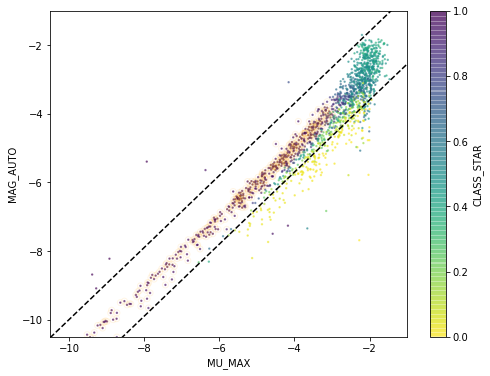

In [9]:
# Star cond
plt.figure(figsize=(8,6))
mag_auto = -2.5*np.log10(Datacube.Tab_SE["FLUX_AUTO"])
plt.scatter(Datacube.Tab_SE["MU_MAX"], mag_auto,
            c = Datacube.Tab_SE["CLASS_STAR"], s=2, cmap='viridis_r', alpha=0.5)

xx = np.linspace(-10.5,-1,100)
plt.plot(xx, 1.05*xx-1.5, 'k--', xx, 1.05*xx+0.5, 'k--')
plt.xlabel("MU_MAX")
plt.ylabel("MAG_AUTO")
plt.xlim(-10.5,-1.)
plt.ylim(-10.5,-1.)
cb = plt.colorbar()
cb.set_label("CLASS_STAR")

star_cond = ((abs(mag_auto-1.05*Datacube.Tab_SE["MU_MAX"]  + 0.5))<1) & (Datacube.Tab_SE['CLASS_STAR']>0.9)
plt.scatter(Datacube.Tab_SE["MU_MAX"][star_cond], mag_auto[star_cond],facecolors='none',color='orange',alpha=0.1)
np.sum(star_cond)

In [10]:
Y_pix, X_pix = np.indices(Datacube.mask_edge.shape)
dist_edge = np.array([np.sqrt((X_pix[~Datacube.mask_edge]-gal["X_IMAGE"])**2 + \
                              (Y_pix[~Datacube.mask_edge]-gal["Y_IMAGE"])**2).min() \
                      for gal in Datacube.Tab_SE])

24
58
5.593324631855012
4.582481046250082


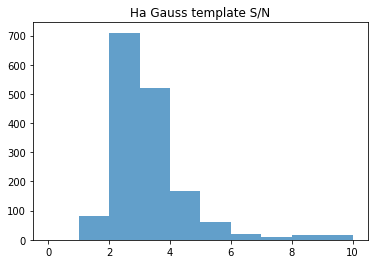

In [11]:
# Gaussian library Ha template (New CC method)
inds_best_Ha = np.argmax(Datacube.CC_Rs_Temps['Ha-NII_gauss'], axis=1)
SNR_best_Ha = np.array([Datacube.CC_SNRs_Temps['Ha-NII_gauss'][i,j] for i,j in enumerate(inds_best_Ha)])
SNRp_best_Ha = np.array([Datacube.CC_SNR_ps_Temps['Ha-NII_gauss'][i,j] for i,j in enumerate(inds_best_Ha)])
flage = Datacube.CC_flag_edge_Temps['OII_gauss']

# Gaussian library Hb template (New CC method)
inds_best_OII = np.argmax(Datacube.CC_Rs_Temps['OII_gauss'], axis=1)
SNR_best_OII = np.array([Datacube.CC_SNRs_Temps['OII_gauss'][i,j] for i,j in enumerate(inds_best_OII)])

plt.hist(SNR_best_Ha,range=[0,10],bins=np.array([0,1,2,3,4,5,6,7,8,10]),alpha=0.7)
plt.title("Ha Gauss template S/N")

# Ha > 8 or OII>5
cond0 = (SNR_best_Ha>8) & (dist_edge>5) & (flage==0)  & (SNR_best_OII>3) 
cond2 = (SNR_best_Ha>5) & (SNR_best_Ha<8) & (dist_edge>5) & (~star_cond) & (flage==0)  & (SNR_best_OII>3)  

print(np.sum(cond0))
print(np.sum(cond2))

print(np.percentile(SNR_best_Ha, 95))
print(np.percentile(SNR_best_Ha, 90))

24
Best z: 0.22059598448342865 Best sigma: 5.0015147835707285
Peak wavl 8011.162381502847
SE Object #41  z: 0.221  Peak R: 2.656  Detction S/N: 12.482 Peak S/N: 9.342


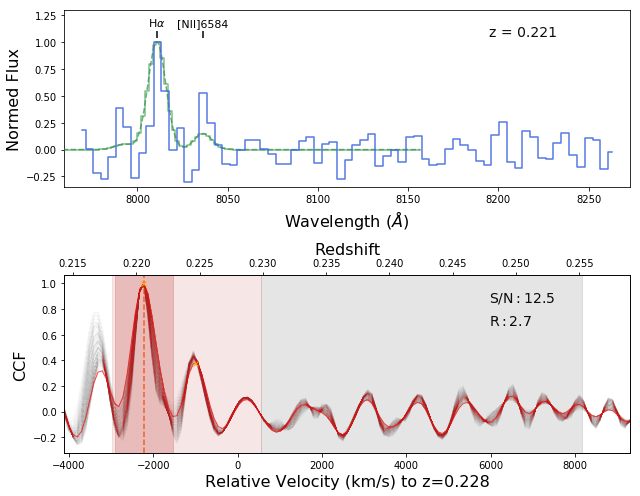

Best z: 0.22717133641307927 Best sigma: 5.0015147835707285
Peak wavl 8053.294714590728
SE Object #77  z: 0.227  Peak R: 3.158  Detction S/N: 8.933 Peak S/N: 7.067


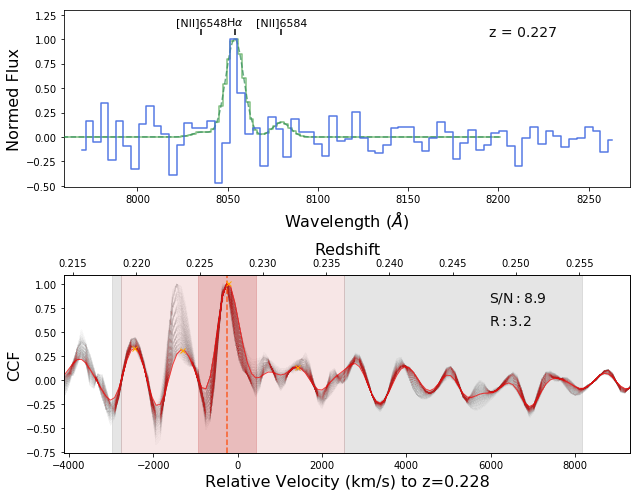

Best z: 0.24061433567792073 Best sigma: 5.0015147835707285
Peak wavl 8142.495256179583
SE Object #79  z: 0.241  Peak R: 3.299  Detction S/N: 11.207 Peak S/N: 8.284


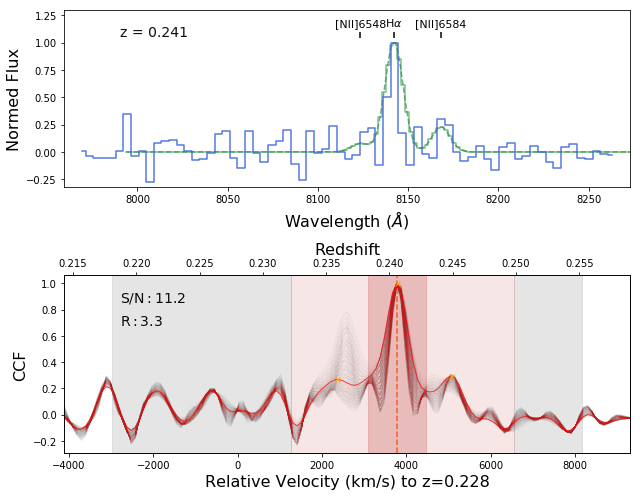

Best z: 0.22155248412727294 Best sigma: 1.8341303394555193
Peak wavl 8019.571177250968
SE Object #127  z: 0.222  Peak R: 2.264  Detction S/N: 11.536 Peak S/N: 7.941


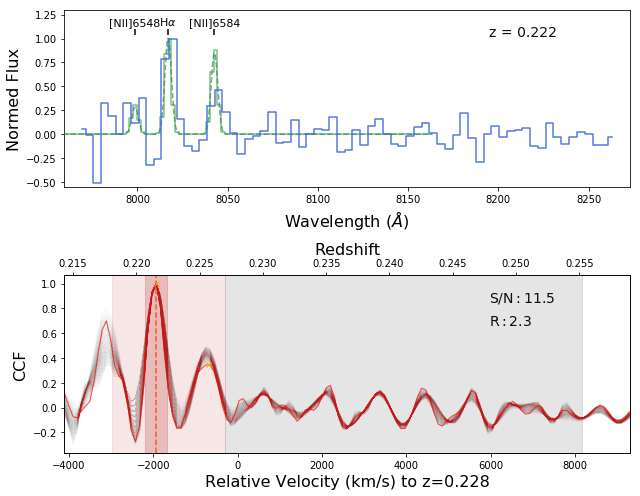

Best z: 0.2304501167215772 Best sigma: 5.0015147835707285
Peak wavl 8074.443901886031
SE Object #156  z: 0.230  Peak R: 7.848  Detction S/N: 24.117 Peak S/N: 20.630


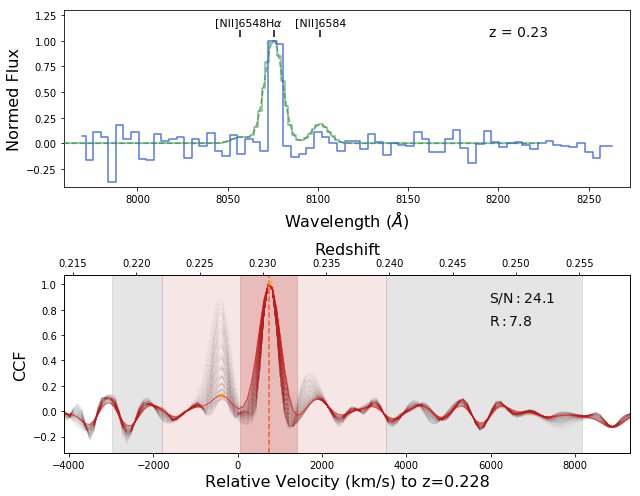

Best z: 0.22520406822798053 Best sigma: 5.0015147835707285
Peak wavl 8040.631801364043
SE Object #194  z: 0.225  Peak R: 1.533  Detction S/N: 12.224 Peak S/N: 4.954


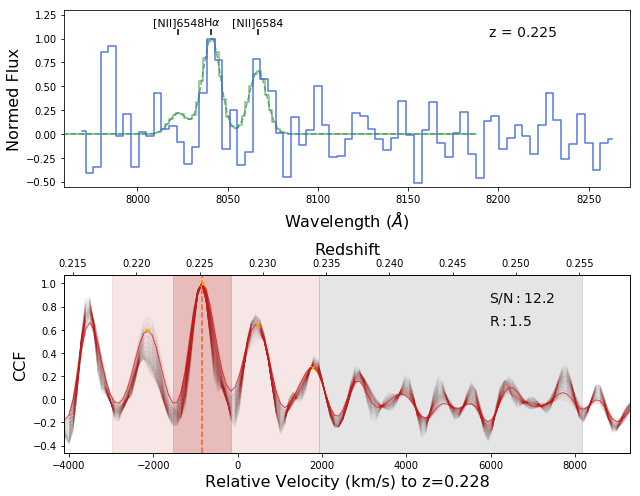

Best z: 0.22513695413402082 Best sigma: 5.0015147835707285
Peak wavl 8040.631801364043
SE Object #280  z: 0.225  Peak R: 1.191  Detction S/N: 8.090 Peak S/N: 4.196


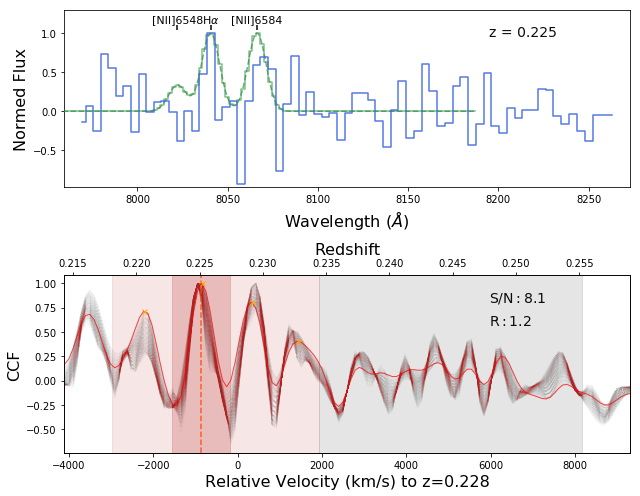

Best z: 0.22059598448342865 Best sigma: 2.1860619443572094
Peak wavl 8011.162381502847
SE Object #301  z: 0.221  Peak R: 2.523  Detction S/N: 17.900 Peak S/N: 11.229


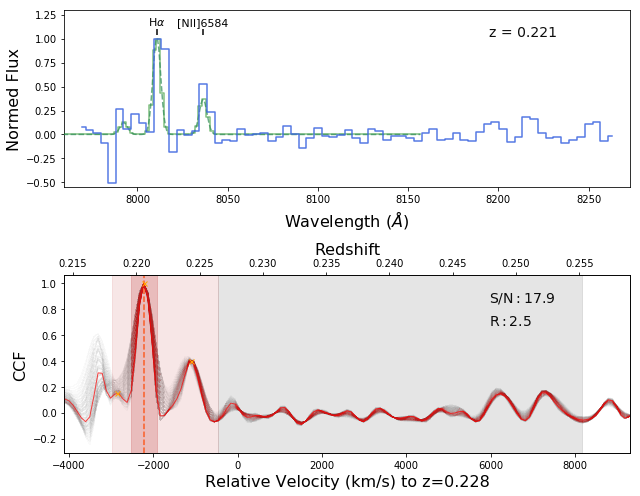

Best z: 0.22513695413402082 Best sigma: 3.5937883639639687
Peak wavl 8040.631801364043
SE Object #319  z: 0.225  Peak R: 5.688  Detction S/N: 17.835 Peak S/N: 15.063


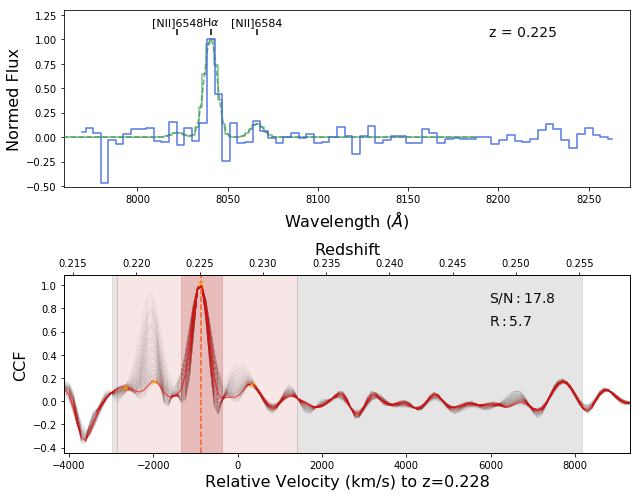

Best z: 0.22059598448342865 Best sigma: 5.0015147835707285
Peak wavl 8011.162381502847
SE Object #387  z: 0.221  Peak R: 2.889  Detction S/N: 9.869 Peak S/N: 8.045


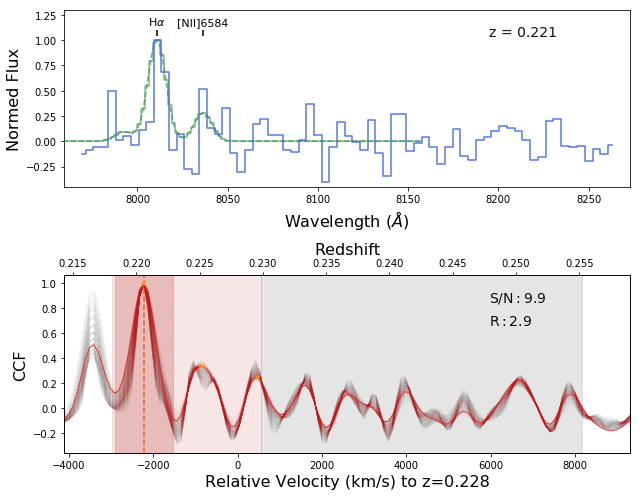

Best z: 0.23241738490667593 Best sigma: 5.0015147835707285
Peak wavl 8087.160064621663
SE Object #409  z: 0.232  Peak R: 4.635  Detction S/N: 9.258 Peak S/N: 7.304


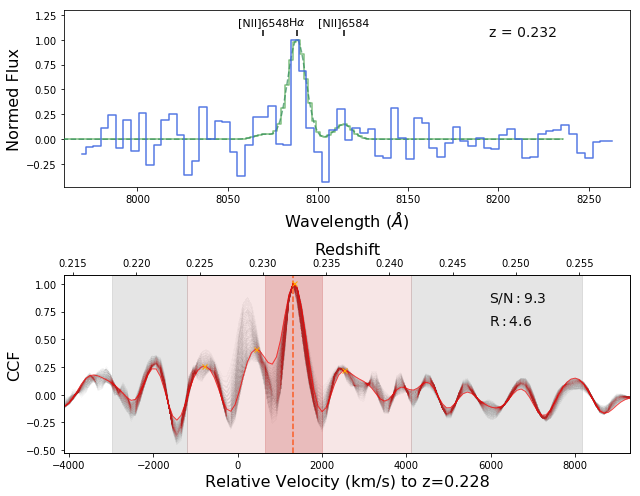

Best z: 0.22710422231911956 Best sigma: 5.0015147835707285
Peak wavl 8053.294714590728
SE Object #457  z: 0.227  Peak R: 3.358  Detction S/N: 8.113 Peak S/N: 5.969


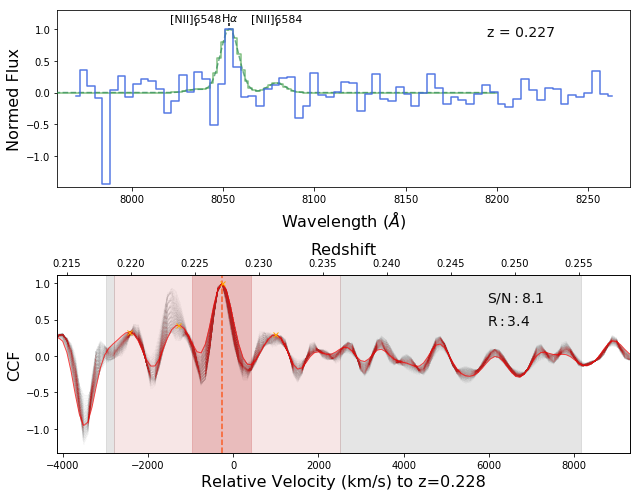

Best z: 0.2261877023205299 Best sigma: 2.1860619443572094
Peak wavl 8049.071529244185
SE Object #581  z: 0.226  Peak R: 2.100  Detction S/N: 8.904 Peak S/N: 6.348


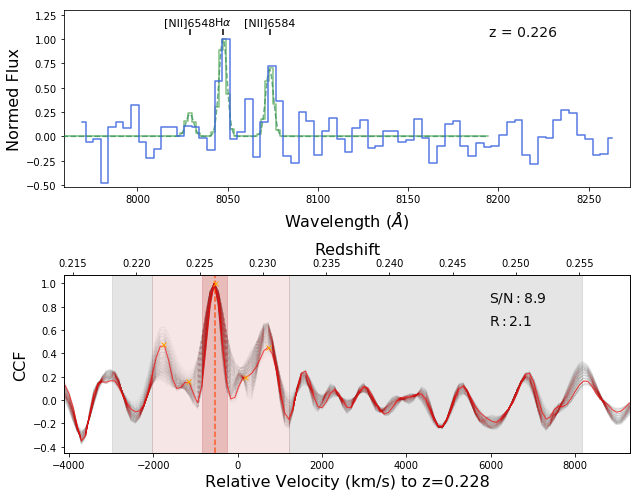

Best z: 0.23110587278327677 Best sigma: 2.537993549258899
Peak wavl 8082.9191201274425
SE Object #628  z: 0.231  Peak R: 4.523  Detction S/N: 7.924 Peak S/N: 7.380


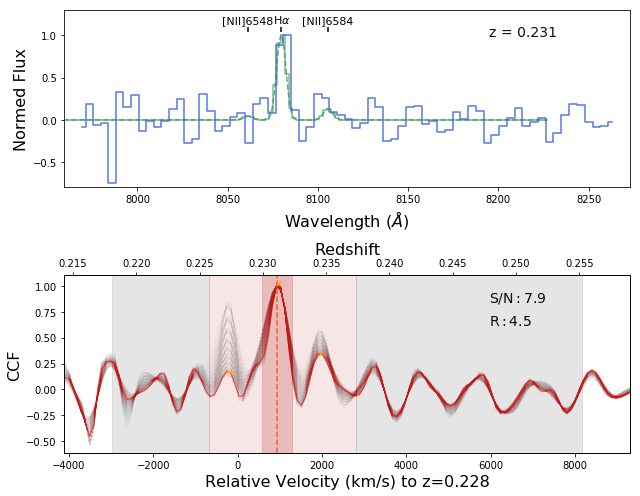

Best z: 0.2336617829361154 Best sigma: 5.0015147835707285
Peak wavl 8095.648630191456
SE Object #813  z: 0.234  Peak R: 7.307  Detction S/N: 8.906 Peak S/N: 7.617


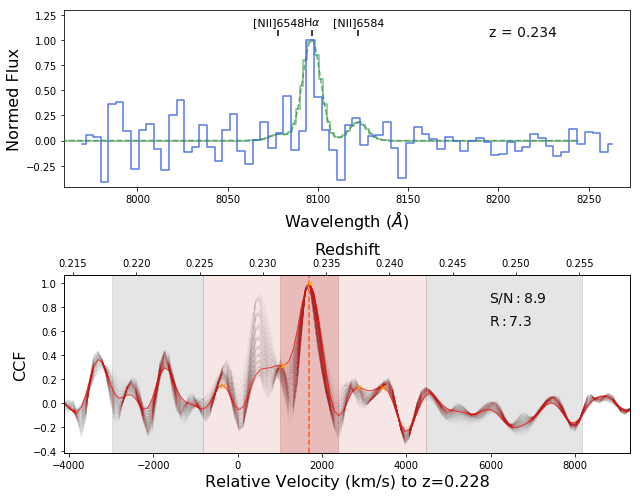

Best z: 0.23857995339886226 Best sigma: 4.297651573767348
Peak wavl 8129.692084989176
SE Object #832  z: 0.239  Peak R: 6.154  Detction S/N: 9.780 Peak S/N: 9.182


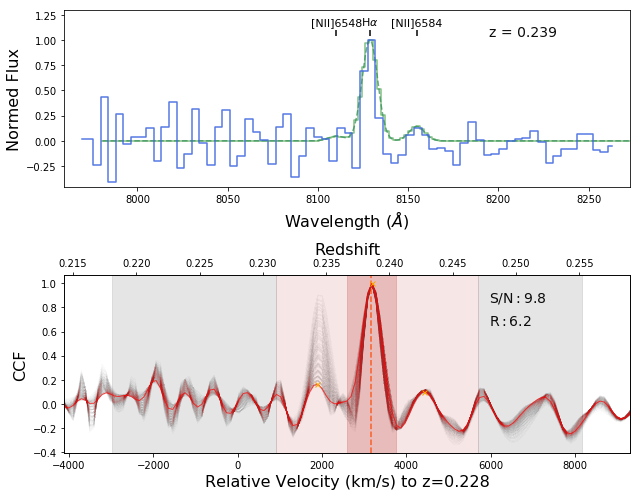

Best z: 0.22743210034996936 Best sigma: 5.0015147835707285
Peak wavl 8057.520115757371
SE Object #1062  z: 0.227  Peak R: 2.595  Detction S/N: 9.262 Peak S/N: 6.649


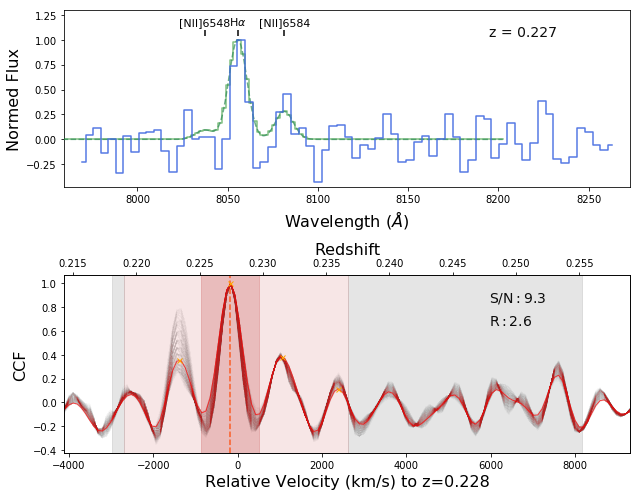

Best z: 0.2504140790136442 Best sigma: 5.0015147835707285
Peak wavl 8232.683807881298
SE Object #1143  z: 0.250  Peak R: 1.201  Detction S/N: 8.164 Peak S/N: 5.000


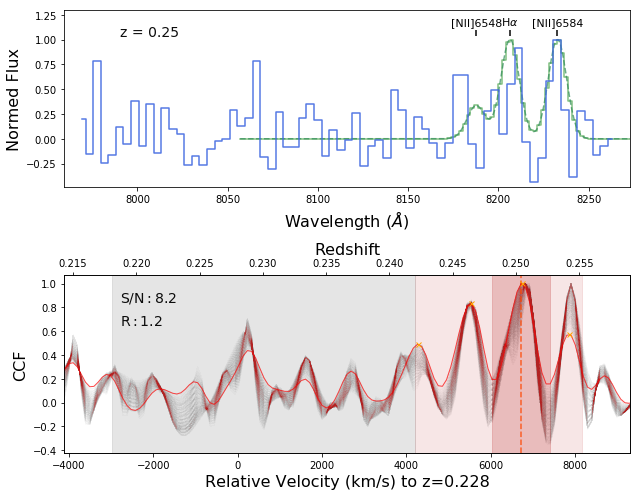

Best z: 0.22091619596571904 Best sigma: 2.889925154160589
Peak wavl 8015.365676684849
SE Object #1167  z: 0.221  Peak R: 8.289  Detction S/N: 8.110 Peak S/N: 8.365


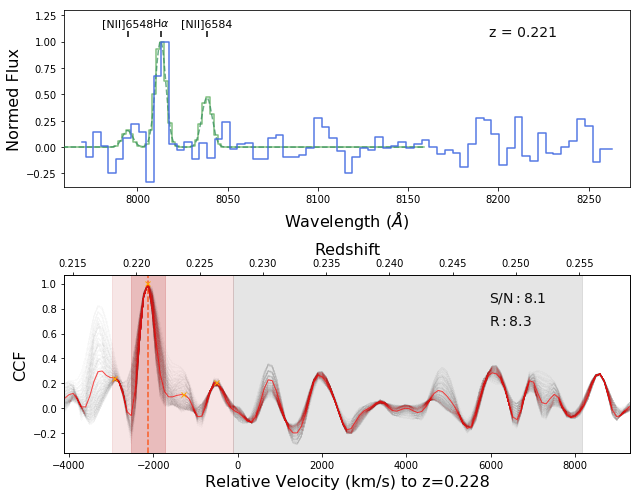

Best z: 0.2265155803513797 Best sigma: 2.889925154160589
Peak wavl 8049.071529244185
SE Object #1223  z: 0.227  Peak R: 9.362  Detction S/N: 11.617 Peak S/N: 10.073


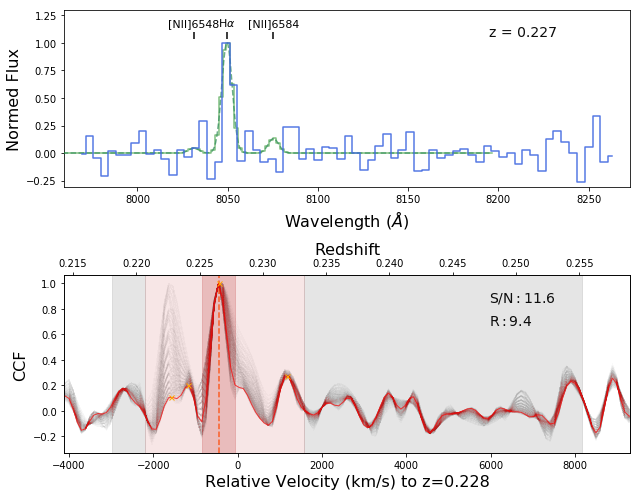

Best z: 0.23274526293752573 Best sigma: 5.0015147835707285
Peak wavl 8091.403234253834
SE Object #1267  z: 0.233  Peak R: 3.009  Detction S/N: 9.711 Peak S/N: 8.214


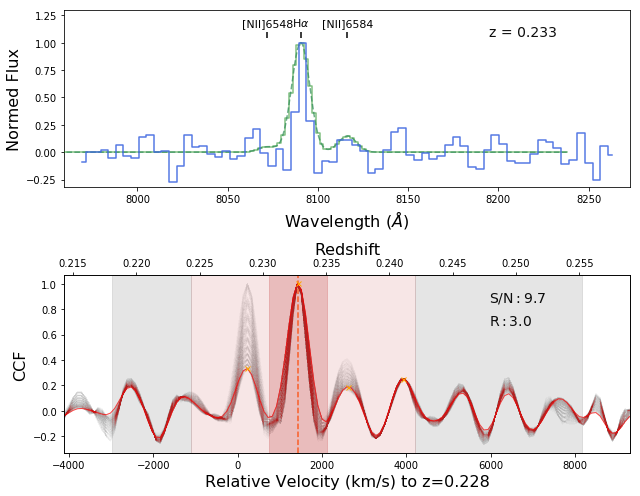

Best z: 0.22717133641307927 Best sigma: 4.6495831786690385
Peak wavl 8053.294714590728
SE Object #1280  z: 0.227  Peak R: 4.800  Detction S/N: 36.977 Peak S/N: 13.646


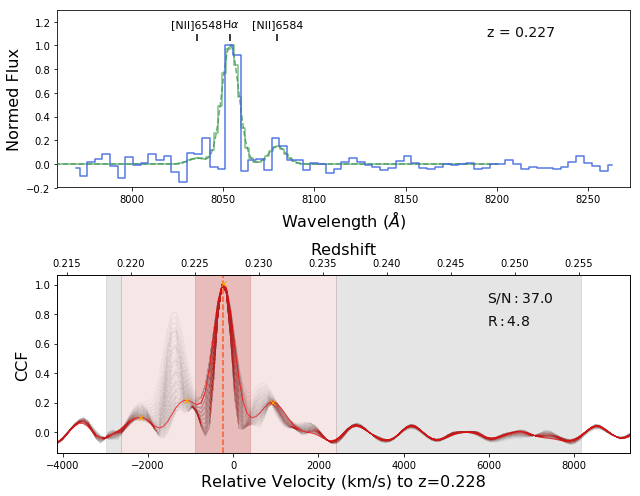

Best z: 0.23989146552226145 Best sigma: 5.0015147835707285
Peak wavl 8163.878697780468
SE Object #1384  z: 0.240  Peak R: 1.495  Detction S/N: 7.995 Peak S/N: 4.748


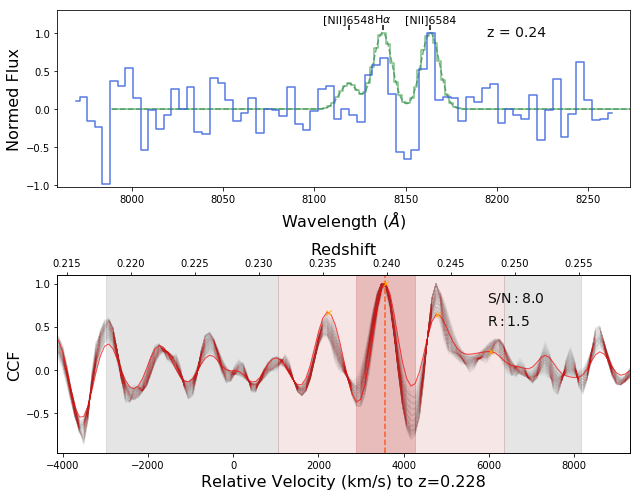

Best z: 0.2261205882265702 Best sigma: 3.5937883639639687
Peak wavl 8049.071529244185
SE Object #1506  z: 0.226  Peak R: 5.239  Detction S/N: 10.997 Peak S/N: 8.396


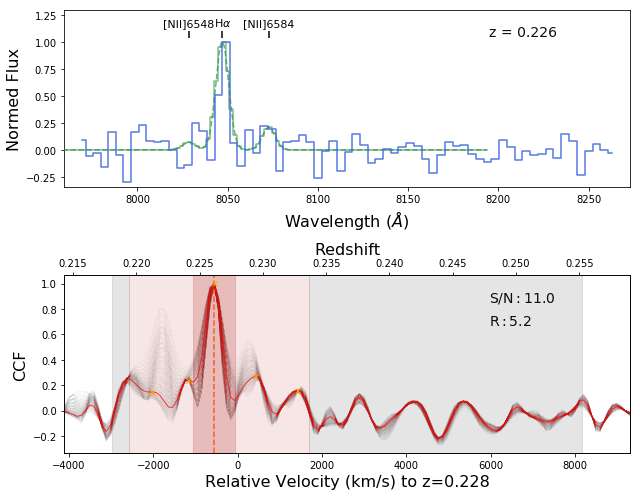

In [14]:
cond = cond0
print(np.sum(cond))
for j, (cc_num) in enumerate(Datacube.cc_nums[cond]):
    ccs, rv, z_ccs, Rs, Contrasts, SNRs, SNR_ps = Datacube.cross_correlation(cc_num, 
                                                                             temp_type="Ha-NII", temp_model="gauss")
    plt.savefig("./A2390NW/fig/xcorr_v4/SNa/CC#%d.png"%(cc_num), dpi=100)
    plt.show()
    plt.close()

7


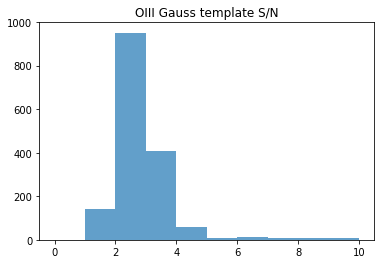

In [13]:
# Gaussian library Hb template (New CC method)
inds_best_Hb = np.argmax(Datacube.CC_Rs_Temps['Hb-OIII_gauss'], axis=1)
SNR_best_Hb = np.array([Datacube.CC_SNRs_Temps['Hb-OIII_gauss'][i,j] for i,j in enumerate(inds_best_Hb)])

plt.hist(SNR_best_Hb,range=[0,10],bins=np.array([0,1,2,3,4,5,6,7,8,10]),alpha=0.7)
plt.title("OIII Gauss template S/N")

cond_b = (SNR_best_Hb>5) &  (SNR_best_Hb>SNR_best_Ha) & (SNR_best_OII>3) & (dist_edge>5) & (~star_cond) & (flage==0)  

print(np.sum(cond_b))

7
S/N Ha: 7.117212174880755
Best z: 0.6068036373173696 Best sigma: 2.1860619443572094
Peak wavl 8044.850558555739
SE Object #283  z: 0.607  Peak R: 5.118  Detction S/N: 7.089 Peak S/N: 7.089


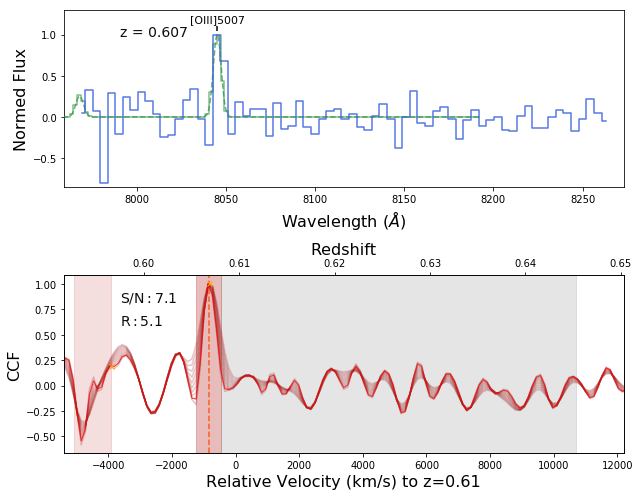

S/N Ha: 4.581908205309579
Best z: 0.6403247676561306 Best sigma: 3.5937883639639687
Peak wavl 8215.428355775559
SE Object #1107  z: 0.640  Peak R: 4.021  Detction S/N: 5.363 Peak S/N: 5.363


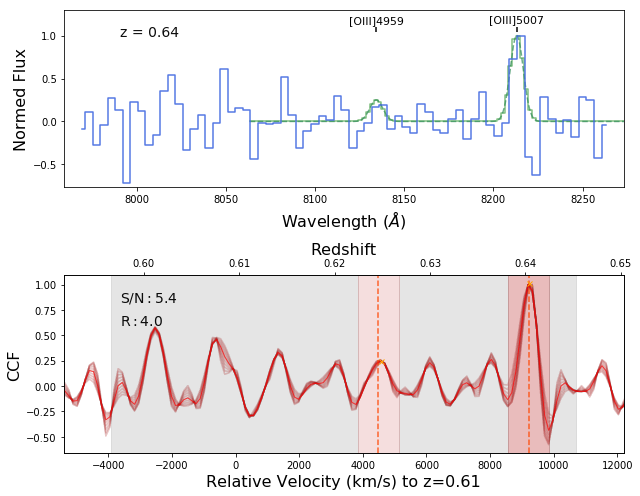

S/N Ha: 5.394828374015859
Best z: 0.6256464482732514 Best sigma: 5.0015147835707285
Peak wavl 8138.225293652581
SE Object #1131  z: 0.626  Peak R: 2.920  Detction S/N: 6.508 Peak S/N: 6.508


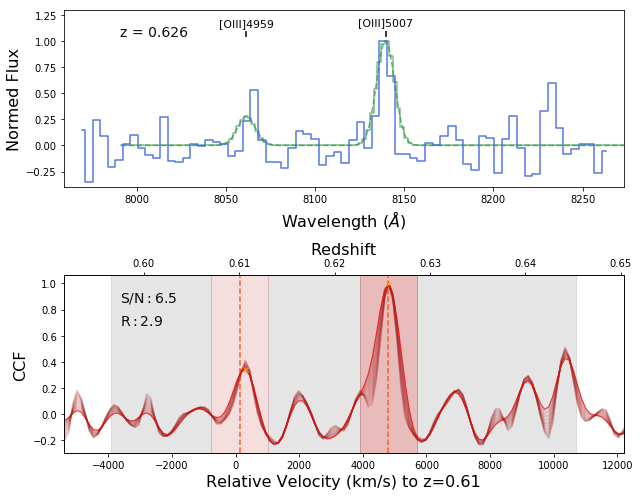

S/N Ha: 8.079261555312698
Best z: 0.6002970276937618 Best sigma: 1.8341303394555193
Peak wavl 8015.365676684849
SE Object #1167  z: 0.600  Peak R: 9.886  Detction S/N: 8.916 Peak S/N: 8.916


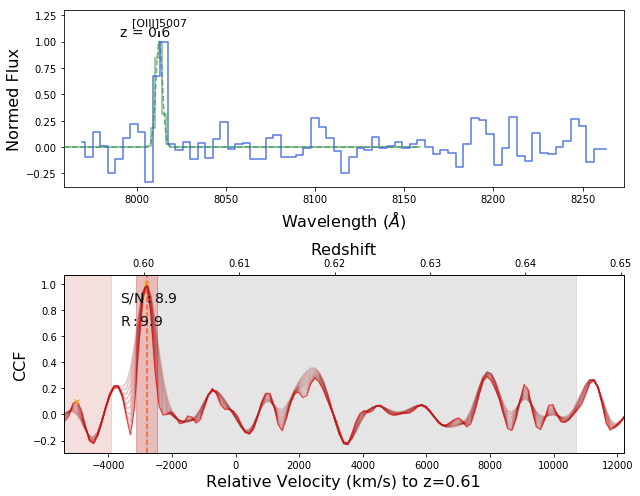

S/N Ha: 3.8245970547445154
Best z: 0.6433199925038875 Best sigma: 5.0015147835707285
Peak wavl 8228.366550056708
SE Object #1443  z: 0.643  Peak R: 4.888  Detction S/N: 5.228 Peak S/N: 5.228


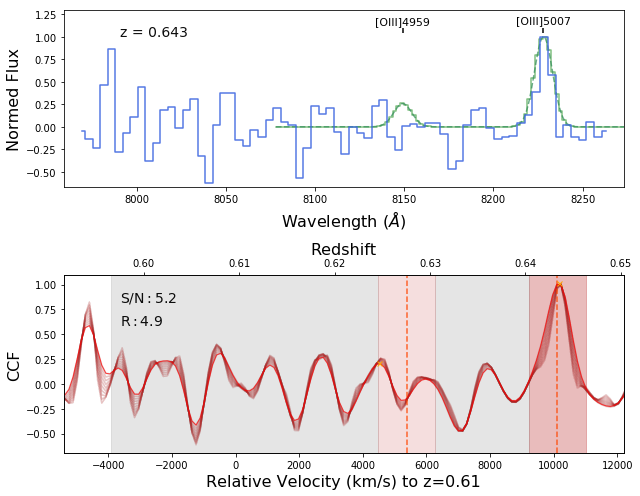

S/N Ha: 6.953480339956055
Best z: 0.6213487380346511 Best sigma: 5.0015147835707285
Peak wavl 8116.909045366228
SE Object #1451  z: 0.621  Peak R: 3.702  Detction S/N: 7.318 Peak S/N: 7.318


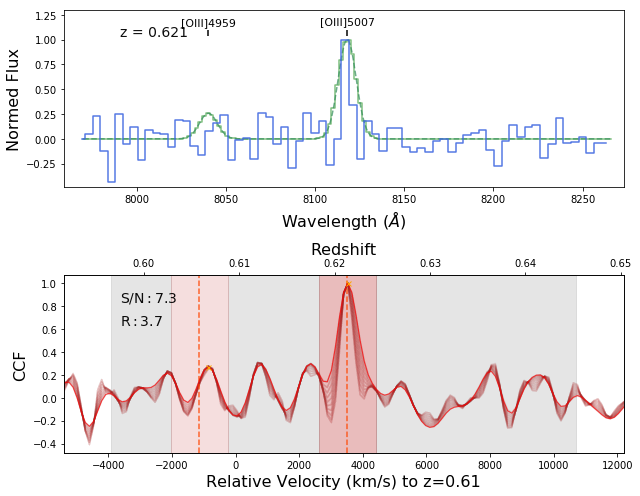

S/N Ha: 6.104760501251754
Best z: 0.643273082455239 Best sigma: 4.6495831786690385
Peak wavl 8228.366550056708
SE Object #1456  z: 0.643  Peak R: 9.470  Detction S/N: 6.543 Peak S/N: 6.543


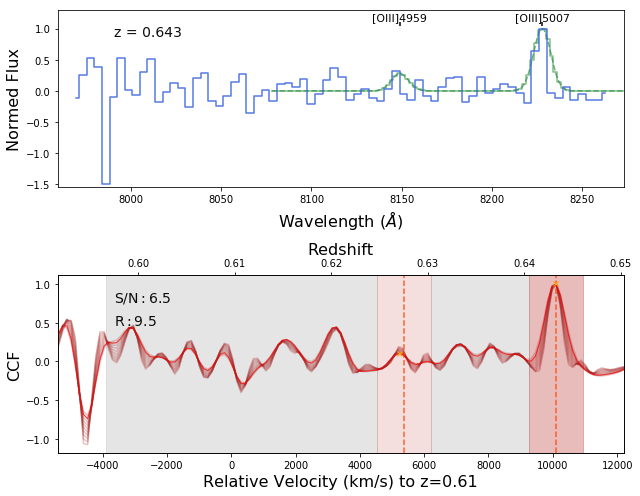

In [15]:
cond = cond_b
print(np.sum(cond))
for j, (cc_num) in enumerate(np.int64(Datacube.cc_nums[cond])):
    print("S/N Ha:",SNR_best_Ha[cc_num-1])
    ccs, rv, z_ccs, Rs, Contrasts, SNRs, SNR_ps = Datacube.cross_correlation(cc_num,
                                                                            temp_type="Hb-OIII", temp_model="gauss")
    plt.savefig("./A2390NW/fig/xcorr_v4/SNc/CC#%d.png"%(cc_num), dpi=100)
    plt.show()
    plt.close()

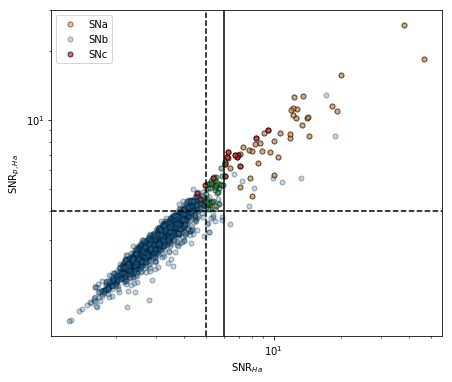

In [22]:
# Ha + Hb
plt.figure(figsize=(7,6))
plt.loglog(SNR_best_Ha, SNRp_best_Ha, ".", ms=10, mec='k', alpha=0.3)
plt.loglog(SNR_best_Ha[cond0], SNRp_best_Ha[cond0], ".", mec='k', ms=10, alpha=0.5, label="SNa")
plt.loglog(SNR_best_Ha[cond2], SNRp_best_Ha[cond2], ".", mec='k', ms=10, alpha=0.3, label="SNb")
plt.loglog(SNR_best_Ha[cond_b], SNRp_best_Ha[cond_b], ".", mec='k', ms=10, alpha=0.7, label="SNc")
plt.axvline(6, ls='-', color='k')
plt.axvline(5, ls='--', color='k')
plt.axhline(4, ls='--', color='k')
plt.xlabel("SNR$_{Ha}$")
plt.ylabel("SNR$_{p,Ha}$")
plt.legend(loc=2)

In [18]:
#Composite 
import re
import glob
el_ls = glob.glob("./A2390NW/fig/xcorr_v4/SNa/*.png")
for el in el_ls:
    img_cc = plt.imread(el)
    ind = re.compile(r'\d+').findall(el)[-1]
    img_confit = plt.imread("./A2390NW/fig/fit_cont_v2/SE#%s.png"%ind)
    img_spec = plt.imread("./A2390NW/fig/spec_v2//SE#%s.png"%ind)
    img_thumb = plt.imread("./A2390NW/fig/img_thumb_v2//SE#%s.png"%ind)
    plt.figure(figsize=(16,12))
    ax1 = plt.subplot2grid((3, 3), (0, 0), rowspan=1, colspan=2)
    ax2 = plt.subplot2grid((3, 3), (1, 0), rowspan=2, colspan=2)
    ax3 = plt.subplot2grid((3, 3), (0, 2), rowspan=1, colspan=1)
    ax4 = plt.subplot2grid((3, 3), (1, 2), rowspan=1, colspan=1)
    ax1.imshow(img_confit)
    ax2.imshow(img_cc)
    ax3.imshow(img_spec)
    ax4.imshow(img_thumb)
    for ax in (ax1,ax2,ax3,ax4):
        ax.axis("off")
#     plt.suptitle("Flag: 1",fontsize=18)
    plt.tight_layout()
    plt.savefig("./A2390NW/fig/candidate_v4/SNa/#EL-%s.png"%ind,dpi=100)
    plt.close()

In [17]:
#Composite 
import re
import glob
el_ls = glob.glob("./A2390NW/fig/xcorr_v4/SNc/*.png")
for el in el_ls:
    img_cc = plt.imread(el)
    ind = re.compile(r'\d+').findall(el)[-1]
    img_confit = plt.imread("./A2390NW/fig/fit_cont_v2/SE#%s.png"%ind)
    img_spec = plt.imread("./A2390NW/fig/spec_v2//SE#%s.png"%ind)
    img_thumb = plt.imread("./A2390NW/fig/img_thumb_v2/SE#%s.png"%ind)
    plt.figure(figsize=(16,12))
    ax1 = plt.subplot2grid((3, 3), (0, 0), rowspan=1, colspan=2)
    ax2 = plt.subplot2grid((3, 3), (1, 0), rowspan=2, colspan=2)
    ax3 = plt.subplot2grid((3, 3), (0, 2), rowspan=1, colspan=1)
    ax4 = plt.subplot2grid((3, 3), (1, 2), rowspan=1, colspan=1)
    ax1.imshow(img_confit)
    ax2.imshow(img_cc)
    ax3.imshow(img_spec)
    ax4.imshow(img_thumb)
    for ax in (ax1,ax2,ax3,ax4):
        ax.axis("off")
    plt.tight_layout()
    plt.savefig("./A2390NW/fig/candidate_v4/SNc/#EL-%s.png"%ind,dpi=100)
    plt.close()

## 5. Centroid Analysis

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
import glob
import re
import warnings
warnings.filterwarnings('ignore')
from pipeline import *
from utils import *

Datacube = Read_Datacube("/home/qliu/data/A2390F/A2390NW_cube_v2.fits", name="A2390NW", z0=0.228, 
                         SE_catalog="./A2390NW/SE_v2/A2390NW_run2.cat") 
                        # deep_frame='/home/qliu/data/A2390F/A2390NW_deep.fits')
Datacube.read_mask('/home/qliu/data/A2390F/Raw_stack_A2390NW_mask.fits')
Datacube.read_seg('./A2390NW/SE_v2/segment_run2.fits')
Datacube.read_spec('./A2390NW/A2390NW-spec_v2.fits')

Datacube.generate_template(n_ratio=8, n_stddev=10, n_intp=2,
                           temp_type="OII", ratio_prior="uniform", temp_model='gauss')
Datacube.read_cc('./A2390NW/A2390NW-cc_OII_gauss_v4.fits')

Datacube.generate_template(n_ratio=8, n_stddev=10, n_intp=2, ratio_range = (2., 4.),
                           temp_type="Hb-OIII", ratio_prior="uniform", temp_model='gauss')
Datacube.read_cc('./A2390NW/A2390NW-cc_Hb-OIII_gauss_v4.fits')
el_ls_b = glob.glob("./A2390NW/fig/candidate_v4/SNc/#*.png")
Num_b = np.sort(np.array([re.compile(r'\d+').findall(el)[-1] for el in el_ls_b]).astype("int"))
z_b = Datacube.z_best[Num_b-1]

Datacube.generate_template(n_ratio=50, n_stddev=10, n_intp=2, ratio_range = (1., 8),
                           temp_type="Ha-NII", ratio_prior="uniform", temp_model='gauss')
Datacube.read_cc('./A2390NW/A2390NW-cc_Ha-NII_gauss_v4.fits')

# el_ls_v = glob.glob("./A2390NW/fig/candidate_v3/visual/*.png")
el_ls_v = glob.glob("./A2390NW/fig/candidate_v4/visual/**/*.png", recursive=True)
Num_v = np.sort(np.array([re.compile(r'\d+').findall(el)[-1] for el in el_ls_v]).astype("int"))
ind_v = Num_v-1
print(Num_v)

Datacube.z_best[Num_b-1] = z_b

w = WCS(Datacube.hdu[0].header, naxis=2)
Datacube.assign_BCG_coordinate((328.40351201,17.69544013))
X_BCG, Y_BCG = Datacube.wcs.all_world2pix(Datacube.coord_BCG.ra, Datacube.coord_BCG.dec, 1)
Datacube.pos_BCG = (X_BCG, Y_BCG)

Template: OII_gauss  Total Number: 10
Read cross-correlation result... Template:OII_gauss
Template: Hb-OIII_gauss  Total Number: 80
Read cross-correlation result... Template:Hb-OIII_gauss
Template: Ha-NII_gauss  Total Number: 500
Read cross-correlation result... Template:Ha-NII_gauss
[  20   41   66   77   79  122  127  156  189  194  196  283  289  301
  319  359  387  409  442  457  502  519  520  581  628  813  832  923
  944  960 1057 1062 1131 1167 1223 1267 1280 1319 1341 1451 1456 1506]
INFO: 
                Inconsistent SIP distortion information is present in the FITS header and the WCS object:
                SIP coefficients were detected, but CTYPE is missing a "-SIP" suffix.
                astropy.wcs is using the SIP distortion coefficients,
                therefore the coordinates calculated here might be incorrect.

                If you do not want to apply the SIP distortion coefficients,
                please remove the SIP coefficients from the FITS header or t

In [4]:
for i in range(19):
    print("Catalog %d"%(i+1))
    generate_catalog('./A2390NW/centroid_catalog/centroid_analysis_A2390NW_m2aper_all_weight_med_v9.%d.csv'%(i+1),
                     Datacube, Num_v=Num_v, wcs=w, n_rand=99)

Catalog 1
Measuring Centroids for 42 candidates...
Isophotal area threshold:  10.0
Distance to field edge threshold:  50
Control Sample : n=946
Saving Catalog...
Catalog 2
Measuring Centroids for 42 candidates...
Isophotal area threshold:  10.0
Distance to field edge threshold:  50
Control Sample : n=947
Saving Catalog...
Catalog 3
Measuring Centroids for 42 candidates...
Isophotal area threshold:  10.0
Distance to field edge threshold:  50
Control Sample : n=945
Saving Catalog...
Catalog 4
Measuring Centroids for 42 candidates...
Isophotal area threshold:  10.0
Distance to field edge threshold:  50
Control Sample : n=946
Saving Catalog...
Catalog 5
Measuring Centroids for 42 candidates...
Isophotal area threshold:  10.0
Distance to field edge threshold:  50
Control Sample : n=947
Saving Catalog...
Catalog 6
Measuring Centroids for 42 candidates...
Isophotal area threshold:  10.0
Distance to field edge threshold:  50
Control Sample : n=947
Saving Catalog...
Catalog 7
Measuring Centroid

32
29
28


Text(0.5,0,'A2390NW Candidate Redshift')

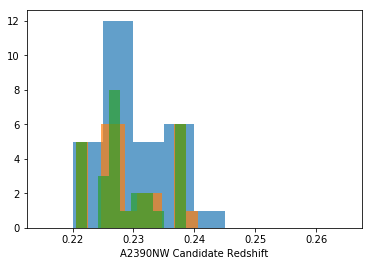

In [2]:
inds_best_Ha = np.argmax(Datacube.CC_Rs_Temps['Ha-NII_gauss'], axis=1)
SNR_best_Ha = np.array([Datacube.CC_SNRs_Temps['Ha-NII_gauss'][i,j] for i,j in enumerate(inds_best_Ha)])
inds_best_Hb = np.argmax(Datacube.CC_Rs_Temps['Hb-OIII_gauss'], axis=1)
SNR_best_Hb = np.array([Datacube.CC_SNRs_Temps['Hb-OIII_gauss'][i,j] for i,j in enumerate(inds_best_Hb)])

Num_va = np.setdiff1d(Num_v,Num_b)
ind_v = Num_va-1

Num_vp=Num_va[(Datacube.z_best[Num_va-1]<0.24) & (Datacube.z_best[Num_va-1]>0.216)]
ind_v = Num_vp-1
Num_vp


optimal aperture:2.0
Aper (min,max): (1.40,2.00)


(169.17112892052532,
 2.5306811378642897,
 2615.0287682865537,
 301.01659585253697,
 131.84546693201165,
 1.2108977657841251)

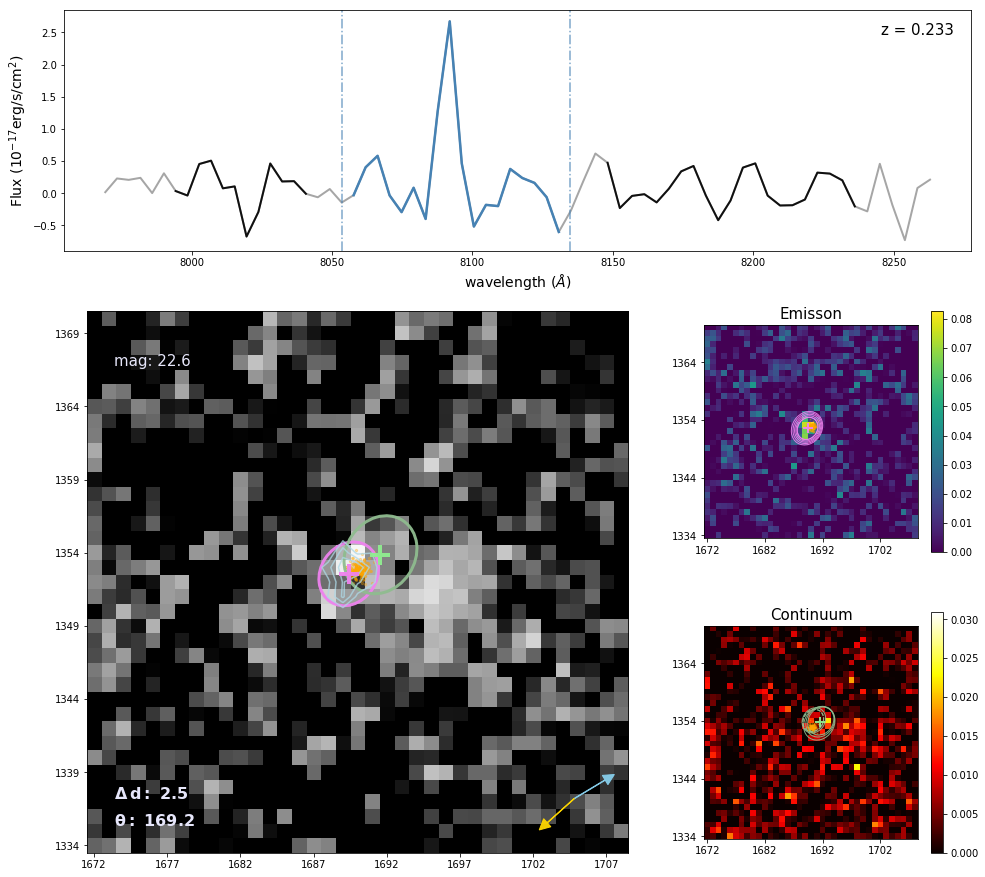

In [2]:
Datacube.centroid_analysis(num=1267, centroid_type='APER')

optimal aperture:2.0
Aper (min,max): (1.40,2.00)


(58.943713174909874,
 1.5199132105768338,
 1109.6719116818922,
 88.29767376257882,
 147.2413869374887,
 0.5978867077597738)

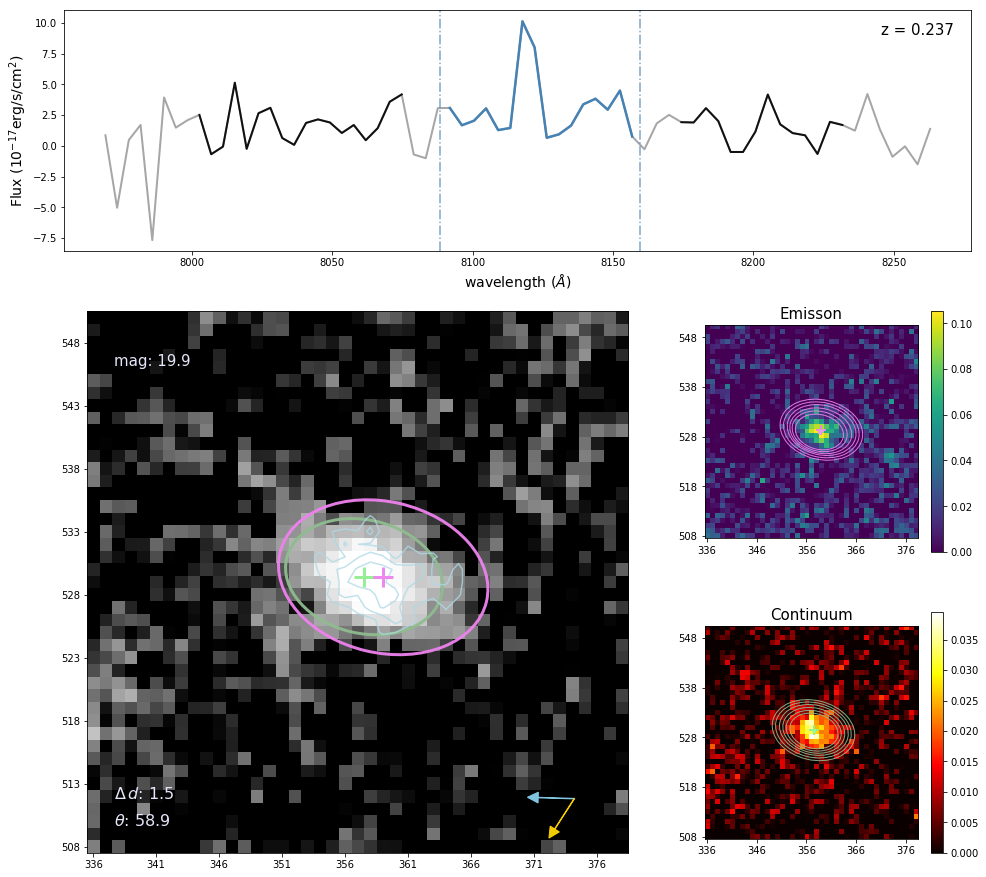

In [3]:
Datacube.centroid_analysis(num=442, centroid_type='APER')

optimal aperture:2.0
Aper (min,max): (1.40,2.00)


(32.415305514775284,
 0.8147689077778459,
 1715.8885935113224,
 141.69396660399514,
 109.27866108921985,
 0.4881092364614012)

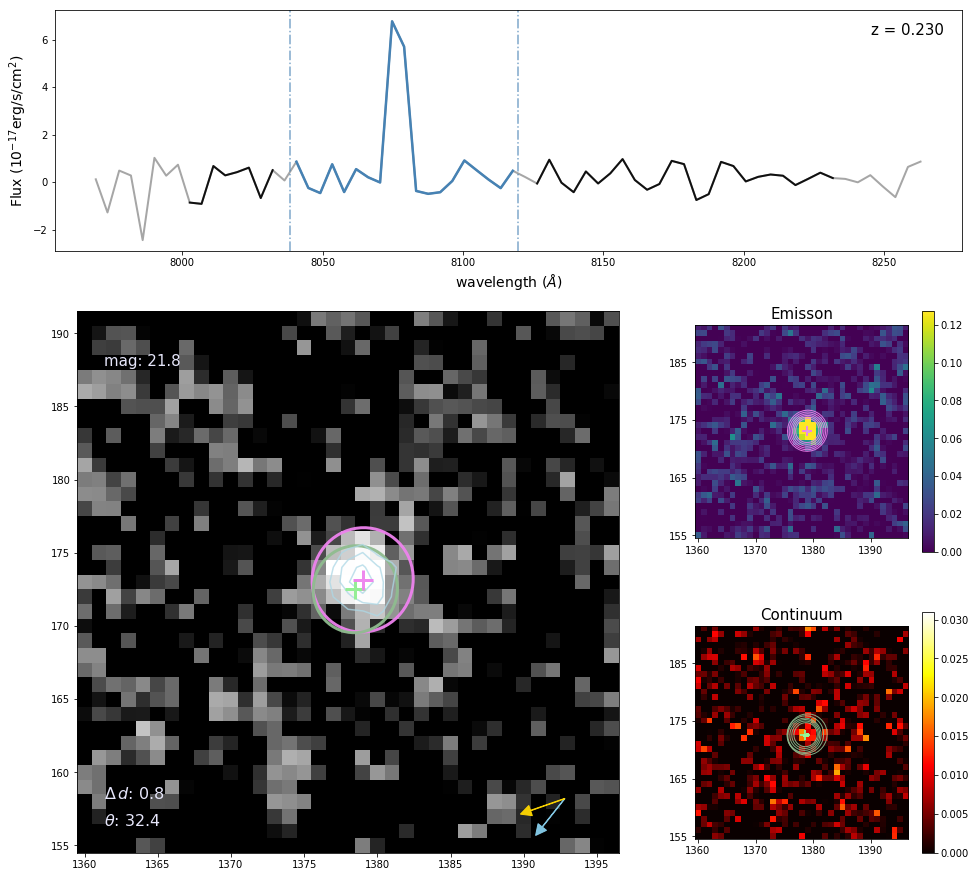

In [4]:
Datacube.centroid_analysis(num=156,centroid_type='APER')

optimal aperture:2.3
Aper (min,max): (1.61,2.30)


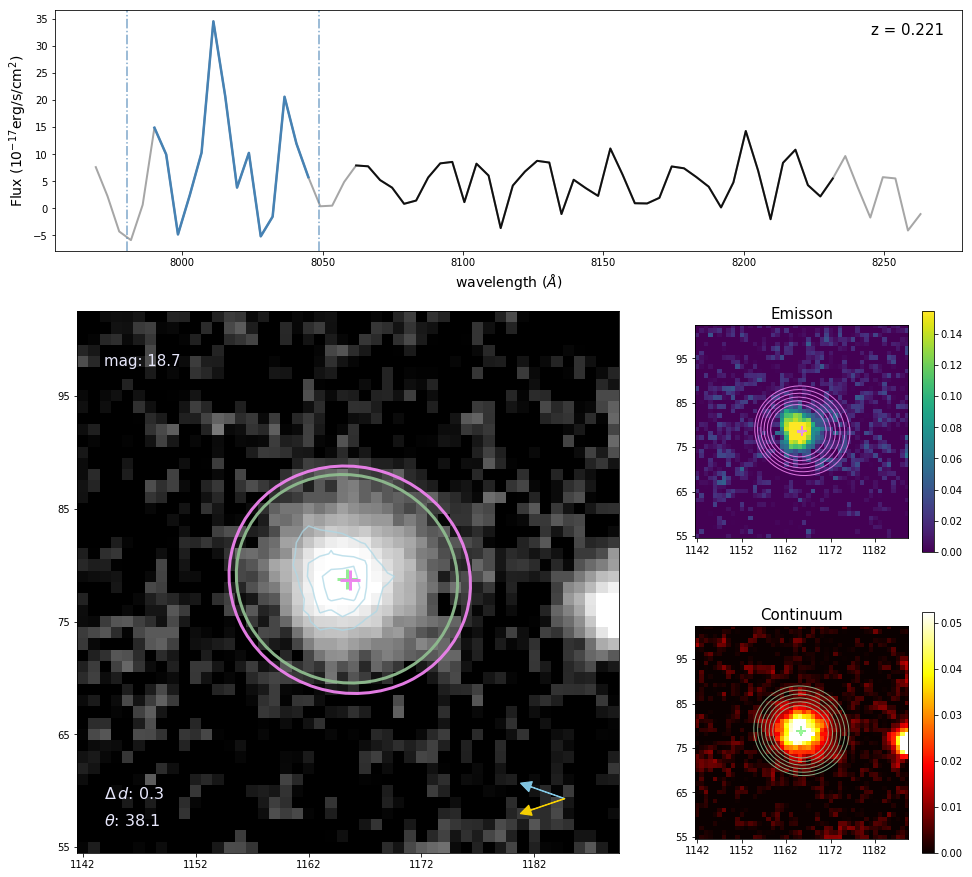

optimal aperture:2.0
Aper (min,max): (1.40,2.00)


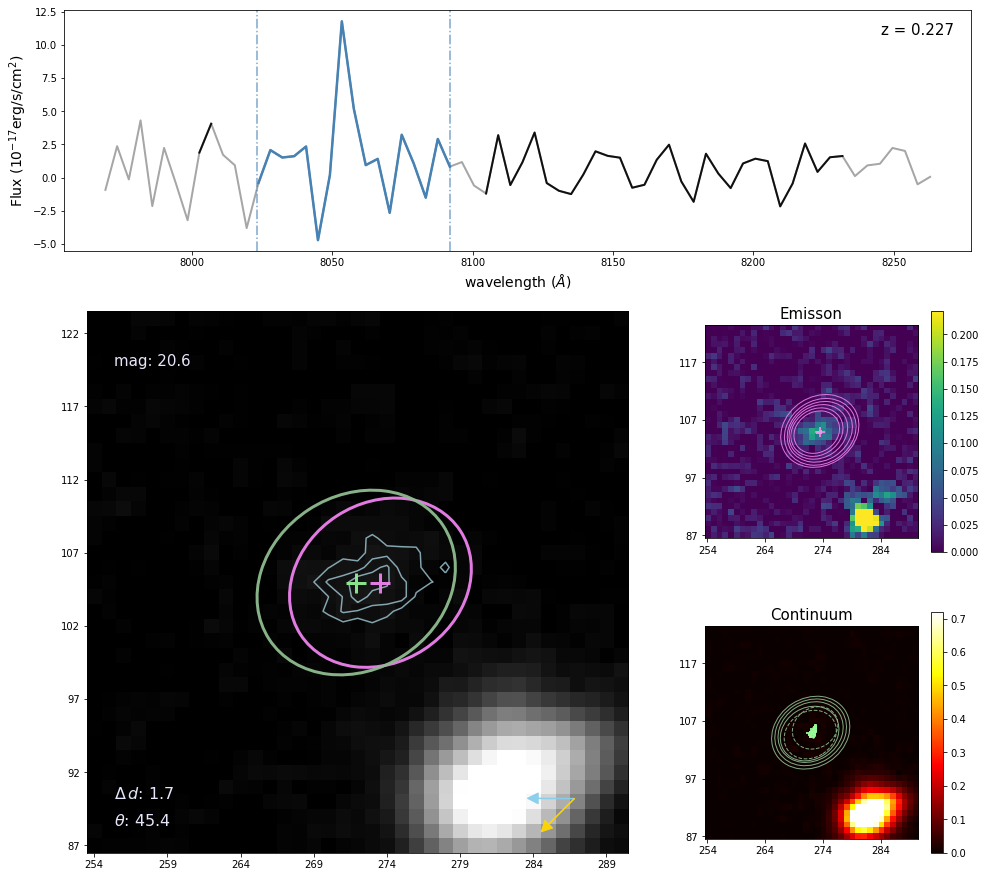

optimal aperture:2.4
Aper (min,max): (1.68,2.40)


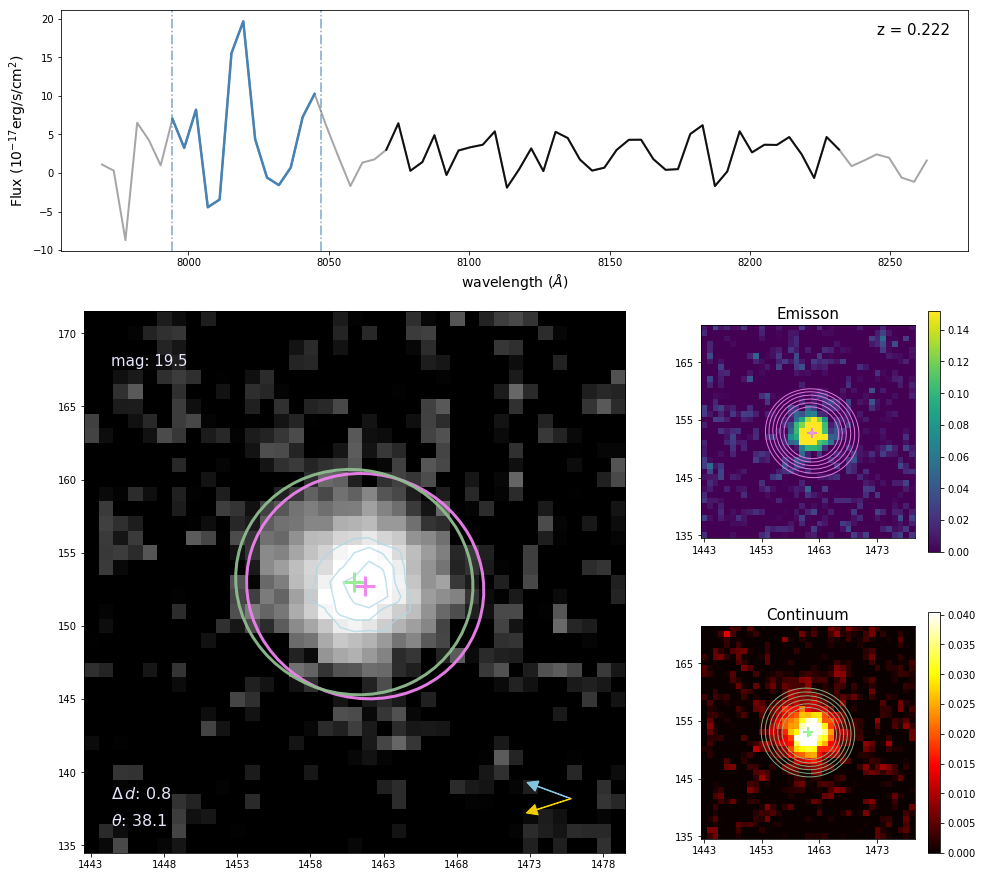

optimal aperture:2.0
Aper (min,max): (1.40,2.00)


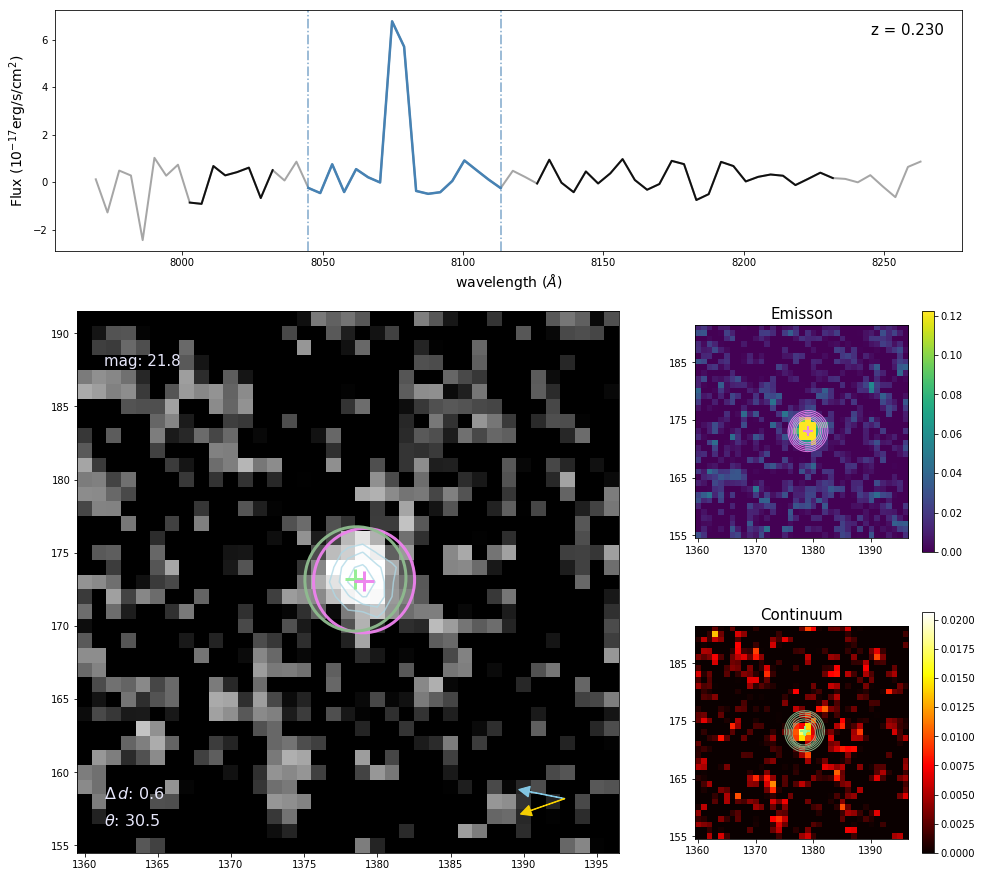

optimal aperture:2.6
Aper (min,max): (1.82,2.60)


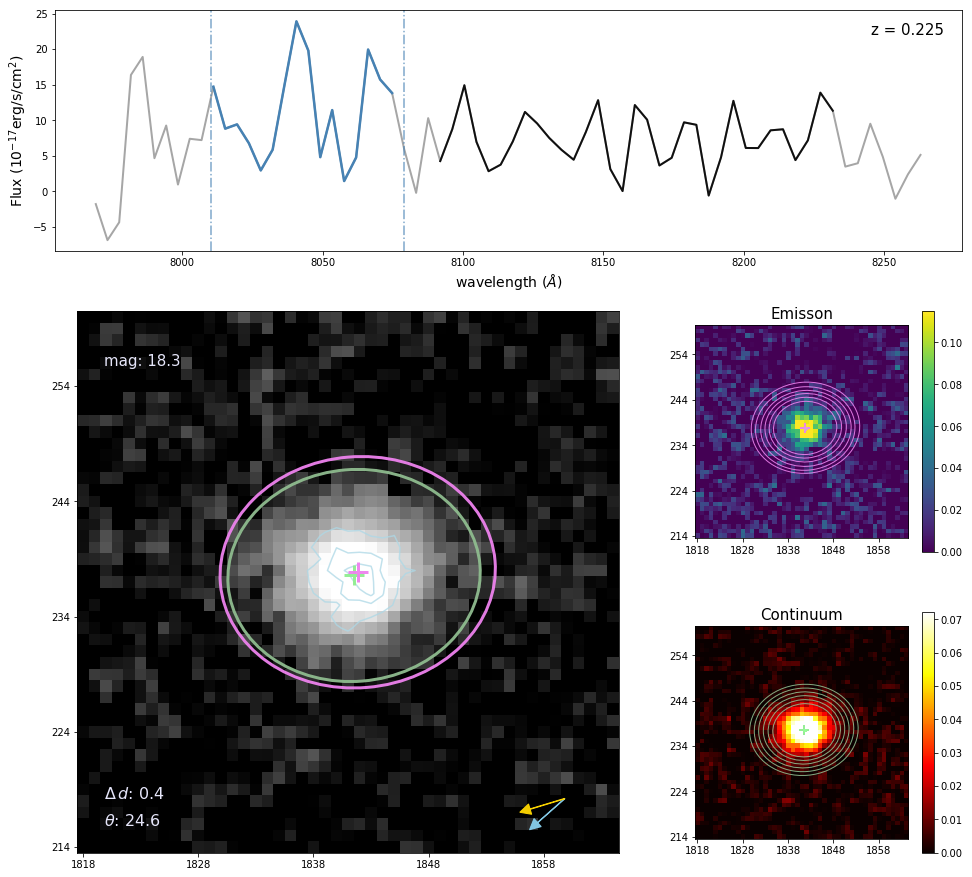

optimal aperture:2.0
Aper (min,max): (1.40,2.00)


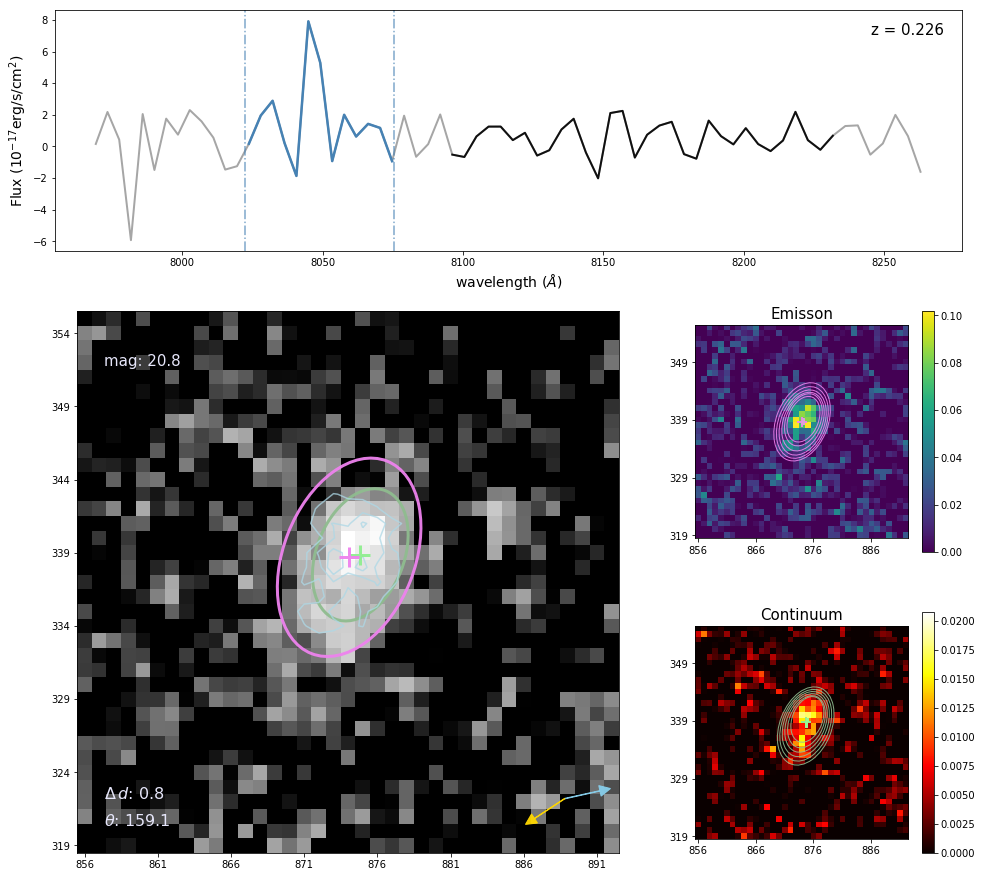

optimal aperture:2.5
Aper (min,max): (1.75,2.50)


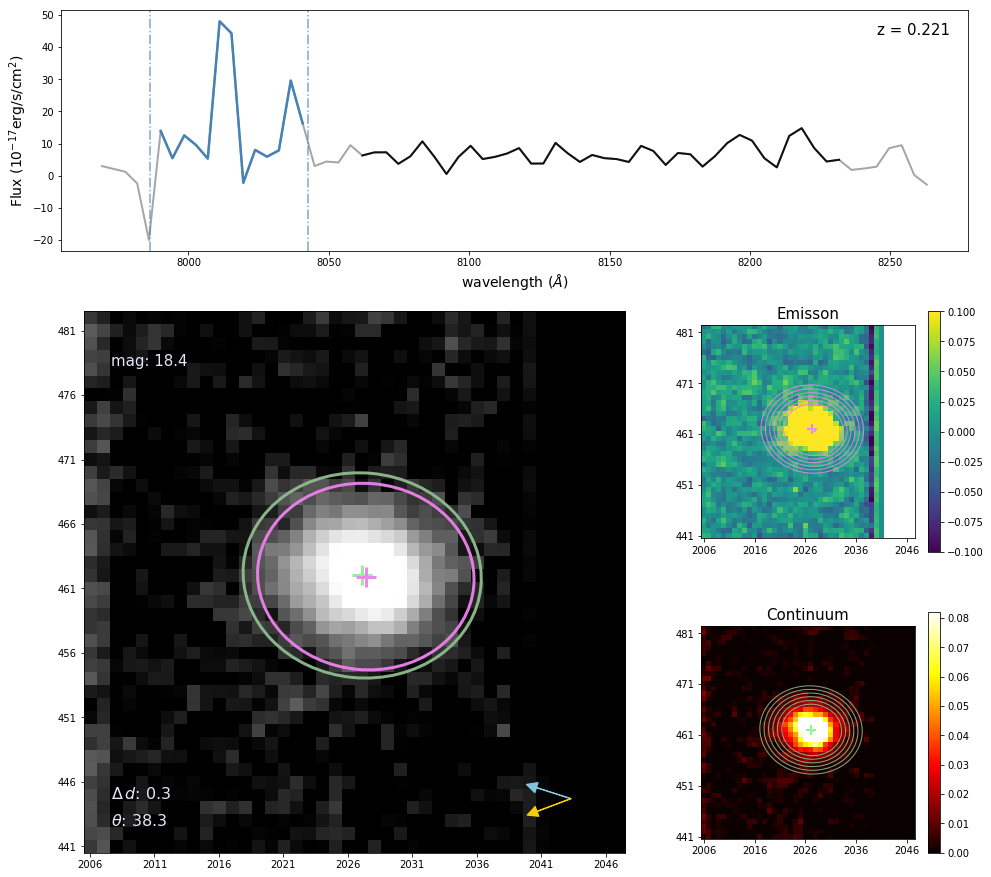

optimal aperture:2.2
Aper (min,max): (1.54,2.20)


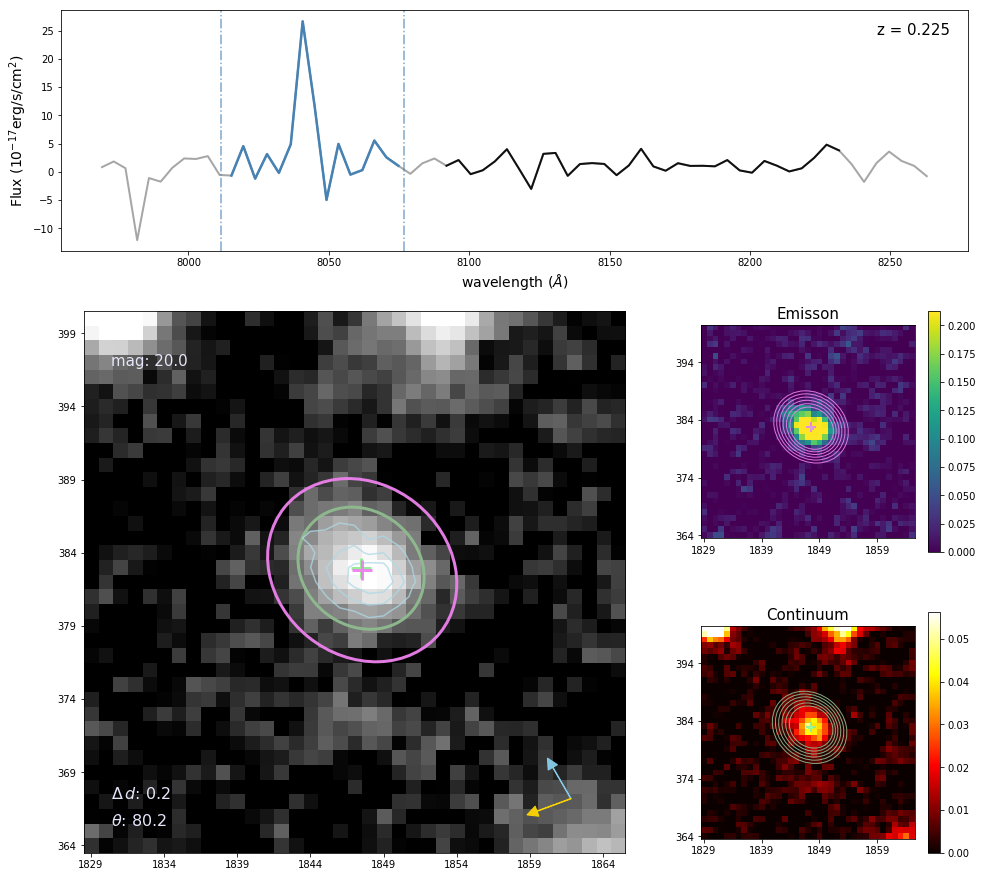

optimal aperture:2.1
Aper (min,max): (1.47,2.10)


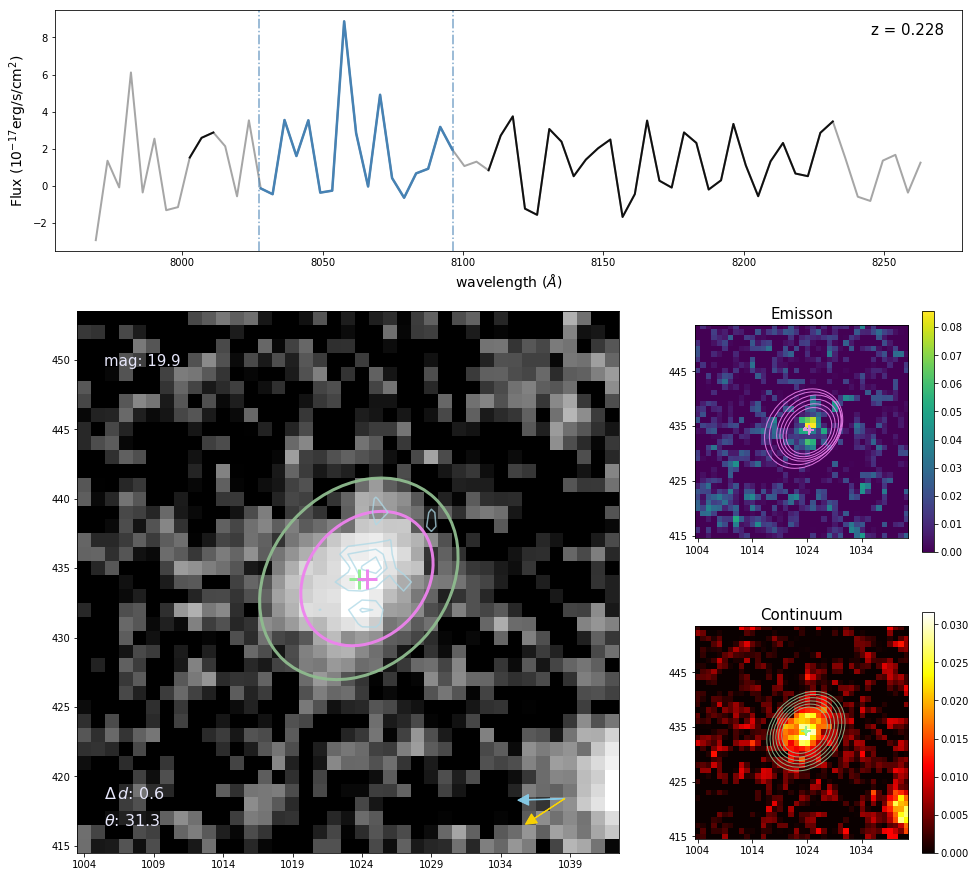

optimal aperture:2.2
Aper (min,max): (1.54,2.20)


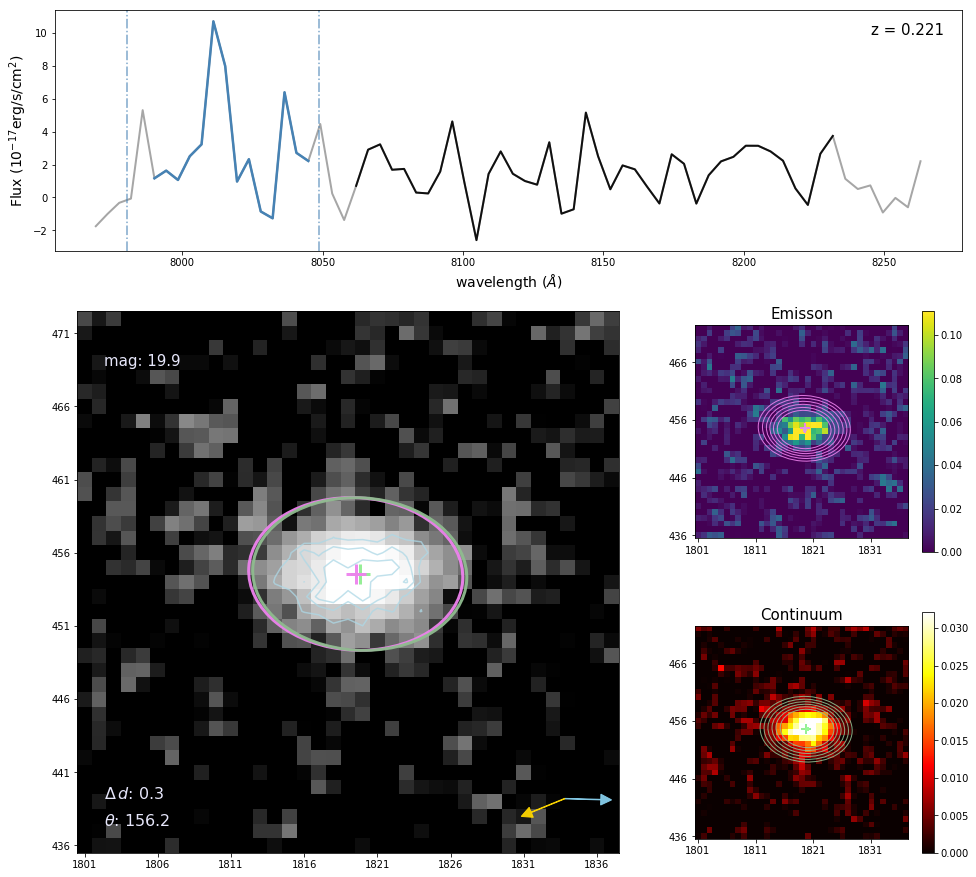

optimal aperture:2.1
Aper (min,max): (1.47,2.10)


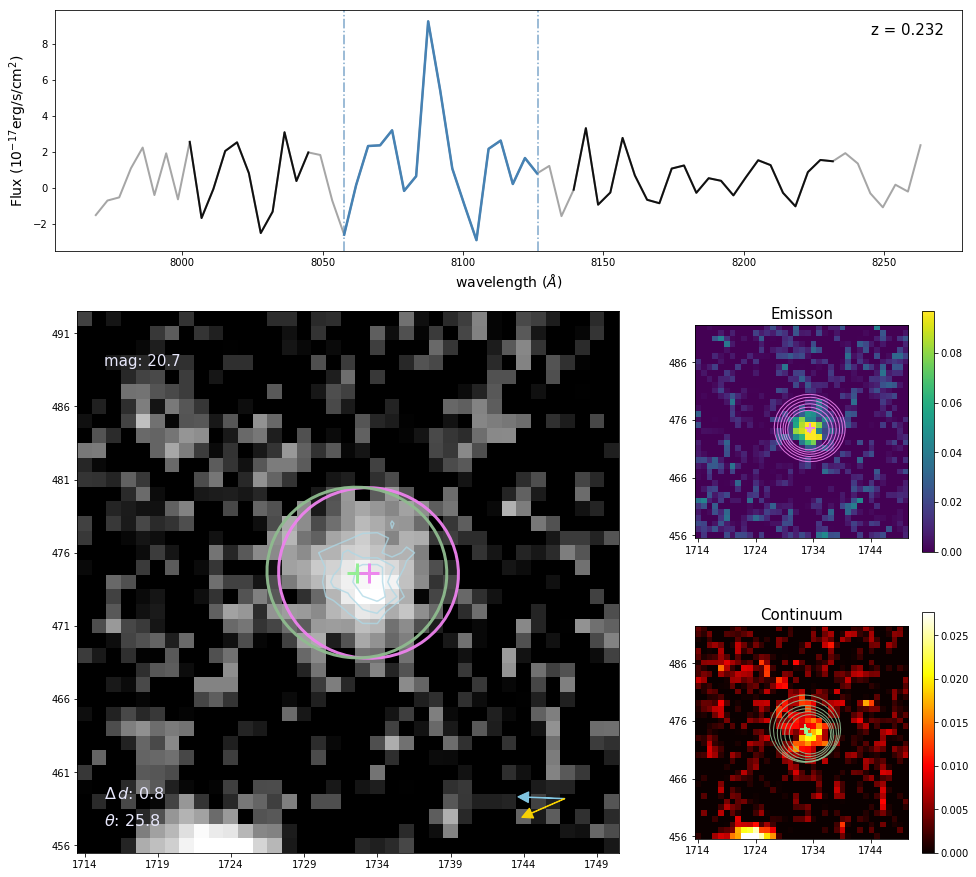

optimal aperture:2.0
Aper (min,max): (1.40,2.00)


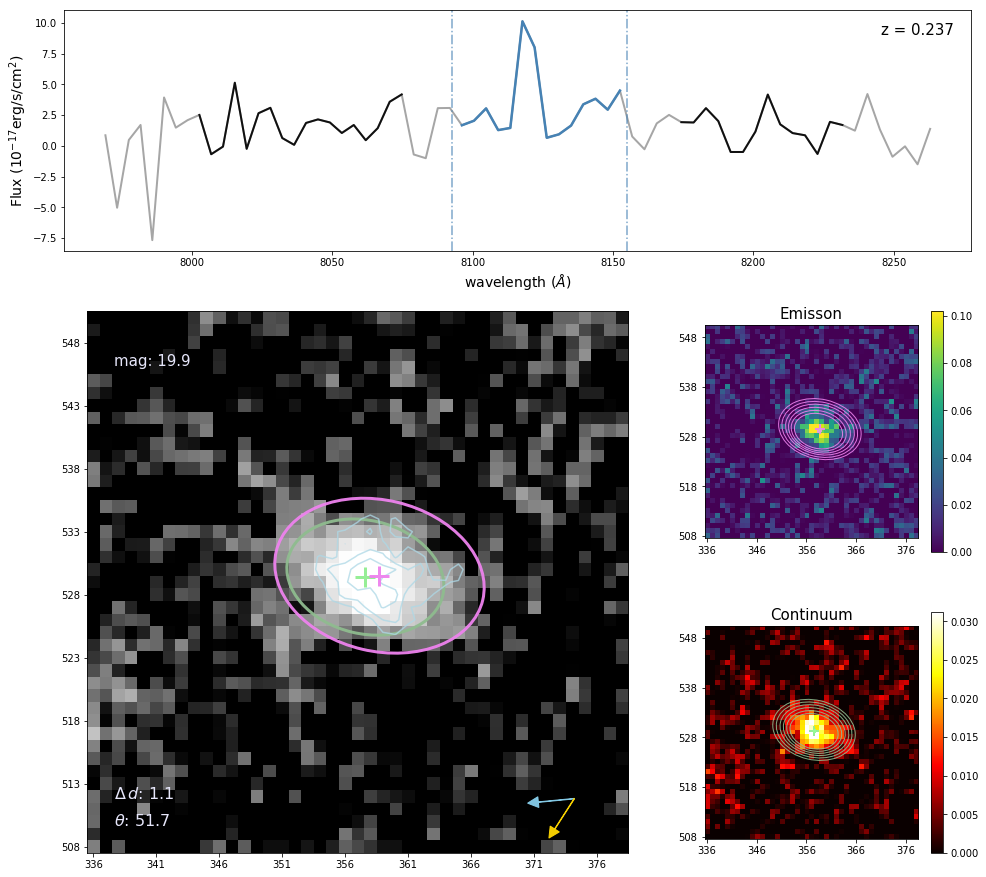

optimal aperture:2.2
Aper (min,max): (1.54,2.20)


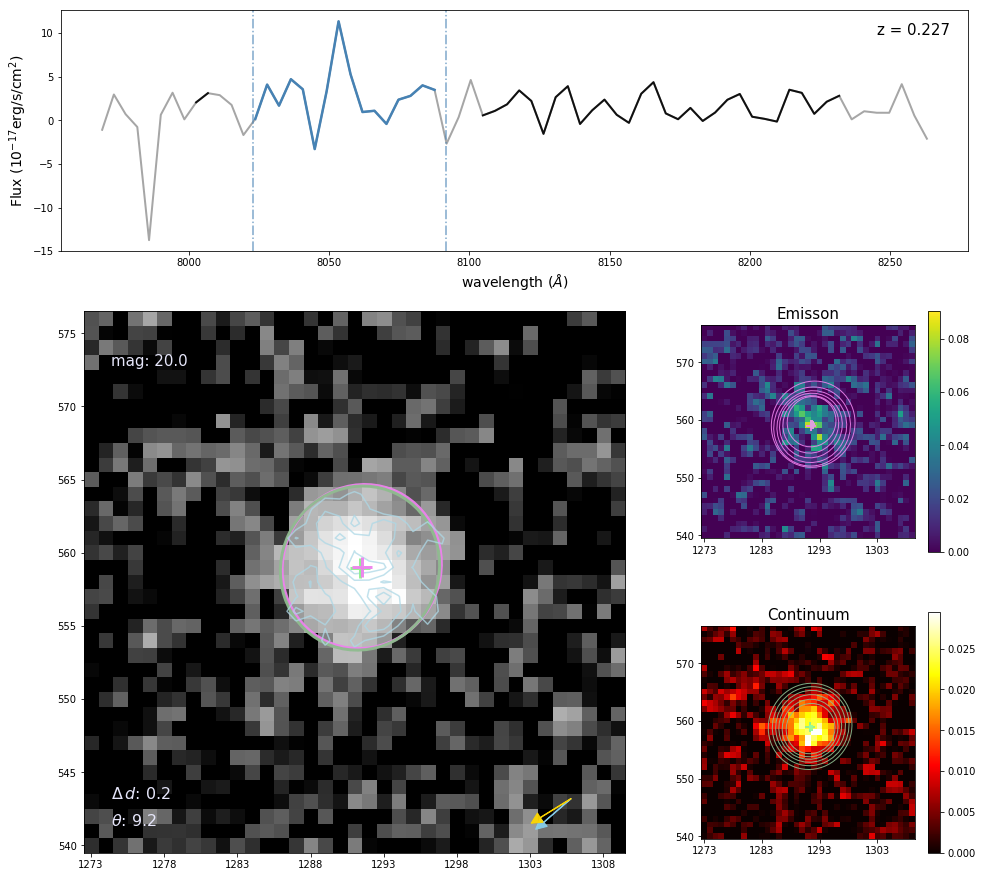

optimal aperture:1.1
Aper (min,max): (0.77,1.10)
Unable to compute centroid! Error raised.


<Figure size 432x288 with 0 Axes>

optimal aperture:2.6
Aper (min,max): (1.82,2.60)


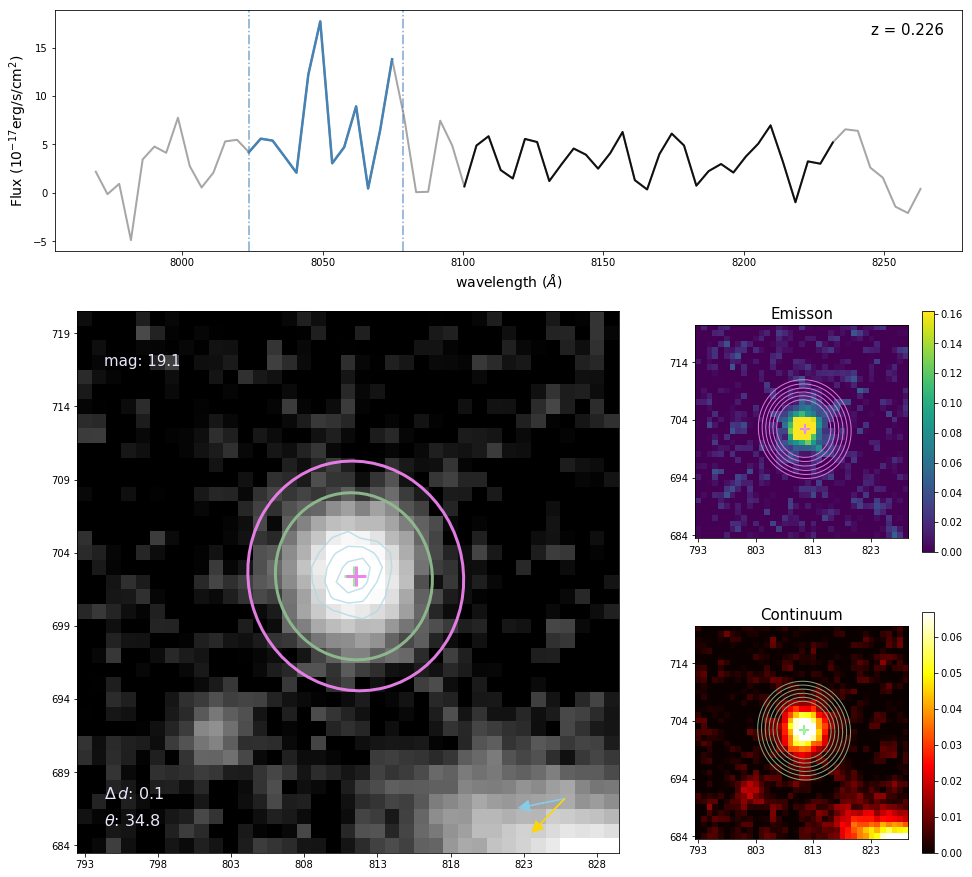

optimal aperture:2.3
Aper (min,max): (1.61,2.30)


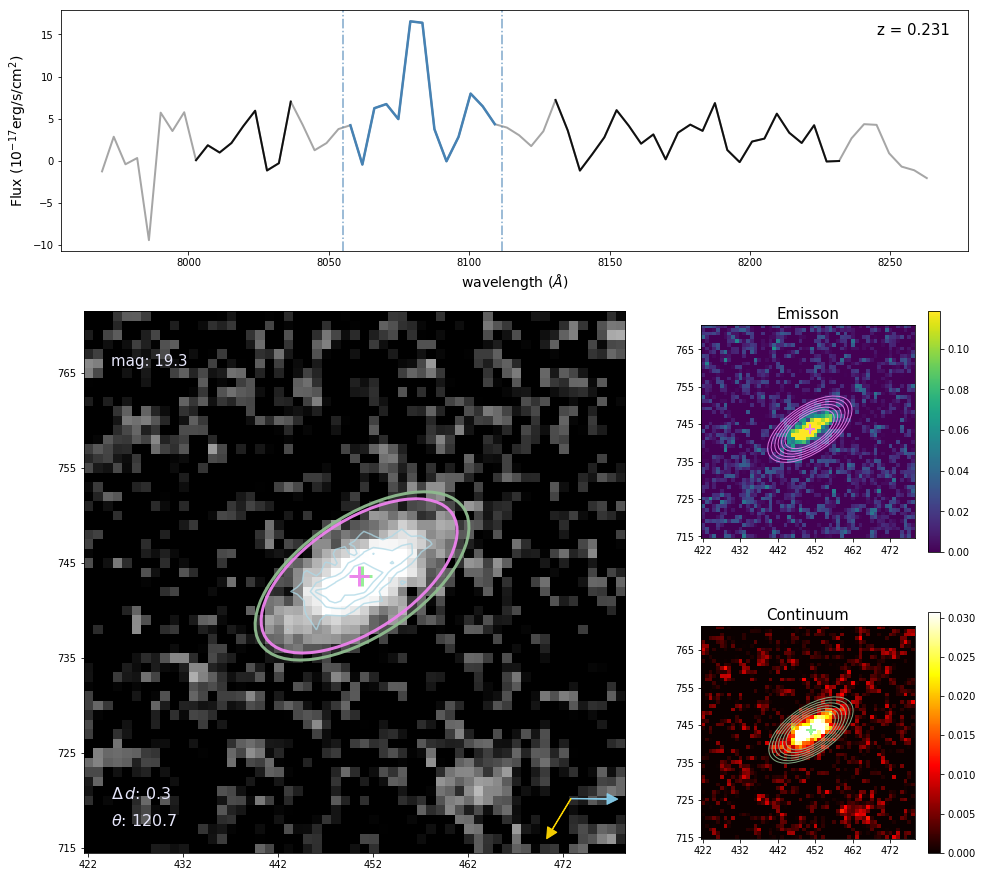

optimal aperture:2.2
Aper (min,max): (1.54,2.20)


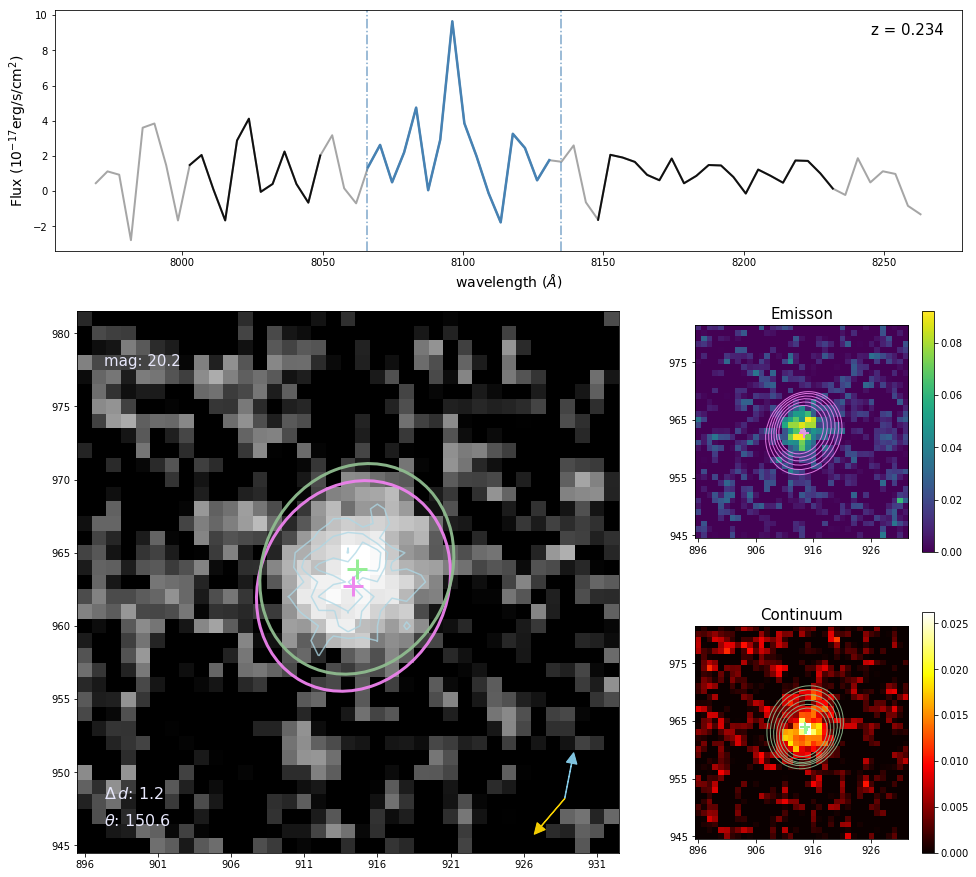

optimal aperture:2.3
Aper (min,max): (1.61,2.30)


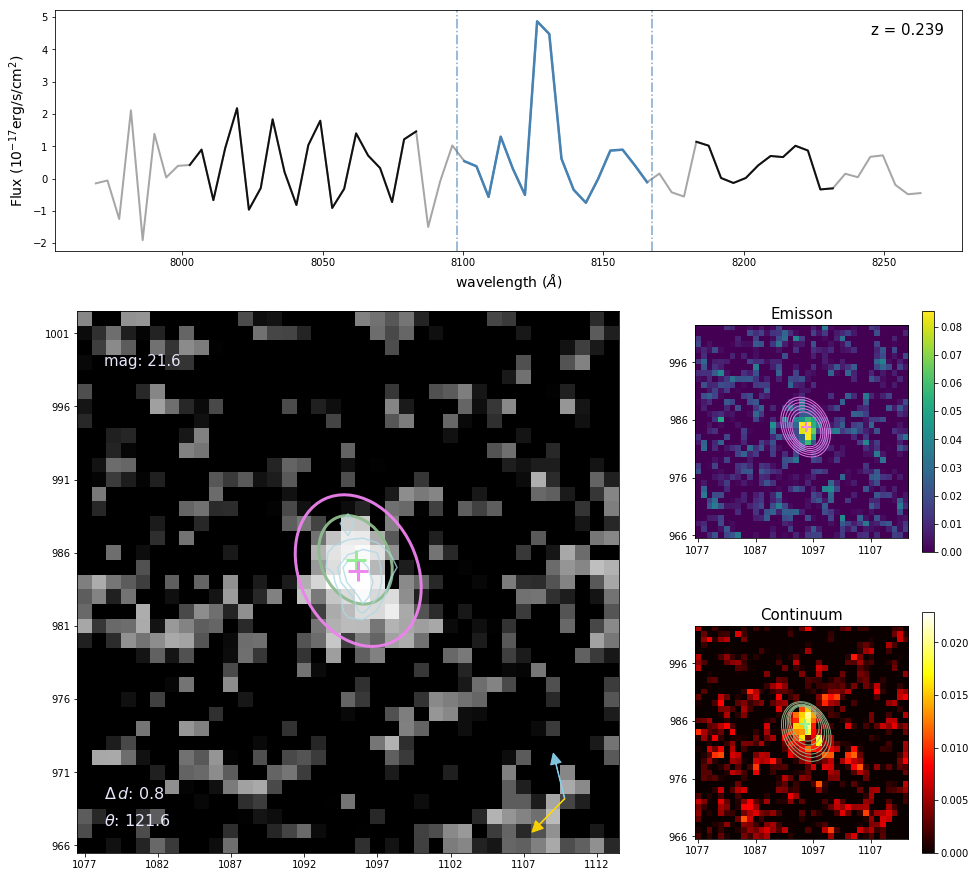

optimal aperture:2.2
Aper (min,max): (1.54,2.20)


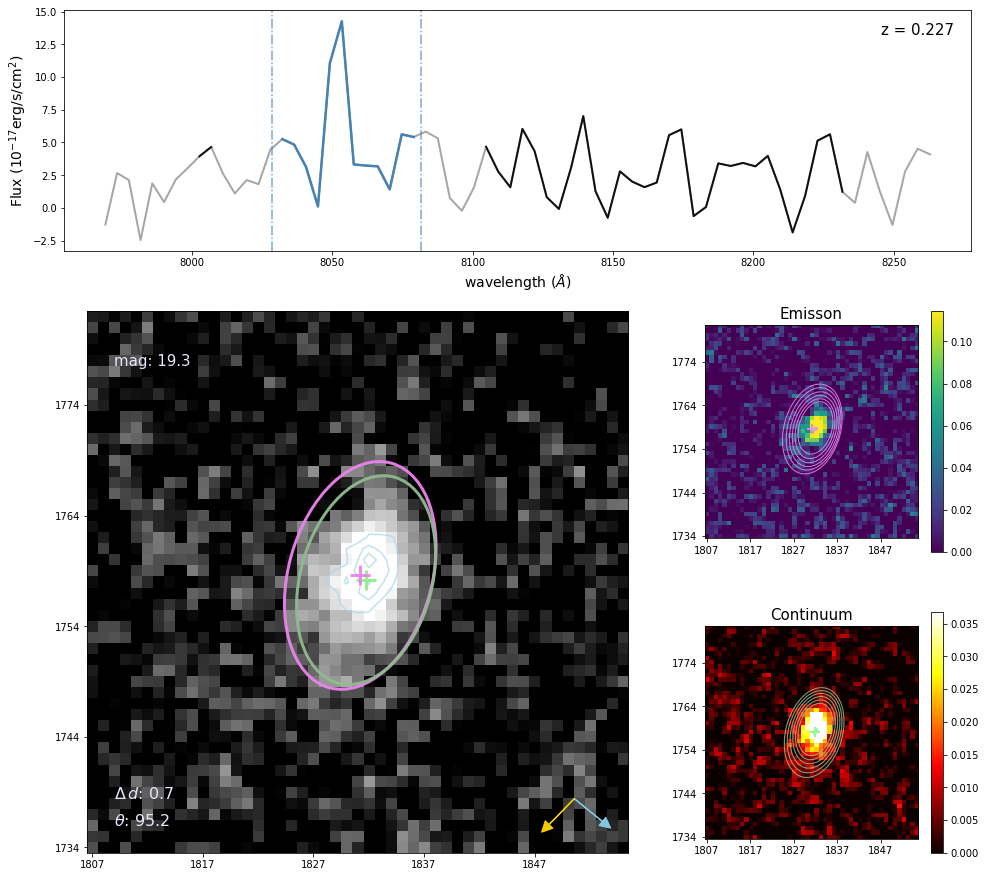

optimal aperture:2.0
Aper (min,max): (1.40,2.00)


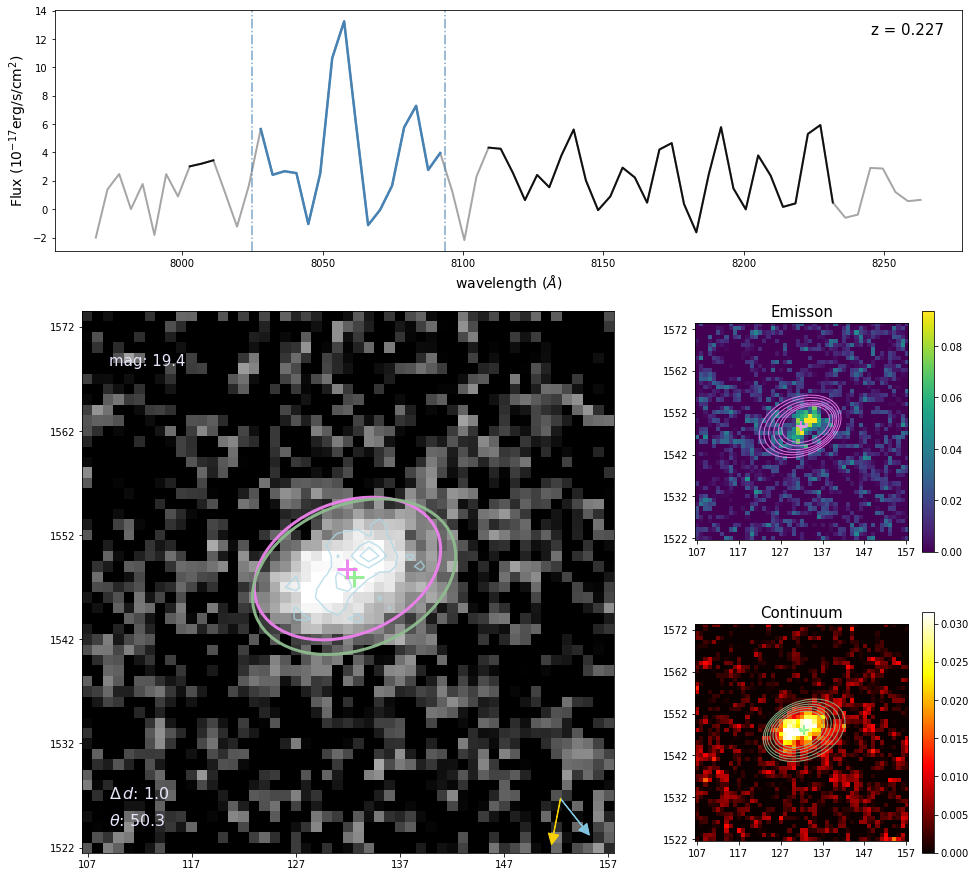

optimal aperture:2.0
Aper (min,max): (1.40,2.00)
Unable to compute centroid! Error raised.


<Figure size 432x288 with 0 Axes>

optimal aperture:2.7
Aper (min,max): (1.89,2.70)


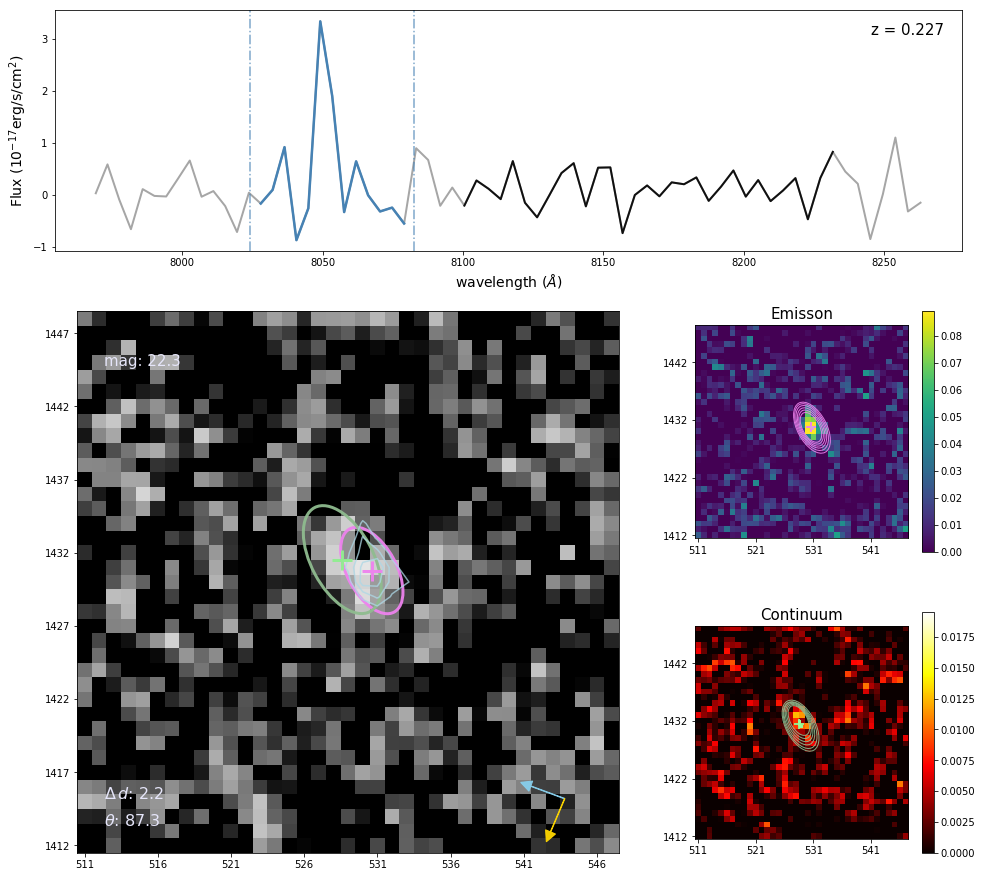

optimal aperture:2.0
Aper (min,max): (1.40,2.00)


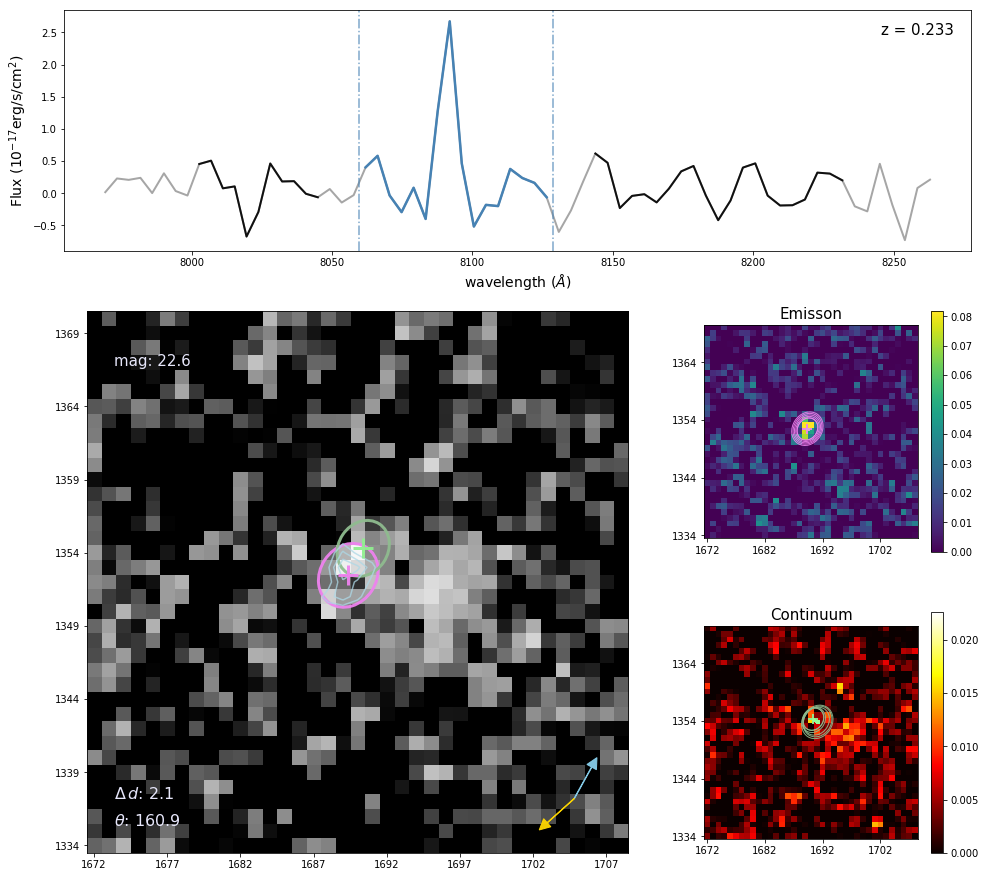

optimal aperture:2.6
Aper (min,max): (1.82,2.60)


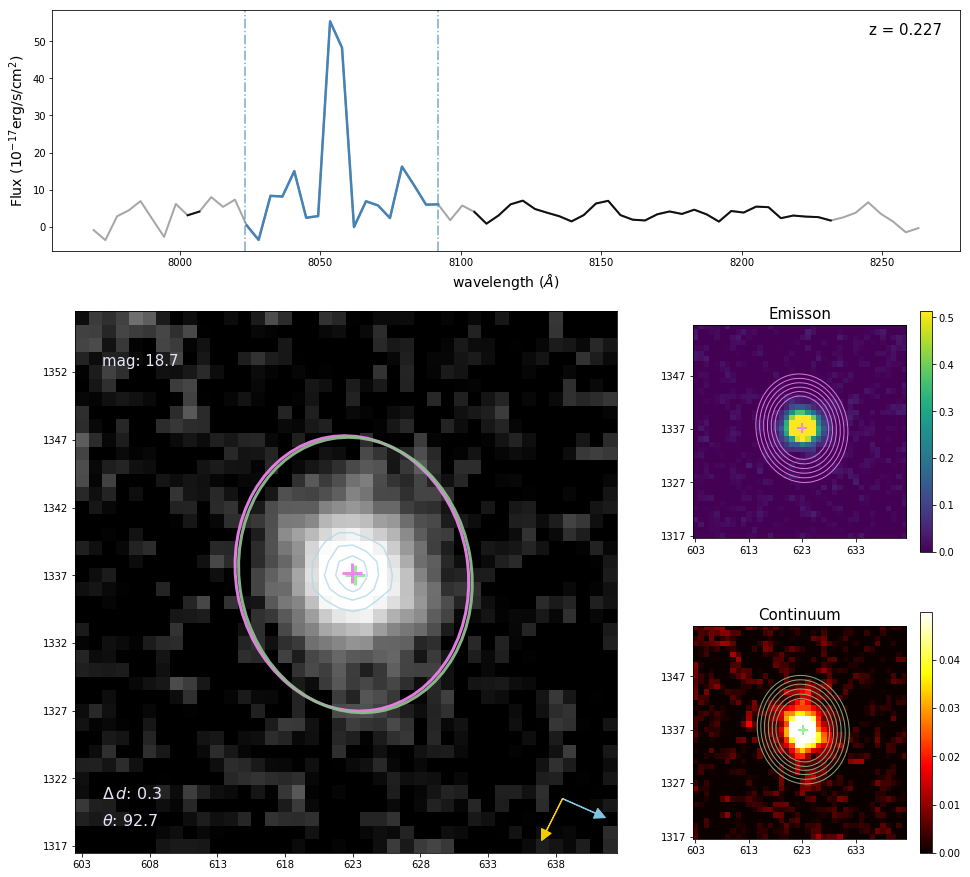

optimal aperture:2.0
Aper (min,max): (1.40,2.00)


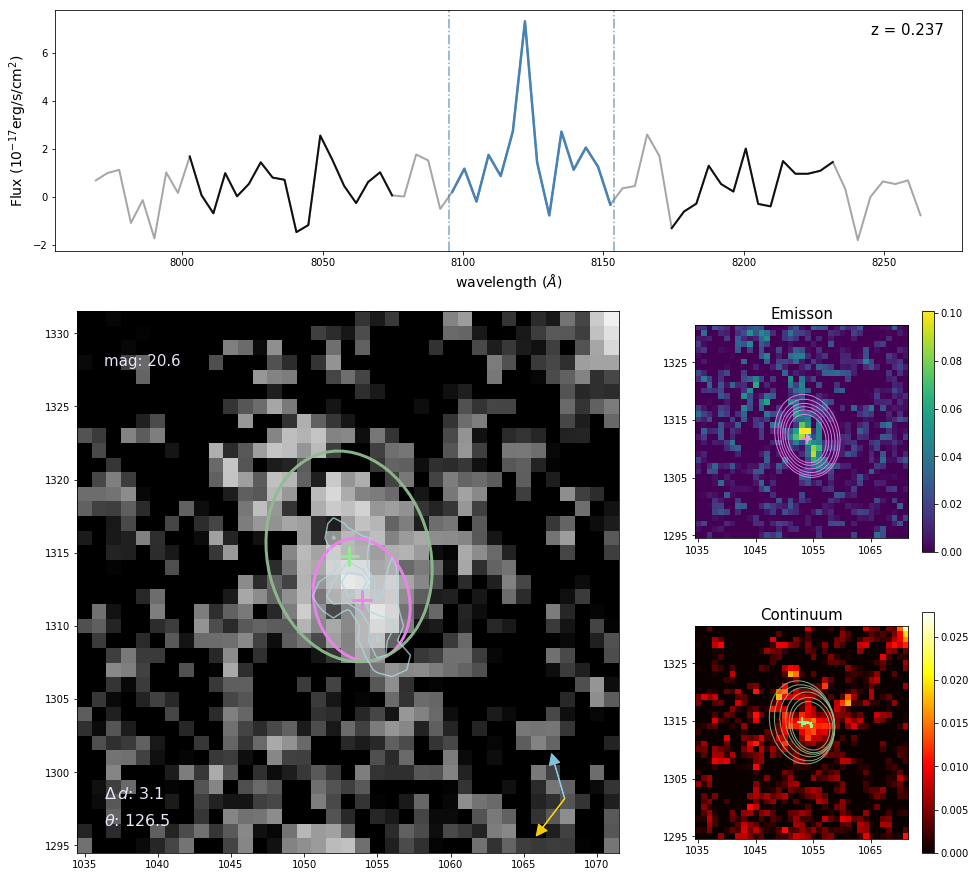

optimal aperture:2.0
Aper (min,max): (1.40,2.00)


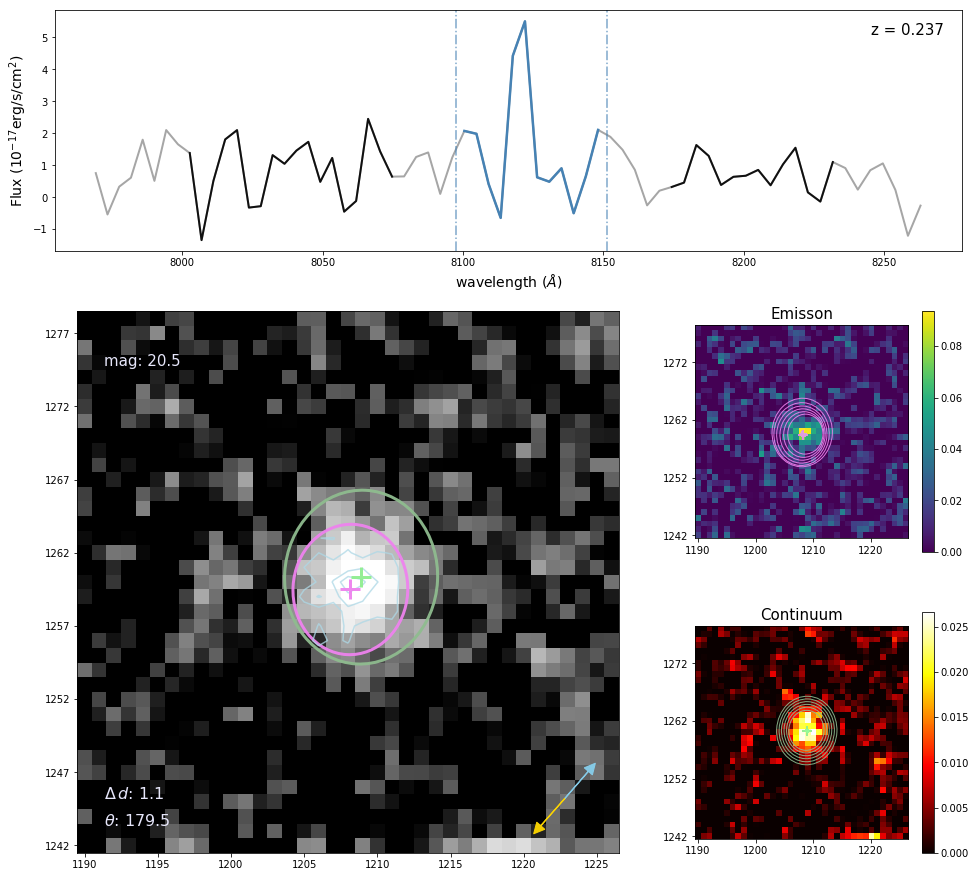

optimal aperture:1.9
Aper (min,max): (1.33,1.90)


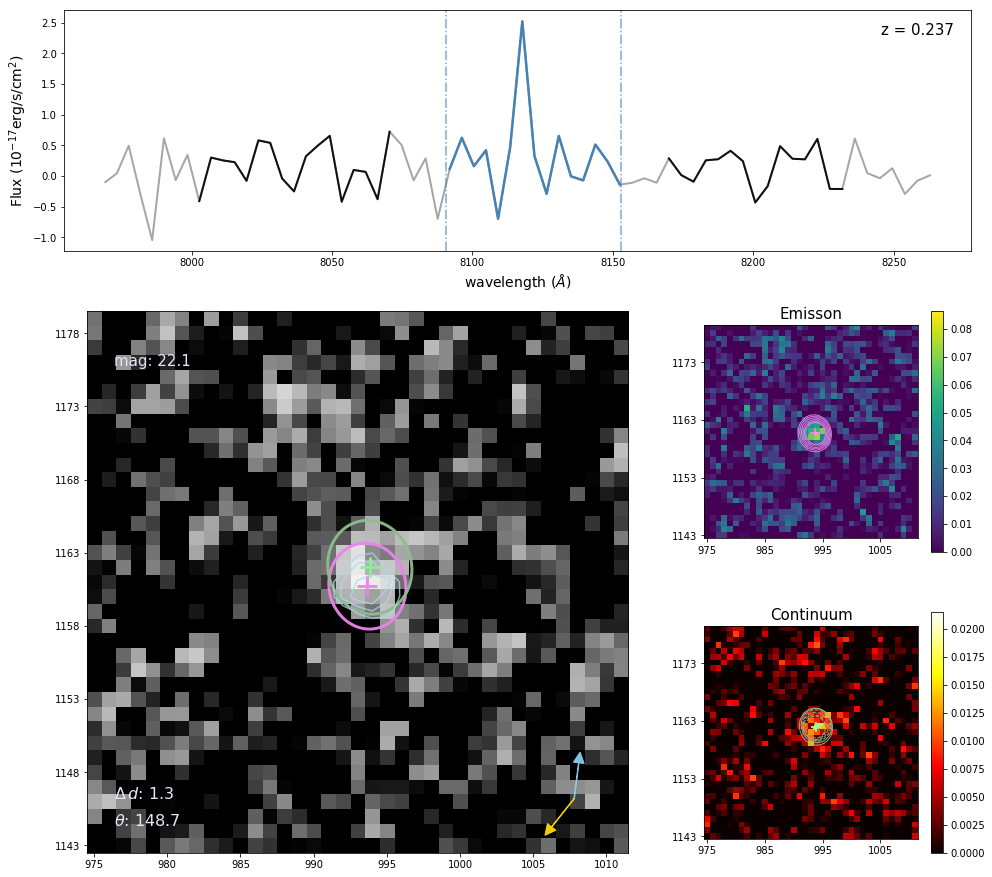

optimal aperture:2.3
Aper (min,max): (1.61,2.30)


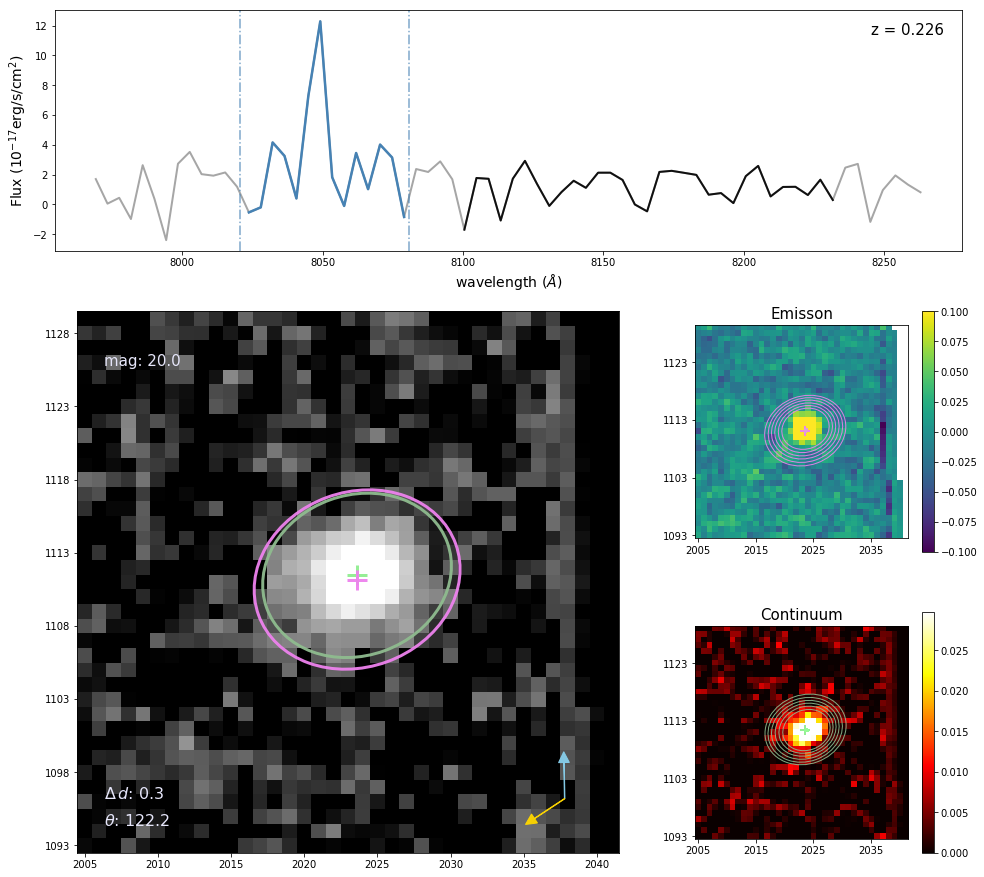

In [8]:
for num in Num_vp:
    Datacube.centroid_analysis(num=num, centroid_type='APER')
    plt.savefig("./A2390NW/fig/centroid_mean/#EL-%s"%num,dpi=100)
    plt.show()
    plt.close()

In [5]:
Datacube.centroid_analysis_all(Num_v, centroid_type='APER')

Current Model:  Ha-NII_gauss
#EL-1
optimal aperture:3.9
Aper (min,max): (3.90,3.90)
Unable to compute centroid! Error raised.
#EL-2
optimal aperture:3.9
Aper (min,max): (3.90,3.90)
Unable to compute centroid! Error raised.
#EL-3
optimal aperture:3.9
Aper (min,max): (3.90,3.90)
#EL-4
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-5
optimal aperture:3.9
Aper (min,max): (3.90,3.90)
#EL-6
optimal aperture:2.7
Aper (min,max): (2.70,2.70)
#EL-7
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-8
optimal aperture:2.3
Aper (min,max): (2.30,2.30)
#EL-9
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-10
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-11
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-12
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-13
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-14
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-15
optimal aperture:2.6
Aper (min,max): (2.60,2.60)
#EL-16
optimal aperture:2.3
Aper (min,max): (2.30,2.30)


#EL-145
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-146
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-147
optimal aperture:2.3
Aper (min,max): (2.30,2.30)
#EL-148
optimal aperture:2.5
Aper (min,max): (2.50,2.50)
#EL-149
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-150
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-151
optimal aperture:2.3
Aper (min,max): (2.30,2.30)
#EL-152
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-153
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-154
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-155
optimal aperture:3.2
Aper (min,max): (3.20,3.20)
#EL-156
optimal aperture:2.0
Aper (min,max): (1.40,2.00)
Angle: 32.366  Offset: 0.654
#EL-157
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-158
optimal aperture:2.3
Aper (min,max): (2.30,2.30)
#EL-159
optimal aperture:2.3
Aper (min,max): (2.30,2.30)
#EL-160
optimal aperture:2.5
Aper (min,max): (2.50,2.50)
#EL-161
optimal aperture:1.6
Aper (min,max): (1.60,1.60)
#E

#EL-301
optimal aperture:2.5
Aper (min,max): (1.75,2.50)
Angle: 31.937  Offset: 0.350
#EL-302
optimal aperture:2.8
Aper (min,max): (2.80,2.80)
#EL-303
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-304
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-305
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-306
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-307
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-308
optimal aperture:1.7
Aper (min,max): (1.70,1.70)
#EL-309
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-310
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-311
optimal aperture:3.4
Aper (min,max): (3.40,3.40)
#EL-312
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-313
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-314
optimal aperture:3.9
Aper (min,max): (3.90,3.90)
#EL-315
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-316
optimal aperture:1.7
Aper (min,max): (1.70,1.70)
#EL-317
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#E

Angle: 54.659  Offset: 1.498
#EL-443
optimal aperture:2.3
Aper (min,max): (2.30,2.30)
#EL-444
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-445
optimal aperture:3.9
Aper (min,max): (3.90,3.90)
#EL-446
optimal aperture:1.8
Aper (min,max): (1.80,1.80)
#EL-447
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-448
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-449
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-450
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-451
optimal aperture:2.5
Aper (min,max): (2.50,2.50)
#EL-452
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-453
optimal aperture:2.8
Aper (min,max): (2.80,2.80)
#EL-454
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-455
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-456
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-457
optimal aperture:2.2
Aper (min,max): (1.54,2.20)
Angle: 75.392  Offset: 0.483
#EL-458
optimal aperture:3.1
Aper (min,max): (3.10,3.10)
#EL-459
optimal aperture:1.9
A

optimal aperture:2.3
Aper (min,max): (2.30,2.30)
#EL-600
optimal aperture:1.8
Aper (min,max): (1.80,1.80)
#EL-601
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-602
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-603
optimal aperture:1.8
Aper (min,max): (1.80,1.80)
#EL-604
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-605
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-606
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-607
optimal aperture:3.9
Aper (min,max): (3.90,3.90)
#EL-608
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-609
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-610
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-611
optimal aperture:2.3
Aper (min,max): (2.30,2.30)
#EL-612
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-613
optimal aperture:1.6
Aper (min,max): (1.60,1.60)
#EL-614
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-615
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-616
optimal aperture:2.5
Aper (min,

optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-745
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-746
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-747
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-748
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-749
optimal aperture:3.2
Aper (min,max): (3.20,3.20)
#EL-750
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-751
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-752
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-753
optimal aperture:2.8
Aper (min,max): (2.80,2.80)
#EL-754
optimal aperture:2.3
Aper (min,max): (2.30,2.30)
#EL-755
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-756
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-757
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-758
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-759
optimal aperture:2.6
Aper (min,max): (2.60,2.60)
#EL-760
optimal aperture:2.3
Aper (min,max): (2.30,2.30)
#EL-761
optimal aperture:2.1
Aper (min,

optimal aperture:2.5
Aper (min,max): (2.50,2.50)
#EL-896
optimal aperture:2.3
Aper (min,max): (2.30,2.30)
#EL-897
optimal aperture:1.8
Aper (min,max): (1.80,1.80)
#EL-898
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-899
optimal aperture:1.6
Aper (min,max): (1.60,1.60)
#EL-900
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-901
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-902
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-903
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-904
optimal aperture:2.5
Aper (min,max): (2.50,2.50)
#EL-905
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-906
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-907
optimal aperture:2.6
Aper (min,max): (2.60,2.60)
#EL-908
optimal aperture:2.9
Aper (min,max): (2.90,2.90)
#EL-909
optimal aperture:3.9
Aper (min,max): (3.90,3.90)
#EL-910
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-911
optimal aperture:2.8
Aper (min,max): (2.80,2.80)
#EL-912
optimal aperture:2.7
Aper (min,

#EL-1053
optimal aperture:3.3
Aper (min,max): (3.30,3.30)
#EL-1054
optimal aperture:3.1
Aper (min,max): (3.10,3.10)
#EL-1055
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-1056
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-1057
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-1058
optimal aperture:2.3
Aper (min,max): (2.30,2.30)
#EL-1059
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-1060
optimal aperture:1.7
Aper (min,max): (1.70,1.70)
#EL-1061
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-1062
optimal aperture:2.0
Aper (min,max): (1.40,2.00)
Angle: 43.485  Offset: 0.711
#EL-1063
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-1064
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-1065
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-1066
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-1067
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-1068
optimal aperture:1.2
Aper (min,max): (1.20,1.20)
#EL-1069
optimal aperture:2.4
Aper (min,max

#EL-1202
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-1203
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-1204
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-1205
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-1206
optimal aperture:3.9
Aper (min,max): (3.90,3.90)
#EL-1207
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-1208
optimal aperture:3.2
Aper (min,max): (3.20,3.20)
#EL-1209
optimal aperture:3.9
Aper (min,max): (3.90,3.90)
#EL-1210
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-1211
optimal aperture:2.8
Aper (min,max): (2.80,2.80)
#EL-1212
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-1213
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-1214
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-1215
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-1216
optimal aperture:3.7
Aper (min,max): (3.70,3.70)
#EL-1217
optimal aperture:3.9
Aper (min,max): (3.90,3.90)
#EL-1218
optimal aperture:1.7
Aper (min,max): (1.70,1.70)
#EL-1219
optim

Angle: 154.365  Offset: 0.939
#EL-1342
optimal aperture:2.8
Aper (min,max): (2.80,2.80)
#EL-1343
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-1344
optimal aperture:2.3
Aper (min,max): (2.30,2.30)
#EL-1345
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-1346
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-1347
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-1348
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-1349
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-1350
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-1351
optimal aperture:3.3
Aper (min,max): (3.30,3.30)
#EL-1352
optimal aperture:2.4
Aper (min,max): (2.40,2.40)
#EL-1353
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-1354
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-1355
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-1356
optimal aperture:2.7
Aper (min,max): (2.70,2.70)
#EL-1357
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-1358
optimal aperture:2.0
Aper (min,ma

#EL-1490
optimal aperture:1.9
Aper (min,max): (1.90,1.90)
#EL-1491
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-1492
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-1493
optimal aperture:2.7
Aper (min,max): (2.70,2.70)
#EL-1494
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-1495
optimal aperture:2.0
Aper (min,max): (2.00,2.00)
#EL-1496
optimal aperture:1.5
Aper (min,max): (1.50,1.50)
#EL-1497
optimal aperture:1.8
Aper (min,max): (1.80,1.80)
#EL-1498
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-1499
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-1500
optimal aperture:2.1
Aper (min,max): (2.10,2.10)
#EL-1501
optimal aperture:1.8
Aper (min,max): (1.80,1.80)
#EL-1502
optimal aperture:2.2
Aper (min,max): (2.20,2.20)
#EL-1503
optimal aperture:2.3
Aper (min,max): (2.30,2.30)
#EL-1504
optimal aperture:3.5
Aper (min,max): (3.50,3.50)
#EL-1505
optimal aperture:2.7
Aper (min,max): (2.70,2.70)
#EL-1506
optimal aperture:2.3
Aper (min,max): (1.61,2.30)
Angle: 104.676

(18.717805458276917, 22.151036643036054)
Isophotal area threshold:  10.0
Distance to field edge threshold:  50
Control Sample : n=841


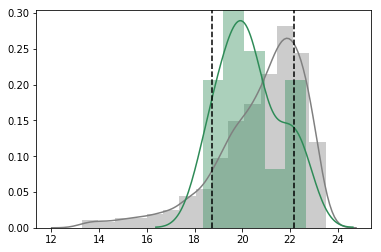

In [6]:
import seaborn as sns
import pandas as pd
import warnings
warnings.filterwarnings('ignore')

mag0 = 25.2
mag_all = -2.5*np.log10(Datacube.Tab_SE["FLUX_AUTO"]) + mag0
ind_notv = np.setdiff1d(Datacube.Tab_SE["NUMBER"]-1, ind_v)
mag_ctrl = pd.Series(mag_all[ind_notv]).dropna()

sns.distplot(mag_ctrl,label="Control",color="gray",bins=15)
mag_el = pd.Series(mag_all[ind_v])
mag_cut = (np.percentile(mag_el, 10), np.percentile(mag_el, 90))
print (mag_cut)
sns.distplot(mag_el,label="Candidate",color="seagreen")
plt.axvline(mag_cut[0],color='k',ls='--')
plt.axvline(mag_cut[1],color='k',ls='--')

Datacube.construct_control(Num_v=Num_v, mag_cut=(mag_cut[0],mag_cut[1]), dist_cut=50, bootstraped=False)

In [7]:
ind_v = Num_vp-1
Datacube.diff_angles_v = Datacube.diff_angles[ind_v]
Datacube.diff_centroids_v = Datacube.diff_centroids[ind_v]
Datacube.dist_clus_cens_v = Datacube.dist_clus_cens[ind_v]
Datacube.max_devs_v = Datacube.max_devs[ind_v]
import warnings
warnings.filterwarnings('ignore')

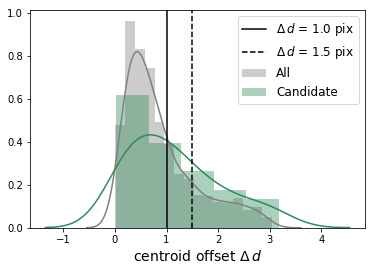

In [10]:
#APER p (2 aper)
draw_centroid_offset(Datacube.diff_centroids_v[Datacube.diff_centroids_v>0], 
                     Datacube.diff_centroids_c[Datacube.diff_centroids_c>0], crit=[1.,1.5])

# of offset > 50% : 21
# of offset > 100% : 13


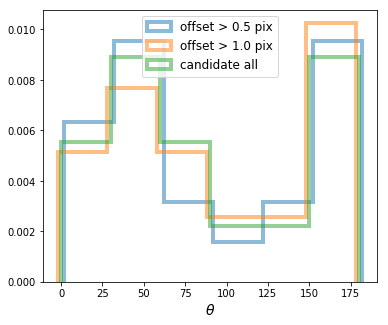

In [38]:
#APER p (2 aper)
plt.figure(figsize=(6,5))
cond = (Datacube.diff_centroids_v<10) & (mag_all[ind_v]<22.5) & (mag_all[ind_v]>18.5)
draw_angle_candidate(Datacube.diff_angles_v[cond], Datacube.diff_centroids_v[cond], 
                     Datacube.diff_centroids_c, crit=[0.5, 1.], b=7)

(19.084031096644722, 22.037783744511923)
# of offset > 50 pix :19
# of offset > 100 pix :10


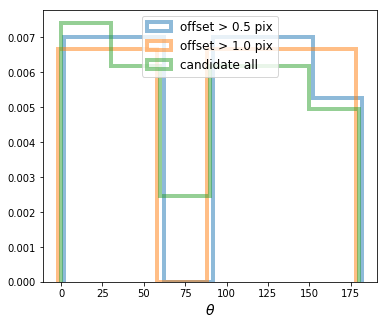

In [15]:
#APER p (2m aper) mean
plt.figure(figsize=(6,5))
print(mag_cut)
cond = (Datacube.diff_centroids_v<5) & (mag_all[ind_v]<22.5) & (mag_all[ind_v]>18.5)
draw_angle_candidate(Datacube.diff_angles_v[cond], Datacube.diff_centroids_v[cond], 
                     Datacube.diff_centroids_c, crit=[0.5, 1.], b=7)

# of offset > 50 pix :15
# of offset > 100 pix :8


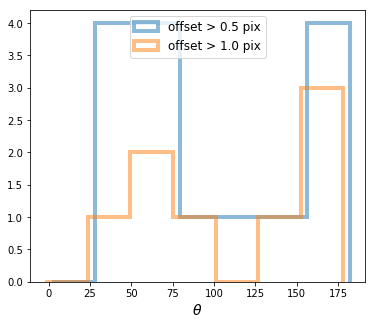

In [9]:
#APER p (2m aper med weight)
plt.figure(figsize=(6,5))
cond = (Datacube.diff_centroids_v<5) & (mag_all[ind_v]<22.5) & (mag_all[ind_v]>18.5) #& (Datacube.max_devs_v<2)
draw_angle_candidate(Datacube.diff_angles_v[cond], Datacube.diff_centroids_v[cond], 
                     Datacube.diff_centroids_c, crit=[0.5, 1.], b=8)

# of offset > 50 pix :17
# of offset > 100 pix :10


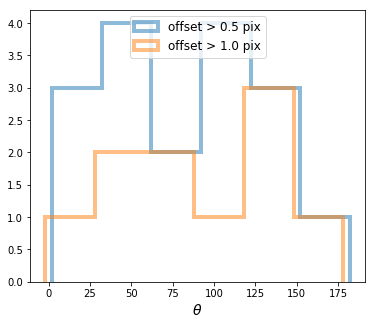

In [7]:
#APER p (2m aper med mean)
plt.figure(figsize=(6,5))
cond = (Datacube.diff_centroids_v<5) & (mag_all[ind_v]<22.5) & (mag_all[ind_v]>18.5) #& (Datacube.max_devs_v<2)
draw_angle_candidate(Datacube.diff_angles_v[cond], Datacube.diff_centroids_v[cond], 
                     Datacube.diff_centroids_c, crit=[0.5, 1.], b=7)

# of offset > 50% : 16
# of offset > 100% : 8


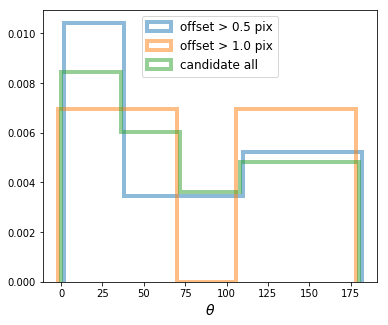

In [7]:
#APER p (2 aper) weight
plt.figure(figsize=(6,5))
cond = (Datacube.diff_centroids_v<10) & (mag_all[ind_v]<mag_cut[1]) & (mag_all[ind_v]>mag_cut[0])
draw_angle_candidate(Datacube.diff_angles_v[cond], Datacube.diff_centroids_v[cond], 
                     Datacube.diff_centroids_c, crit=[0.5, 1.], b=6)

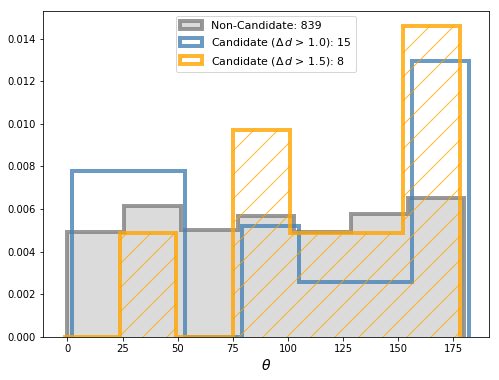

In [26]:
#APER p (2 aper)
plt.figure(figsize=(8,6))
draw_angle_compare(Datacube.diff_angles_v, Datacube.diff_centroids_v, 
                   Datacube.diff_angles_c, Datacube.diff_centroids_c, crit=[1.,1.5], b=8)
plt.savefig("/home/qliu/Pictures/20190312/A2390NW.pdf",dpi=100)

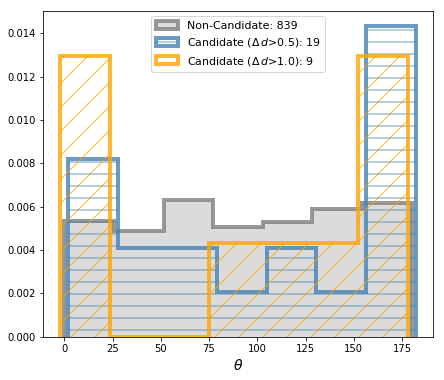

In [9]:
plt.figure(figsize=(7,6))
draw_angle_compare(Datacube.diff_angles_v, Datacube.diff_centroids_v, 
                   Datacube.diff_angles_c, Datacube.diff_centroids_c, crit=[0.5,1.], b=8)

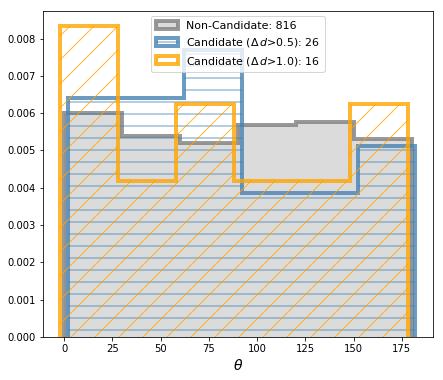

In [18]:
plt.figure(figsize=(7,6))
draw_angle_compare(Datacube.diff_angles_v, Datacube.diff_centroids_v, 
                   Datacube.diff_angles_c, Datacube.diff_centroids_c, crit=[0.5,1.], b=7)

In [29]:
from scipy.stats import kstest,ks_2samp,norm, anderson_ksamp
#ISO p (new CC)
p = np.percentile(Datacube.diff_centroids_c,50)
q = np.percentile(Datacube.diff_centroids_c,75)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c[Datacube.diff_centroids_c>p]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c[Datacube.diff_centroids_c>q]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c).pvalue)

print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>p],Datacube.diff_angles_c[Datacube.diff_centroids_c>p]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c[Datacube.diff_centroids_c>q]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>p],Datacube.diff_angles_c]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c]))

K-S: p-value=0.488
K-S: p-value=0.962
K-S: p-value=0.355
K-S: p-value=0.982
Anderson_ksampResult(statistic=-0.3775645809146094, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.5174644536531582)
Anderson_ksampResult(statistic=-0.9282435188153914, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.9344609510844271)
Anderson_ksampResult(statistic=-0.18877388380191834, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.42404864737130005)
Anderson_ksampResult(statistic=-0.9594839048985904, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.9667685976721193)


In [32]:
from scipy.stats import kstest,ks_2samp,norm, anderson_ksamp
#APER iter p (new CC)
p = np.percentile(Datacube.diff_centroids_c,50)
q = np.percentile(Datacube.diff_centroids_c,75)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c[Datacube.diff_centroids_c>p]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c[Datacube.diff_centroids_c>q]).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>p], Datacube.diff_angles_c).pvalue)
print("K-S: p-value=%.3f"%ks_2samp(Datacube.diff_angles_v[Datacube.diff_centroids_v>q], Datacube.diff_angles_c).pvalue)

print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>p],Datacube.diff_angles_c[Datacube.diff_centroids_c>p]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c[Datacube.diff_centroids_c>q]]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>p],Datacube.diff_angles_c]))
print(anderson_ksamp([Datacube.diff_angles_v[Datacube.diff_centroids_v>q],Datacube.diff_angles_c]))

K-S: p-value=0.302
K-S: p-value=0.323
K-S: p-value=0.339
K-S: p-value=0.392
Anderson_ksampResult(statistic=0.1757523251475053, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.29018902152348347)
Anderson_ksampResult(statistic=0.07679010075113596, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.32145096741163137)
Anderson_ksampResult(statistic=-0.027099317860072594, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.35809009278575354)
Anderson_ksampResult(statistic=-0.20605086984878937, critical_values=array([0.325, 1.226, 1.961, 2.718, 3.752]), significance_level=0.4318131559920441)


In [21]:
for num in Datacube.obj_nums:
    ind = (Datacube.obj_nums==num)

    if num in Num_v:  # For emission galaxies, pick a window 70A aorund emission
        z_best = Datacube.z_best[ind]
        spec = Datacube.obj_specs_opt[ind][0]
        lstd = Datacube.line_stddev_best[ind]
        EW_Ha = measure_EW(spec, Datacube.wavl, z=z_best, line_stddev = lstd)
    else:  
        EW_Ha = np.nan

    Datacube.EW_Ha = np.append(Datacube.EW_Ha, EW_Ha) if num>1 else [EW_Ha]

In [10]:
import pandas as pd
coords = w.pixel_to_world(Datacube.Tab_SE["X_IMAGE"], Datacube.Tab_SE["Y_IMAGE"])
ind_v = Num_v-1
Datacube.diff_angles_v = Datacube.diff_angles[ind_v]
Datacube.diff_centroids_v = Datacube.diff_centroids[ind_v]
Datacube.dist_clus_cens_v = Datacube.dist_clus_cens[ind_v]
Datacube.PAs_v = Datacube.PAs[ind_v]
Datacube.clus_cen_angles_v = Datacube.clus_cen_angles[ind_v]

ind_c = Datacube.Num_c-1

inds_best_Ha = np.argmax(Datacube.CC_Rs_Temps['Ha-NII_gauss'], axis=1)
SNR_best_Ha = np.array([Datacube.CC_SNRs_Temps['Ha-NII_gauss'][i,j] for i,j in enumerate(inds_best_Ha)])
R_best_Ha = np.array([Datacube.CC_Rs_Temps['Ha-NII_gauss'][i,j] for i,j in enumerate(inds_best_Ha)])
inds_best_Hb = np.argmax(Datacube.CC_Rs_Temps['Hb-OIII_gauss'], axis=1)
SNR_best_Hb = np.array([Datacube.CC_SNRs_Temps['Hb-OIII_gauss'][i,j] for i,j in enumerate(inds_best_Hb)])
inds_best_OII = np.argmax(Datacube.CC_Rs_Temps['OII_gauss'], axis=1)
SNR_best_OII = np.array([Datacube.CC_SNRs_Temps['OII_gauss'][i,j] for i,j in enumerate(inds_best_OII)])

df = pd.DataFrame({"ID":np.concatenate([ind_v + 1, Datacube.Num_c]),
                   "ra":np.concatenate([coords.ra[ind_v], coords.ra[ind_c]]),
                   "dec":np.concatenate([coords.dec[ind_v], coords.dec[ind_c]]),
                   "redshift":np.concatenate([Datacube.z_best[ind_v], Datacube.z_best[ind_c]]),
                   "SNR_Ha": np.concatenate([SNR_best_Ha[ind_v], SNR_best_Ha[ind_c]]),
                   "R_Ha": np.concatenate([R_best_Ha[ind_v], R_best_Ha[ind_c]]),
                   "SNR_OIII": np.concatenate([SNR_best_Hb[ind_v], SNR_best_Hb[ind_c]]),
                   "SNR_OII": np.concatenate([SNR_best_OII[ind_v], SNR_best_OII[ind_c]]),
                   "mag_auto": np.concatenate([mag_all[ind_v], mag_all[ind_c]]),
                   "R_petro": np.concatenate([Datacube.Tab_SE['PETRO_RADIUS'][ind_v], Datacube.Tab_SE['PETRO_RADIUS'][ind_c]]),
                   "dist_edge": np.concatenate([Datacube.dist_edge[ind_v], Datacube.dist_edge[ind_c]]),
                   "dist_cen": np.concatenate([Datacube.dist_clus_cens[ind_v], Datacube.dist_clus_cens[ind_c]]),
                   "diff_centroid":np.concatenate([Datacube.diff_centroids_v, Datacube.diff_centroids_c]),
                   "diff_angle":np.concatenate([Datacube.diff_angles_v, Datacube.diff_angles_c]),
                   "PA_emission":np.concatenate([Datacube.PAs_v, Datacube.PAs_c]),
                   "cluster_center_angle":np.concatenate([Datacube.clus_cen_angles_v, Datacube.clus_cen_angles_c]),
                   "type":np.concatenate([['v']*len(Datacube.diff_centroids_v), ['c']*len(Datacube.diff_centroids_c)])})

# df.to_csv('./A2390NW/centroid_analysis_A2390NW_2aper_all_weight_mean_v2.csv',sep=',',index=None)
df.to_csv('./A2390NW/centroid_analysis_A2390NW_m2aper_all_weight_med_v3.csv',sep=',',index=None)
# df.to_csv('./A2390NW/centroid_analysis_A2390NW_m2aper_all_med_v1.csv',sep=',',index=None)

### Cross-match with Central Field

In [10]:
import pyregion
import glob
# Read flanking field
Datacube = Read_Datacube("/home/qliu/data/A2390F/A2390NW_cube.fits", name="A2390NW", z0=0.228, 
                         SE_catalog="./A2390NW/SE/A2390NW_run2.cat")

w = WCS(Datacube.hdu[0].header, naxis=2)
Datacube.assign_BCG_coordinate((328.40351201,17.69544013))

INFO: 
                Inconsistent SIP distortion information is present in the FITS header and the WCS object:
                SIP coefficients were detected, but CTYPE is missing a "-SIP" suffix.
                astropy.wcs is using the SIP distortion coefficients,
                therefore the coordinates calculated here might be incorrect.

                If you do not want to apply the SIP distortion coefficients,
                please remove the SIP coefficients from the FITS header or the
                WCS object.  As an example, if the image is already distortion-corrected
                (e.g., drizzled) then distortion components should not apply and the SIP
                coefficients should be removed.

                While the SIP distortion coefficients are being applied here, if that was indeed the intent,
                for consistency please append "-SIP" to the CTYPE in the FITS header or the WCS object.

                 [astropy.wcs.wcs]
INFO: 
             

In [6]:
# Convert pix to world for SE field
RAs, DECs = w.all_pix2world(Datacube.Tab_SE["X_IMAGE"], Datacube.Tab_SE["Y_IMAGE"], 1)
Coords = SkyCoord(RAs, DECs, frame='icrs', unit="deg")
Coords

<SkyCoord (ICRS): (ra, dec) in deg
    [(328.19444005, 17.75120605), (328.19315031, 17.75044313),
     (328.24517187, 17.73906214), ..., (328.3312854 , 17.90893709),
     (328.19223948, 17.90368561), (328.2960641 , 17.90845903)]>

In [7]:
# Read central field
Datacube_C = Read_Datacube("/home/qliu/data/A2390C_cube.fits", name="A390C", z0=0.228, 
                           SE_catalog="./A2390C/SE/A2390C_run3.cat")

id_BCG_C = np.argmin((Datacube_C.Tab_SE["X_IMAGE"]-980)**2 + (Datacube_C.Tab_SE["Y_IMAGE"]-1315)**2)
Datacube_C.assign_BCG_position(id_BCG=id_BCG_C)

w_C = WCS(Datacube_C.hdu[0].header, naxis=2)
ra_BCG_C, dec_BCG_C = w_C.all_pix2world(Datacube_C.pos_BCG[0], Datacube_C.pos_BCG[1], 1)
Datacube_C.assign_BCG_coordinate((ra_BCG_C,dec_BCG_C))

INFO: 
                Inconsistent SIP distortion information is present in the FITS header and the WCS object:
                SIP coefficients were detected, but CTYPE is missing a "-SIP" suffix.
                astropy.wcs is using the SIP distortion coefficients,
                therefore the coordinates calculated here might be incorrect.

                If you do not want to apply the SIP distortion coefficients,
                please remove the SIP coefficients from the FITS header or the
                WCS object.  As an example, if the image is already distortion-corrected
                (e.g., drizzled) then distortion components should not apply and the SIP
                coefficients should be removed.

                While the SIP distortion coefficients are being applied here, if that was indeed the intent,
                for consistency please append "-SIP" to the CTYPE in the FITS header or the WCS object.

                 [astropy.wcs.wcs]
INFO: 
             

In [8]:
RAs_C, DECs_C = w_C.all_pix2world(Datacube_C.Tab_SE["X_IMAGE"], Datacube_C.Tab_SE["Y_IMAGE"], 1)
Coords_C = SkyCoord(RAs_C, DECs_C, frame='icrs', unit="deg")
Coords_C

<SkyCoord (ICRS): (ra, dec) in deg
    [(328.42967535, 17.64398462), (328.39814878, 17.59551301),
     (328.39921577, 17.59424771), ..., (328.39642645, 17.71354617),
     (328.43121103, 17.67202567), (328.4844344 , 17.75326277)]>

NUMBER,EXT_NUMBER,FLUX_ISO,FLUXERR_ISO,FLUX_AUTO,FLUXERR_AUTO,FLUX_PETRO,FLUXERR_PETRO,KRON_RADIUS,PETRO_RADIUS,BACKGROUND,THRESHOLD,ISOAREA_IMAGE,XMIN_IMAGE,YMIN_IMAGE,XMAX_IMAGE,YMAX_IMAGE,XPEAK_IMAGE,YPEAK_IMAGE,X_IMAGE,Y_IMAGE,X_WORLD,Y_WORLD,ALPHA_J2000,DELTA_J2000,A_IMAGE,B_IMAGE,THETA_IMAGE,MU_MAX,FLAGS,ELONGATION,CLASS_STAR
,,ct,ct,ct,ct,ct,ct,,,ct,ct,pix2,pix,pix,pix,pix,pix,pix,pix,pix,deg,deg,deg,deg,pix,pix,deg,mag / arcsec2,,,
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64
1212,1,31.30573,7.625828,30.77874,8.014441,32.04303,9.458308,3.5,5.28,-0.01570845,0.1817739,50,1418,2026,1443,2045,1421,2029,1422.1077,2030.2697,328.36068758,17.759185052,328.3606876,17.7591851,2.738,1.437,42.72,-2.6382,0,1.905,0.058
1256,1,62.50944,10.72343,65.75519,11.42999,61.71841,12.01109,3.5,4.62,-0.02252899,0.1817739,77,1339,1950,1350,1961,1345,1957,1344.7689,1956.317,328.36806645,17.752595057,328.3680665,17.7525951,2.675,1.791,52.31,-3.6974,0,1.493,0.305
1272,1,154.0452,16.76776,163.6725,17.58636,158.8006,18.66384,3.5,5.28,-0.01941453,0.1817739,120,1956,1917,1973,1930,1964,1925,1963.7766,1924.3346,328.30958308,17.749165936,328.3095831,17.7491659,3.228,2.043,32.15,-4.1435,3,1.58,0.029
1279,1,100.2143,13.5356,127.4809,15.5371,122.6558,17.02168,3.5,5.94,-0.02084837,0.1817739,94,1950,1910,1962,1921,1958,1918,1957.7144,1917.9169,328.3101622,17.748593641,328.3101622,17.7485936,3.216,1.974,42.42,-4.0871,3,1.629,0.074
1323,1,7.21373,3.662305,8.63656,4.416395,3.927846,5.686046,3.5,6.6,-0.02288923,0.1817739,17,1445,1894,1449,1898,1447,1897,1446.8401,1896.2225,328.35847327,17.74709545,328.3584733,17.7470954,1.244,1.051,44.84,-2.0374,0,1.183,0.263
1363,1,23.84214,6.651051,27.29962,7.469388,23.60388,8.380783,3.5,5.28,-0.02259886,0.1817739,42,1482,1838,1490,1844,1487,1841,1486.7234,1841.2084,328.35475414,17.742107596,328.3547541,17.7421076,1.982,1.558,-7.29,-2.7895,0,1.272,0.167
1371,1,182.9652,18.29709,184.5929,19.13655,175.7432,20.72886,3.5,5.28,-0.01851537,0.1817739,194,1333,1852,1352,1866,1342,1861,1341.1702,1860.1239,328.36849492,17.743938206,328.3684949,17.7439382,3.796,3.004,-4.27,-3.6352,2,1.264,0.026
1387,1,34.68552,8.030622,39.2473,9.256209,34.07201,11.44583,3.5,5.94,-0.0218646,0.1817739,71,1404,1873,1416,1883,1411,1879,1410.2434,1878.4912,328.36194893,17.74553128,328.3619489,17.7455313,2.993,1.878,38.06,-2.6381,0,1.594,0.01


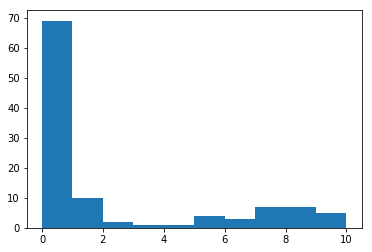

In [11]:
el_ls_C_v = glob.glob("./A2390C/fig/candidate_v3/visual/*.png")
Num_C_v = np.sort(np.array([re.compile(r'\d+').findall(el)[-1] for el in el_ls_C_v]).astype("int"))

# Match two catalogs
idx, d2d, d3d = Coords.match_to_catalog_sky(Coords_C)
plt.hist(d2d.to(u.arcsec).value, range=[0,10])

Num_C_match = Datacube_C.Tab_SE["NUMBER"][idx[d2d<2*u.arcsec]]
Num_C_v_match = np.intersect1d(Num_C_match, Num_C_v)
Tab_match_C = Datacube_C.Tab_SE[Num_C_match-1]
Tab_match_C_v = Datacube_C.Tab_SE[Num_C_v_match-1]
Tab_match_C_v

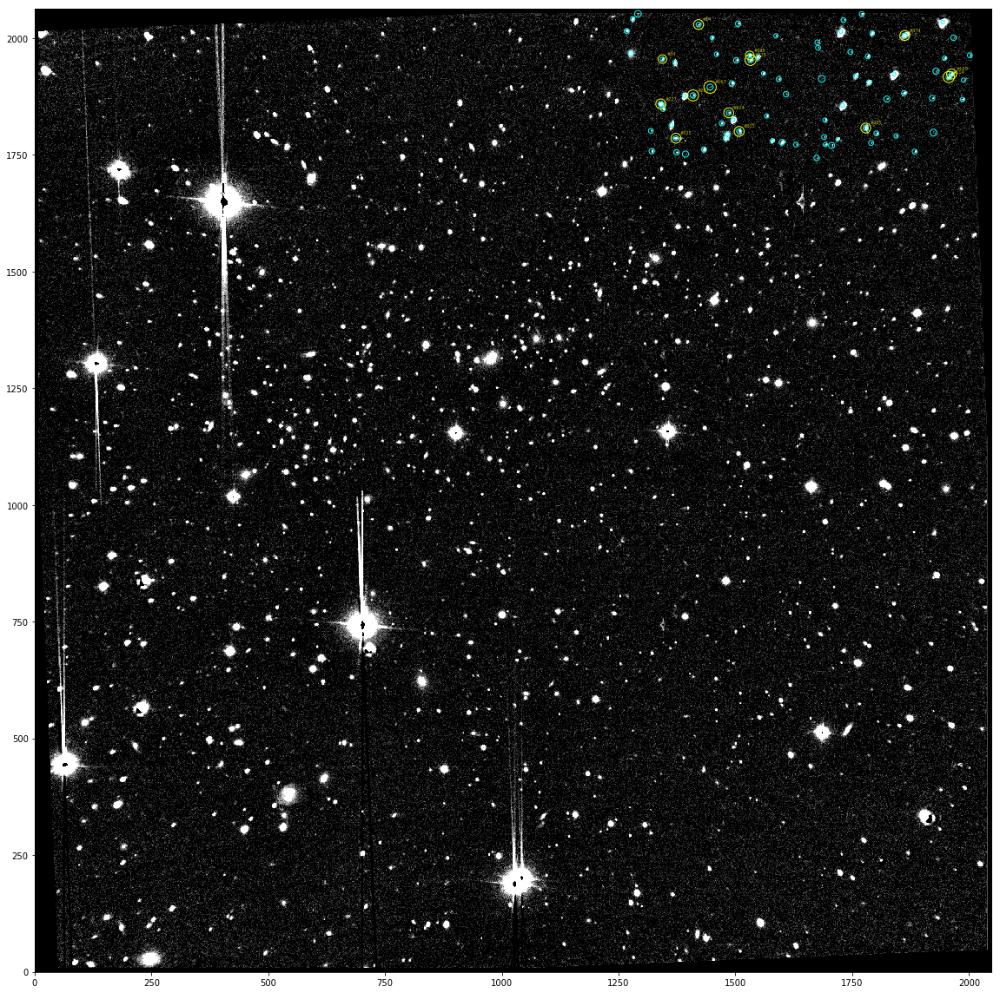

In [12]:
region_str = "\n".join(["circle(%.4f,%.4f,%.1f)"%(gal["X_IMAGE"],gal["Y_IMAGE"], gal["PETRO_RADIUS"]) for gal in Tab_match_C])
region_str = "# Region file format: DS9 version 4.1\nglobal color=cyan dashlist=8 3 width=1\nimage\n"+region_str
regs = pyregion.parse(region_str)


region_str_v = "\n".join(["circle(%.4f,%.4f,%.1f)"%(gal["X_IMAGE"],gal["Y_IMAGE"], 2*gal["PETRO_RADIUS"]) for gal in Tab_match_C_v])
region_str_v = "# Region file format: DS9 version 4.1\nglobal color=yellow dashlist=8 3 width=1\nimage\n"+region_str_v
regs_v = pyregion.parse(region_str_v)

hdu_field = fits.open('/home/qliu/Desktop/Cluster/A2390C/SE/A2390C_stack.fits')
stack_field = hdu_field[0].data

plt.figure(figsize=(16,16))
ax = plt.subplot(111)
ax.imshow(stack_field,vmin=0.001,vmax=1,origin="lower",cmap="gray")

patch_list, artist_list = regs.get_mpl_patches_texts()
for p in patch_list:
    ax.add_patch(p)
    
patch_list, artist_list = regs_v.get_mpl_patches_texts()
for p in patch_list:
    ax.add_patch(p)

Pos_C_v = np.array([(x,y) for (x,y) in zip(Tab_match_C_v["X_IMAGE"], Tab_match_C_v["Y_IMAGE"])])
for num, pos in zip(Num_C_v, Pos_C_v):
    ax.text(pos[0]+8, pos[1]+8, "#%d"%num, color="y", fontsize=5, alpha=1.0, zorder=3)
    
plt.tight_layout()
plt.savefig("/home/qliu/Pictures/cross_match-C+W.pdf",dpi=250)

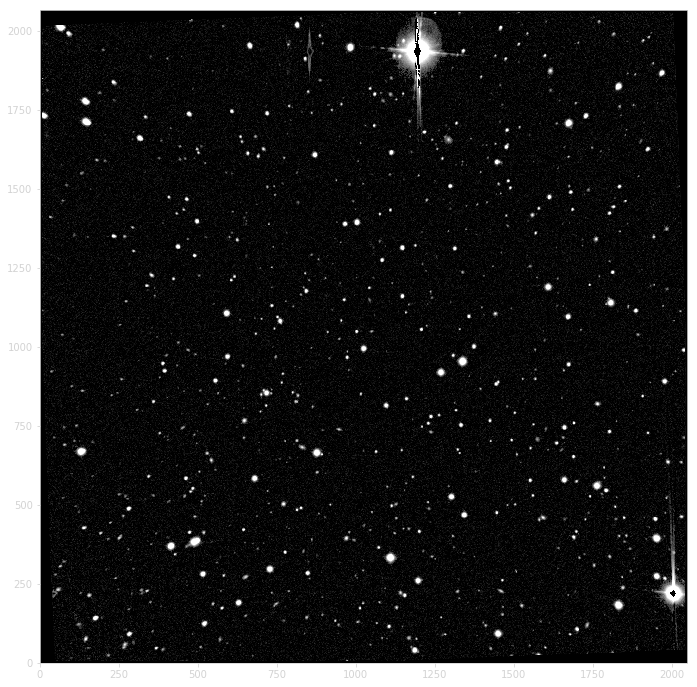

In [20]:
hdu_field = fits.open('/home/qliu/Desktop/Cluster/A2390NW/SE/A2390NW_stack.fits')
norm = ImageNormalize(stretch=AsinhStretch())
with plt.rc_context({'xtick.color':'lightgray', 'ytick.color':'lightgray', 'axes.labelcolor':'lightgray','axes.edgecolor':"lightgray"}):
    plt.figure(figsize=(12,12))
    ax = plt.subplot(111)
    ax.imshow(hdu_field[0].data,vmin=0.001,vmax=10,norm=norm, origin="lower",cmap="gray")
    plt.savefig("pic_pre/Field_A2390NW.png",dpi=150,transparent=True)

##### Find Number in SE field that appeared in C field

NUMBER,EXT_NUMBER,FLUX_ISO,FLUXERR_ISO,FLUX_AUTO,FLUXERR_AUTO,FLUX_PETRO,FLUXERR_PETRO,KRON_RADIUS,PETRO_RADIUS,BACKGROUND,THRESHOLD,ISOAREA_IMAGE,XMIN_IMAGE,YMIN_IMAGE,XMAX_IMAGE,YMAX_IMAGE,XPEAK_IMAGE,YPEAK_IMAGE,X_IMAGE,Y_IMAGE,X_WORLD,Y_WORLD,ALPHA_J2000,DELTA_J2000,A_IMAGE,B_IMAGE,THETA_IMAGE,MU_MAX,FLAGS,ELONGATION,CLASS_STAR
,,ct,ct,ct,ct,ct,ct,,,ct,ct,pix2,pix,pix,pix,pix,pix,pix,pix,pix,deg,deg,deg,deg,pix,pix,deg,mag / arcsec2,,,
int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,float64,float64
11,1,34.01354,7.938464,34.81407,9.108171,34.99788,10.0408,4.03,5.28,0.003879826,0.2397853,44,669,19,676,26,672,23,672.4422,22.9067,280.38907138,-60.121657347,280.3890714,-60.1216573,1.852,1.589,47.19,-3.0019,0,1.166,0.344
94,1,301.5699,23.5569,308.794,24.96875,295.7511,27.73745,3.5,5.28,-0.0001932671,0.2397853,268,99,113,136,145,123,123,123.9709,122.8139,257.58949291,-40.122504631,257.5894929,-40.1225046,4.405,3.542,-4.32,-3.7808,2,1.244,0.023
109,1,49.07366,9.549394,49.98884,10.6565,44.26102,12.43437,3.5,5.28,0.001924356,0.2397853,69,268,102,279,111,274,106,273.2571,106.6267,261.15062026,-44.819296084,261.1506203,-44.8192961,2.715,1.85,33.34,-2.7553,0,1.468,0.008
147,1,40.79652,8.740118,46.24128,10.23851,33.69767,13.11536,3.5,5.94,0.001467294,0.2397853,63,191,140,201,149,196,143,195.8699,144.0831,258.66680981,-41.47414445,258.6668098,-41.4741445,2.492,2.089,36.05,-2.7376,1,1.193,0.008
164,1,288.7209,22.94237,288.0097,23.39539,294.8667,24.73586,3.5,5.28,-0.001178429,0.2397853,162,540,179,554,196,547,187,547.4821,187.3975,269.00114421,-52.084917051,269.0011442,-52.0849171,3.171,2.399,68.29,-4.6111,0,1.322,0.029
218,1,172.4573,17.80234,178.4396,18.99782,168.0842,20.87955,3.53,5.28,-0.0002947557,0.2397853,148,314,223,329,238,320,231,321.0055,230.9427,259.98539264,-42.60300395,259.9853926,-42.6030039,3.272,2.764,18.68,-3.5934,3,1.184,0.021
229,1,83.28706,12.38368,76.99008,13.03626,67.43988,14.72845,3.5,5.28,0.001162827,0.2397853,85,124,217,136,226,129,221,129.2065,221.4795,256.04481106,-37.253911236,256.0448111,-37.2539112,2.846,1.89,29.06,-3.3615,0,1.506,0.018
288,1,42.12112,8.870732,46.98877,10.43462,42.18401,12.05345,3.72,5.28,-0.001989237,0.2397853,68,205,292,215,301,210,295,210.168,296.1602,256.22980359,-36.966953208,256.2298036,-36.9669532,2.88,1.731,34.82,-2.7811,0,1.664,0.008


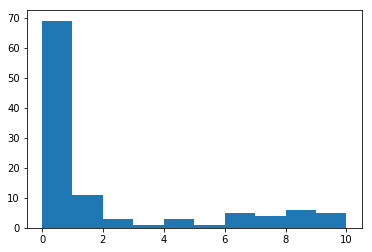

In [62]:
# Match two catalogs
idx, d2d, d3d = Coords_C.match_to_catalog_sky(Coords)
plt.hist(d2d.to(u.arcsec).value, range=[0,10],bins=10)

Num_match = Datacube.Tab_SE["NUMBER"][idx]
Num_v_match = np.intersect1d(Num_match[d2d<2*u.arcsec], Num_v)
Tab_v = Datacube.Tab_SE[Num_v-1]
Tab_match = Datacube.Tab_SE[Num_match[d2d<2*u.arcsec]-1]

ind_match_v = Num_v_match-1
Tab_match_v = Datacube.Tab_SE[ind_match_v]
Tab_match_v

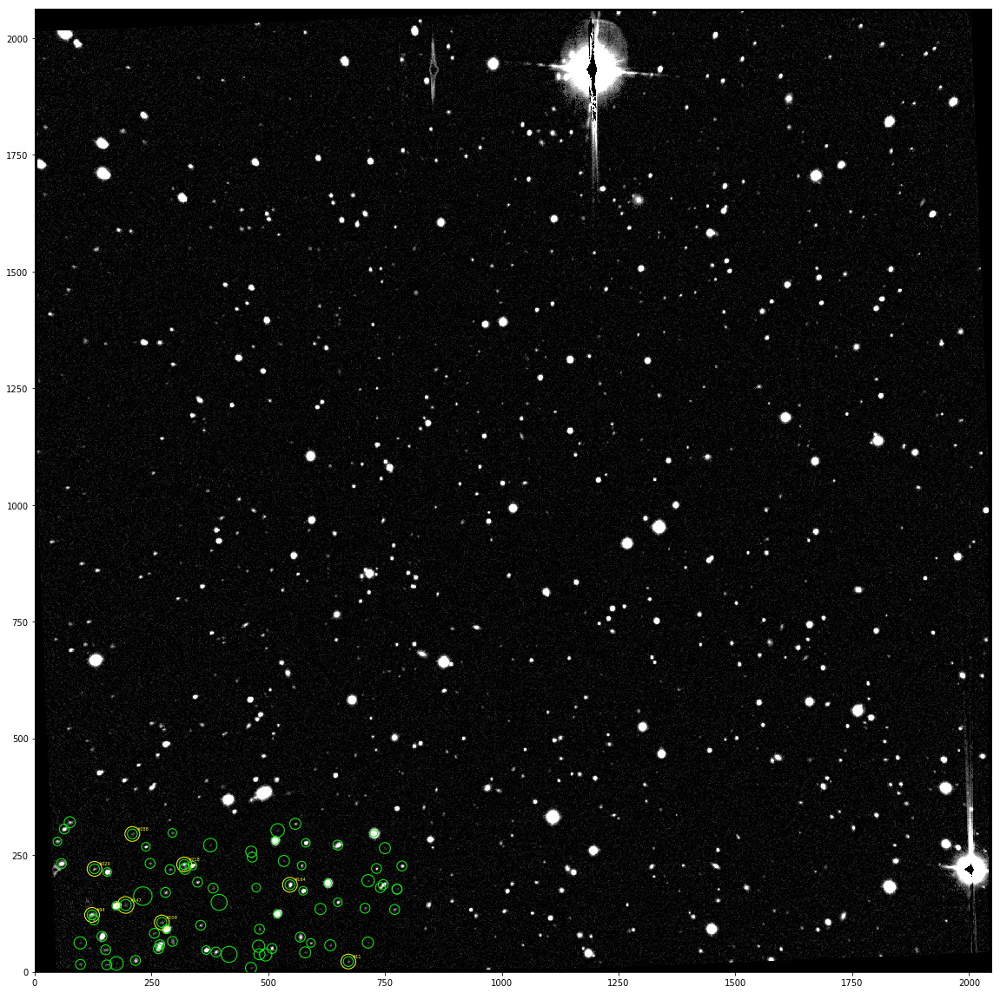

In [67]:
import pyregion

region_str = "\n".join(["circle(%.4f,%.4f,%.1f)"%(gal["X_IMAGE"],gal["Y_IMAGE"], 2*gal["PETRO_RADIUS"]) for gal in Tab_match])
region_str = "# Region file format: DS9 version 4.1\nglobal color=green dashlist=8 3 width=1\nimage\n"+region_str
regs_v = pyregion.parse(region_str)

region_str_v = "\n".join(["circle(%.4f,%.4f,%.1f)"%(gal["X_IMAGE"],gal["Y_IMAGE"], 3*gal["PETRO_RADIUS"]) for gal in Tab_match_v])
region_str_v = "# Region file format: DS9 version 4.1\nglobal color=yellow dashlist=8 3 width=1\nimage\n"+region_str_v
regs = pyregion.parse(region_str_v)

hdu_field = fits.open('/home/qliu/Desktop/Cluster/A2390NW/SE/A2390NW_stack.fits')
stack_field = hdu_field[0].data

plt.figure(figsize=(16,16))
ax = plt.subplot(111)
ax.imshow(stack_field,vmin=0.001,vmax=3,origin="lower",cmap="gray")

patch_list, artist_list = regs.get_mpl_patches_texts()
for p in patch_list:
    ax.add_patch(p)
    
patch_list, artist_list = regs_v.get_mpl_patches_texts()
for p in patch_list:
    ax.add_patch(p)
    
Pos_match_v = np.array([(x,y) for (x,y) in zip(Tab_match_v["X_IMAGE"], Tab_match_v["Y_IMAGE"])])
for num, pos in zip(Num_v_match, Pos_match_v):
    ax.text(pos[0]+8, pos[1]+8, "#%d"%num, color="yellow", fontsize=5, alpha=1.0, zorder=3)
    
plt.tight_layout()
plt.savefig("/home/qliu/Pictures/cross_match-NW.pdf",dpi=250)